# Rotating Scatter Mask imaging

---


created on 2021.7.12: combined standard Lasso, CNN-based PnP. Both Matrix-vector and FFT version.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# %% load library
import numpy as np
import scipy as sp
import scipy.io as sio
import matplotlib.pyplot as plt
from numpy import linalg as LA
from scipy.sparse import linalg as SLA
# import cvxpy as cp
import scipy.io
import time
from sklearn.preprocessing import normalize

# used for Plug-and-Play ADMM


# from bm3d import bm3d

# from sporco.linalg import _cg_wrapper
# from sporco.admm.ppp import PPP
# from sporco.interp import bilinear_demosaic
# from sporco import metric
# from sporco import util
# from sporco import plot

from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.feature_extraction.image import extract_patches_2d
from sklearn.feature_extraction.image import reconstruct_from_patches_2d

from sklearn.datasets import make_sparse_coded_signal
from sklearn.decomposition import DictionaryLearning

from skimage.restoration import denoise_tv_chambolle
from skimage.restoration import denoise_tv_bregman


import os.path
import cv2
import torch
# from SSIM_PIL import compare_ssim 
from skimage.metrics import structural_similarity as ssim

In [ ]:
# Accessing Google Drive from Google Colab (Note to teammates: hope the shared folder will be mounted as well)
from google.colab import drive 
drive.mount('/content/drive')
# change path to the google drive path
!pwd
%cd /content/drive/MyDrive/Nuclear Particle Detection Project/Rotating Scatter Mask Imaging
!pwd


Mounted at /content/drive
/content
/content/drive/MyDrive/Nuclear Particle Detection Project/Rotating Scatter Mask Imaging
/content/drive/MyDrive/Nuclear Particle Detection Project/Rotating Scatter Mask Imaging


In [3]:
#local files: utils was self-written by author, check utils folder
from PnP_model.utils import utils_deblur
from PnP_model.utils import utils_logger
from PnP_model.utils import utils_model
from PnP_model.utils import utils_pnp as pnp
from PnP_model.utils import utils_sisr as sr
from PnP_model.utils import utils_image as util

## Load Data: choose 5-deg, 2-deg or 1-deg resolution

---



There is a raw system matrix in 1-deg.

### Dataset1: load 'Landon-data': 5-deg bins

In [26]:
# %% load 'Landon-data': 5-deg bins
# ============================================ 
# Folder 'Landon-data'
# --- 5 degree resolution: 30 * 72
# --- shape: ring, point
# =============================================

# for some unknown reasons, cannot access the files in Landon-Data folder directly
%cd Landon-Data

# raw DRM
matfile = scipy.io.loadmat('PHI5-raw.mat') 
Phi = matfile['PHI']

# pre-processed DRM
# matfile = scipy.io.loadmat('PHI.mat') 
# Phi = matfile['PHI']

matfile = scipy.io.loadmat('source0.mat')
A0 = matfile['source0'] # A: activation, ring source

matfile = scipy.io.loadmat('source1.mat')
A1 = matfile['source1'] # point source

# hand-craft A2
m, n = A1.shape
A2 = np.zeros((m, n))
A2[int(m/2)-2:int(m/2)+2, int(n/2)-2:int(n/2)+2] = 1 # hand-crafted


# Optional: move the ring source
# # =====================================================
# # Option1: make A0 symmetric, and lie in the center
# # =====================================================
# index_A0 = np.arange(m)
# index_A0_roll = np.roll(index_A0, -1) # shift A0 up by 1 - to lie in the center
# A0 = A0[index_A0_roll, :]

# mid_col = int(n/2)
# index_A0 = np.arange(mid_col, n)
# index_A0_roll = np.roll(index_A0, -1) # delete a column in the middle 

# A0[:,mid_col:n] = A0[:,index_A0_roll]
# A0[:,n-1] = 0

# =====================================
# Option2: make A0 not in the center
# =====================================
# plt.gray() # plot gray scale
# index_A0 = np.arange(m)
# index_A0_roll = np.roll(index_A0, 2) # shift A0 down/up
# A0 = A0[index_A0_roll, :]

# fig, ax = plt.subplots()
# a_img = plt.imshow(A0) # or, gray scale: cmap='gray'
# ax.title.set_text('Activation A0')
# fig.colorbar(a_img)


%cd ..

c:\Users\22057\Dropbox (University of Michigan)\UMich\Research\Rotating Scatter Mask Imaging\Landon-Data
c:\Users\22057\Dropbox (University of Michigan)\UMich\Research\Rotating Scatter Mask Imaging


### Dataset2: load 'Training Suite - 2 deg bins'

---

(2021.7.12: This is the resolution Darren and Landon is testing on;
Notice: the DRM is also raw!)

In [4]:
# ==================================================================
# Folder 'Training Suite - 2 deg bins' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================
matfile = scipy.io.loadmat('Training Suite - 2 deg bins/PHI2.mat') 
Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

matfile = scipy.io.loadmat('Training Suite - 2 deg bins/S10.mat')
A0 = matfile['S10'] 

matfile = scipy.io.loadmat('Training Suite - 2 deg bins/S6.mat')
A1 = matfile['S6'] 

matfile = scipy.io.loadmat('Training Suite - 2 deg bins/S18.mat')
A2 = matfile['S18'] 

### Dataset4: load 'RSM-training-set(with noise)': 2 deg bins
---
2021.9: uploaded

naming convention of sources: seems to shift 'Training Suite - 2 deg bins' by one


In [6]:

# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================
matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

matfile = scipy.io.loadmat('RSM-training-set(with noise)/S11n0.mat')
A0 = matfile['S11.0'] 

matfile = scipy.io.loadmat('RSM-training-set(with noise)/y11n0.mat')
y0_n0 = matfile['y11.0'] 
y0_n0 = y0_n0.ravel()

matfile = scipy.io.loadmat('RSM-training-set(with noise)/y11n1.mat')
y0_n1 = matfile['y11.333333333333334'] 
y0_n1 = y0_n1.ravel()

matfile = scipy.io.loadmat('RSM-training-set(with noise)/y11n2.mat')
y0_n2 = matfile['y11.666666666666666'] 
y0_n2 = y0_n2.ravel()


matfile = scipy.io.loadmat('RSM-training-set(with noise)/S7n0.mat')
A1 = matfile['S7.0'] # small ring

# matfile = scipy.io.loadmat('RSM-training-set(with noise)/S19n0.mat')
# A2 = matfile['S19.0'] # medium square
matfile = scipy.io.loadmat('RSM-training-set(with noise)/S3n0.mat')
A2 = matfile['S3.0'] # small circle

### Dataset3: load 'Training Suite - 1 deg bins'
---
Original folder name: 'Training(Validation) Suite': 1-deg bins

Notice there is a raw DRM and a pre-processed one.

In [ ]:
# ==================================================
# Folder 'Training Suite - 1 deg bins'
# --- 1 degree resolution: 150*360
# --- 4 shapes: disc, ring, point, rect
# ===================================================
matfile = scipy.io.loadmat('Training Suite - 1 deg bins/PHI.mat') 
Phi = matfile['PHI'] # notice the name

matfile = scipy.io.loadmat('Training Suite - 1 deg bins/PHI-raw.mat') 
Phi_raw = matfile['PHI'] # notice the name

matfile = scipy.io.loadmat('Training Suite - 1 deg bins/S10.mat')
A0 = matfile['S10'] # big ring source

matfile = scipy.io.loadmat('Training Suite - 1 deg bins/S6.mat')
A1 = matfile['S6'] 

matfile = scipy.io.loadmat('Training Suite - 1 deg bins/S18.mat')
A2 = matfile['S18'] 


## Some helper functions (generate DRM, DRC, fft, ...)

In [7]:
# ========================================
# some helper functions (e.g., FFT)
# =======================================
from numpy.fft import fft, ifft
from scipy.linalg import circulant

# ==================================================
# %% circular correlation via FFT
# ==================================================
def periodic_corr(x, y):
    """Periodic correlation, implemented using the FFT.
    x and y must be real sequences with the same length.
    """
    return ifft(fft(x).conj() * fft(y)).real # notice the order

def periodic_conv(x, y):
    """Periodic convolution, implemented using the FFT.
    x and y must be real sequences with the same length.
    """
    return ifft(fft(x) * fft(y)).real # notice the order

def multiplyDRM(DRM, A): # DRM \corr A = PHi * a
    m, n = DRM.shape
    x = np.zeros(n)
    for i in range(m):
        x = x + periodic_corr(DRM[i,:], A[i,:]) # notice the order!
    return x

def multiplyDRM_T(DRM, x): # Phi.T @ x
    m, n = DRM.shape
    arr = []
    for i in range(m):
        arr.append(periodic_conv(DRM[i,:], x)) # notice, use conv!
    arr = np.array(arr).ravel()
    return arr

# ================================================
# used in ADMM: choosing hyperparameter associated with Lagrangian multiplier
# ================================================
def get_rho_sigma(sigma=2.55/255, iter_num=15, modelSigma1=49.0, modelSigma2=2.55, w=1.0, lambd=0.23):
    '''
    One can change the sigma to implicitly change the trade-off parameter
    between fidelity term and prior term
    '''
    modelSigmaS = np.logspace(np.log10(modelSigma1), np.log10(modelSigma2), iter_num).astype(np.float32)
    modelSigmaS_lin = np.linspace(modelSigma1, modelSigma2, iter_num).astype(np.float32)
    sigmas = (modelSigmaS*w+modelSigmaS_lin*(1-w))/255.
    rhos = list(map(lambda x: lambd*(sigma**2)/(x**2), sigmas))
    return rhos, sigmas

# ====================================================
# used to generate Phi corresponding to that DRM
# ====================================================
def generate_Phi(DRM):
    m, n = DRM.shape
    Phi = np.zeros(shape=(n,m*n))
    for i in range(0,m):
        Di = circulant(DRM[i,:])
        Phi[:,i*n:(i+1)*n] = Di.T

    return Phi

# =======================================================
# calculate the mutual coherence of Phi generated by DRM: calculate all auto-correlation and cross-correlation
# ========================================================
def mutual_coherence_circ(DRM): 
    m, n = DRM.shape
    # mut_coh_mat = np.zeros(shape=(m*(m+1)/2, n)) # matrix, each row stores the auto/cross-corelation
    mut_coh_mat = []
    for i in range(m):
        for j in range(i,m):
            di = DRM[i,:]
            dj = DRM[j,:]
            corr_array = np.abs(periodic_corr(di, dj))/(LA.norm(di)*LA.norm(dj)) # use the self-written equation
            if i == j: 
                corr_array[0] = 0
            mut_coh_mat.append(corr_array)

    mut_coh_mat = np.array(mut_coh_mat)
    # mut_coh_mat[mut_coh_mat > 0.999] = 0 # exclude auto-correlation with no shift
    return mut_coh_mat

# =============================================================
# used for the clever way of inverting Phi.T @ Phi
# =============================================================
def fft_patch(a, m, n): # a is a vector representing a vectorized image; apply FFT to each n array block
    A = np.reshape(a, (m, n))
    A_fft = fft(A, n=n, axis=1)
    a_fft = A_fft.ravel()
    return a_fft

def ifft_patch(a, m, n): # a is a vector representing a vectorized image; apply inverse FFT to each n array block
    A = np.reshape(a, (m, n))
    A_ifft = ifft(A, n=n, axis=1).real
    a_ifft = A_ifft.ravel()
    return a_ifft

def multiplyGramPhi(DRM, a): # an important function: Phi.T @ Phi @ a by fft
    m, n = DRM.shape 
    a_fft = fft_patch(a, m, n)

    DRM_fft = fft(DRM, n = n, axis=1)
    sigma_mat = sp.sparse.diags(DRM_fft[0,:])
    for i in range(1,m):
        sigma_mat = sp.sparse.vstack([sigma_mat, sp.sparse.diags(DRM_fft[i,:])])

    # # for comparsion perpose
    # A = np.reshape(a, (m,n))
    # test = multiplyDRM(DRM, A) 
    # test_fft = ifft(sigma_mat.H @ a_fft ).real
    # test = multiplyDRM_T(DRM, test)

    output = ifft_patch(sigma_mat @ sigma_mat.H @ a_fft, m, n) # be careful, should not take ifft directly!
    return output # notice should be conjugate transpose, rather than transpose!


def isDiag(M):
    return np.count_nonzero(M - np.diag(np.diagonal(M))) == 0

def isSparseDiag(M):
    return ( sp.sparse.csr_matrix.count_nonzero(M - sp.sparse.diags(M.diagonal())) == 0)

def diag_blk_inv(M,k): # an important function: inversion of matrix made of diagonal blocks
    if k == 1:
        assert isSparseDiag(M), "The smallest block is not a sparse diagonal matrix!"
        N = sp.sparse.diags( 1.0 /M.diagonal() )
        return N

    assert M.shape[0] == M.shape[1], "Must be square!"
    assert np.remainder(M.shape[0], k) == 0, "Must be divisible by k!"
    n = int(M.shape[0] / k)

    # extract 4 blocks
    A = M[0:(k-1)*n, 0:(k-1)*n]
    B = M[0:(k-1)*n, (k-1)*n:k*n]
    C = M[(k-1)*n:k*n, 0:(k-1)*n]
    D = M[(k-1)*n:k*n, (k-1)*n:k*n]

    # use blockwise inversion formula
    # https://en.wikipedia.org/wiki/Invertible_matrix#Blockwise_inversion
    Ainv = diag_blk_inv(A, k-1) # call recursively
    # Schur complement
    S = D - C @ Ainv @ B
    assert isSparseDiag(S), "Schur complement should be diagonal!"
    Sinv = diag_blk_inv(S, 1)
    N = sp.sparse.vstack( [ sp.sparse.hstack([Ainv + Ainv@B@Sinv@C@Ainv, -Ainv@B@Sinv]), sp.sparse.hstack([-Sinv*C*Ainv, Sinv]) ] )
    
    return N


def multiplyGramDRM_inv(DRM, a, reg_mat): # the final function that is used to calculate: (Phi.T @ Phi + beta * I)^{-1} @ a
    # reg_mat is the regularization matrix (maybe an identify matrix)
    m, n = DRM.shape 
    a_fft = fft_patch(a, m, n)

    DRM_fft = fft(DRM, n = n, axis=1)
    sigma_mat = sp.sparse.diags(DRM_fft[0,:])
    
    for i in range(1,m):
        sigma_mat = sp.sparse.vstack([sigma_mat, sp.sparse.diags(DRM_fft[i,:])])

    M_toInv = sigma_mat @ sigma_mat.H + reg_mat
    M_Inv = diag_blk_inv(M_toInv, m)

    output = ifft_patch(M_Inv @ a_fft, m, n) # be careful, should not take ifft directly!

    return output # notice should be conjugate transpose, rather than transpose!




def multiplyGramPhi_inv_lemma(Phi, a, beta):
    n, mn = Phi.shape
    m = int(mn / n)
    output = a/beta - 1/(beta ** 2) * np.squeeze(np.asarray(Phi.T @ LA.inv(sp.sparse.identity(n) + 1/beta * Phi @ Phi.T) @ Phi @ a))
    return output



def multiplyGramDRM_inv_lemma(DRM, a, beta): # This is what actually used
    m, n = DRM.shape 
    DRM_fft = fft(DRM, n = n, axis = 1)
    diag_fft = 1 + np.sum(np.abs(DRM_fft) ** 2, axis=0) / beta

    diag_fft_inv = 1/diag_fft

    # dft_mat = scipy.linalg.dft(n)
    # gram_inv_mat = dft_mat.conj().T/n @ np.diag(diag_fft_inv) @ dft_mat
    # A = np.reshape(a, (m,n))
    # output = a/beta - 1/(beta ** 2) * np.squeeze( np.asarray(multiplyDRM_T(DRM, gram_inv_mat @ multiplyDRM(DRM, A))) )

    A = np.reshape(a, (m,n))
    output = a/beta - 1/(beta ** 2) * np.squeeze( np.asarray(multiplyDRM_T(DRM, ifft( diag_fft_inv * fft(multiplyDRM(DRM, A)))).real) )  # elementwise vector product

    return output

def multiplyGramDRM_inv_mlem(DRM, signal_mean, beta=1):
    m, n = DRM.shape 
    DRM_fft = fft(DRM, n = n, axis = 1)
    diag_fft = np.sum(np.abs(DRM_fft) ** 2, axis=0) / beta

    diag_fft_inv = 1/diag_fft

    output = np.squeeze( np.asarray(multiplyDRM_T(DRM, ifft( diag_fft_inv * np.ones(n) * signal_mean)).real) )  # elementwise vector product

    return output


# calculate signal-to-noise ratio (for the zero-mean signal)
def SNR(x, var):
    return 10 * np.log10(np.var(x)/var)

def PSNR(x, var):
    return 10 * np.log10(np.amax(np.abs(x) ** 2)/var)

In [ ]:
mutual_coherence_circ(DRM_norm)

array([[ 1.        ,  0.92801175,  0.80545531, ...,  0.67287898,
         0.80545531,  0.92801175],
       [ 0.4734796 ,  0.55637423,  0.57053558, ..., -0.07652787,
         0.1334628 ,  0.32734054],
       [ 0.09170682,  0.21321986,  0.32993549, ..., -0.33900346,
        -0.20436143, -0.05300986],
       ...,
       [ 0.        ,  0.73533089,  0.26900701, ...,  0.03083354,
         0.26900701,  0.73533089],
       [ 0.81589716,  0.64587331,  0.30142029, ...,  0.06933375,
         0.25144761,  0.60027833],
       [ 0.        ,  0.77791768,  0.37056444, ...,  0.11023571,
         0.37056444,  0.77791768]])

## Load image and DRM, then get DRC 

### Load image and do plotting

<Figure size 432x288 with 0 Axes>

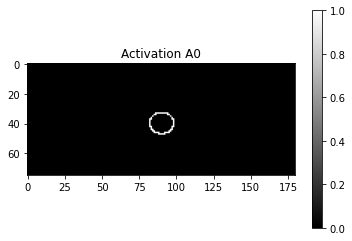

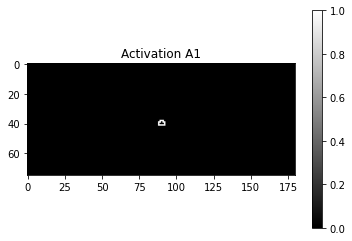

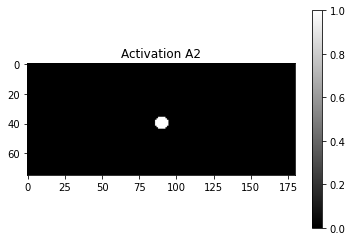

In [8]:
# %% pre-process image (activation): unroll into vector form
m, n = A0.shape
a0 = A0.ravel() # unroll w.r.t. row
a1 = A1.ravel()
a2 = A2.ravel()

plt.gray() # plot gray scale

fig, ax = plt.subplots()
a_img = plt.imshow(A0) # or, gray scale: cmap='gray'
ax.title.set_text('Activation A0')
fig.colorbar(a_img)

fig, ax = plt.subplots()
a_img = plt.imshow(A1)
ax.title.set_text('Activation A1')
fig.colorbar(a_img)

fig, ax = plt.subplots()
a_img = plt.imshow(A2)
ax.title.set_text('Activation A2')
fig.colorbar(a_img)

### Get "original" DRM & DRC

DRM origin is of size:  (75, 180)  with rank  75
norm of each row of DRM is: [0.12332434 0.12341485 0.12359697 0.12782765 0.1329463  0.13759772
 0.14240023 0.14657197 0.15262609 0.15809838 0.16091284 0.16455182
 0.16629973 0.16873599 0.17056181 0.17223767 0.17458917 0.17576445
 0.17677574 0.17842152 0.17729054 0.17809415 0.17730361 0.1769196
 0.17814712 0.17915716 0.18067231 0.18096191 0.18128905 0.18301337
 0.18507862 0.18625219 0.18826809 0.18997522 0.19178837 0.19394217
 0.19542184 0.19712476 0.19785362 0.19927911 0.19860213 0.19960313
 0.20055818 0.20159828 0.20316284 0.20252903 0.20269632 0.20273081
 0.203578   0.20507685 0.20642475 0.20691029 0.2069651  0.20648342
 0.20779763 0.20574041 0.20369122 0.2013675  0.20021567 0.20191227
 0.20225219 0.20038985 0.20015006 0.2001881  0.20260386 0.20289273
 0.20278067 0.20302326 0.20515113 0.20648186 0.20905277 0.21074694
 0.20903628 0.20714239 0.20437417]
Condition number of DRM.T: 7681.731882437321
Condition number of the matrix with colu

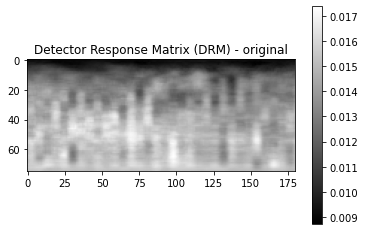

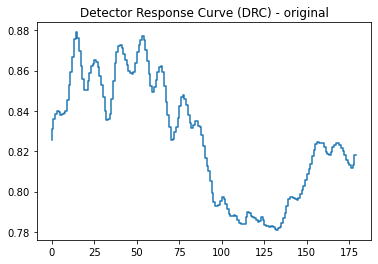

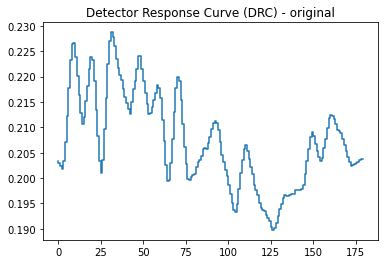

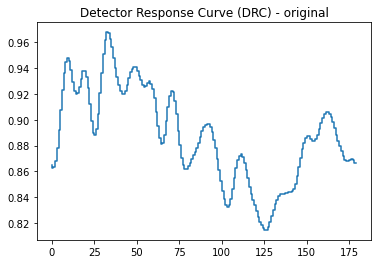

In [8]:
# %% Get "original DRC": using DRM_origin and image of 0/1
# ==================================================================
# get DRC: 
# method #1: matrix-vector product (not use this anymore)
# method #2: FFT
# ==================================================================

# %% pre-process DRM: get DRM from the big circulant matrix given by AFIT
DRM_origin = np.reshape(Phi[0,:], (m,n))
Phi_origin = Phi

U_drm, sig_drm, VT_drm = LA.svd(DRM_origin)

print("DRM origin is of size: ", DRM_origin.shape, " with rank ", LA.matrix_rank(DRM_origin))
print("norm of each row of DRM is:", LA.norm(DRM_origin, axis=1))

print("Condition number of DRM.T:", LA.cond(DRM_origin.T))
print("Condition number of the matrix with columns selected out by a0: ", LA.cond(Phi_origin[:, a0 > 0.0]))
print("Mutual Coherence of Phi: max = ", np.max(mutual_coherence_circ(DRM_origin)), ", avg =", np.mean(mutual_coherence_circ(DRM_origin)))

fig, ax = plt.subplots()
a_img = plt.imshow(DRM_origin)
ax.title.set_text('Detector Response Matrix (DRM) - original')
# plt.xlabel('$\\theta$')
# plt.ylabel('$\phi$')
fig.colorbar(a_img)



# x0 = Phi @ a0 # DRC
x0_origin = multiplyDRM(DRM_origin, A0)

fig, ax = plt.subplots()
a_img = plt.step(range(n), x0_origin)
ax.title.set_text('Detector Response Curve (DRC) - original')

# x1 = Phi @ a1 # DRC
x1_origin = multiplyDRM(DRM_origin, A1)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x1_origin)
ax.title.set_text('Detector Response Curve (DRC) - original')

# x2 = Phi @ a2 # DRC
x2_origin = multiplyDRM(DRM_origin, A2)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x2_origin)
ax.title.set_text('Detector Response Curve (DRC) - original')

NameError: name 'y0_n0' is not defined

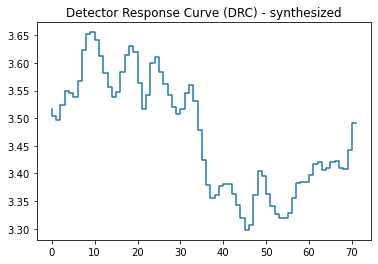

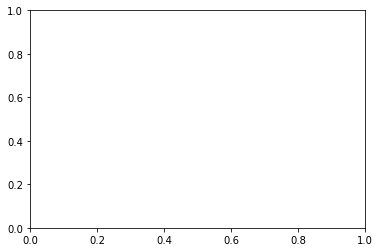

In [21]:
fig, ax = plt.subplots()
a_img = plt.step(range(n), x0_origin)
ax.title.set_text('Detector Response Curve (DRC) - synthesized')

fig, ax = plt.subplots()
a_img = plt.step(range(n), y0_n0)
ax.title.set_text('Detector Response Curve (DRC) - given')

### Get "normalized" DRM & DRC
----
The pre-processing way suggested by AFIT

DRM origin is of size:  (75, 180)  with rank  75
norm of each row of DRM is: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
Condition number of DRM.T: 155.000517011862
Condition number of the matrix with columns selected out by a0:  106.0118453024063
Mutual Coherence of Phi: max =  0.9836562095694787 , avg = 0.1643023690846549


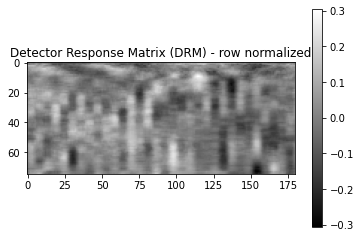

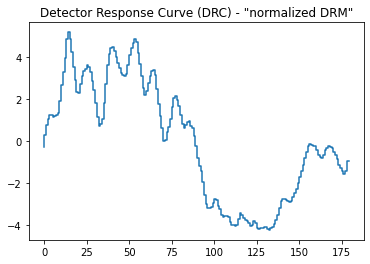

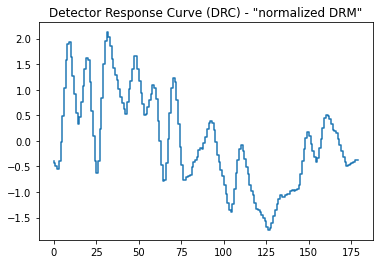

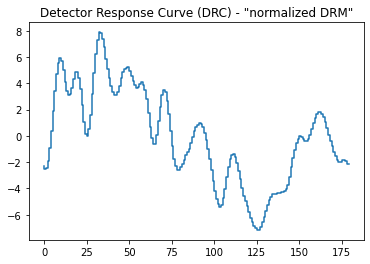

In [9]:
# %% Getting "normalized DRC": using DRM_norm and image of 0/1 
# ==================================================================
# get DRC: 
# method #1: matrix-vector product (not use this anymore)
# method #2: FFT
# ==================================================================
# Do the normalization, (needed for 2-deg and 1-deg mask) - optional (some already normalized)
DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm
Phi_norm = generate_Phi(DRM_norm)

# DRM_norm = normalize(DRM_origin, axis=1, norm='l2') # only do normalization

# # Play with DRM: flip up-down/ left-right
# DRM_flipud = np.flipud(DRM_origin)
# DRM_fliplr = np.fliplr(DRM_origin)

print("DRM origin is of size: ", DRM_norm.shape, " with rank ", LA.matrix_rank(DRM_norm))
print("norm of each row of DRM is:", LA.norm(DRM_norm, axis=1))

print("Condition number of DRM.T:", LA.cond(DRM_norm.T))
print("Condition number of the matrix with columns selected out by a0: ", LA.cond(Phi_norm[:, a0 > 0.0]))

print("Mutual Coherence of Phi: max = ", np.max(mutual_coherence_circ(DRM_norm)), ", avg =", np.mean(mutual_coherence_circ(DRM_norm)))


fig, ax = plt.subplots()
a_img = plt.imshow(DRM_norm)
ax.title.set_text('Detector Response Matrix (DRM) - row normalized')
# plt.xlabel('$\\theta$')
# plt.ylabel('$\phi$')
fig.colorbar(a_img)


# x0_norm = Phi_norm @ a0 # DRC
x0_norm = multiplyDRM(DRM_norm, A0)

fig, ax = plt.subplots()
a_img = plt.step(range(n), x0_norm)
ax.title.set_text('Detector Response Curve (DRC) - "normalized DRM"') # in fact, normalized in a weird way

# x1_norm = Phi_norm @ a1 # DRC
x1_norm = multiplyDRM(DRM_norm, A1)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x1_norm)
ax.title.set_text('Detector Response Curve (DRC) - "normalized DRM"')

# x2_norm = Phi_norm @ a2 # DRC
x2_norm = multiplyDRM(DRM_norm, A2)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x2_norm)
ax.title.set_text('Detector Response Curve (DRC) - "normalized DRM"')

### Getting "count DRC"
---
using DRM_origin and image of large intensity

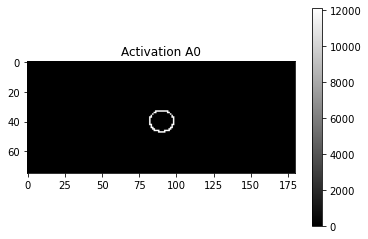

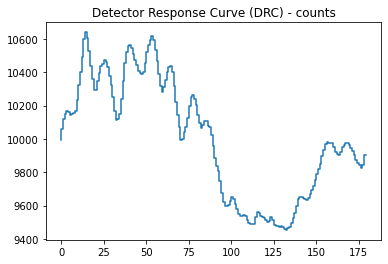

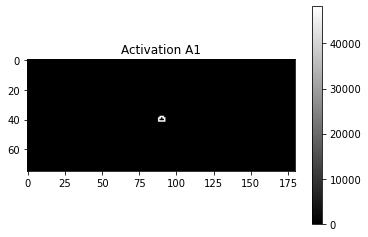

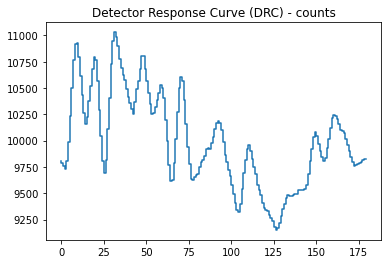

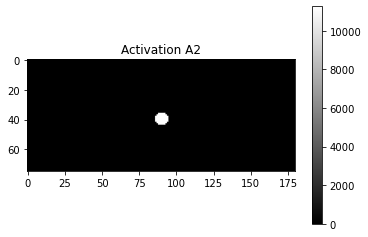

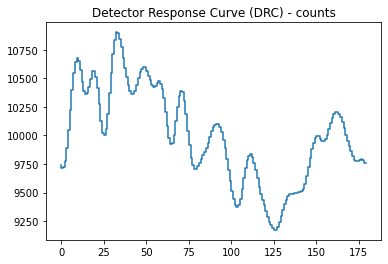

In [10]:
# %% Getting "count DRC": using DRM_origin and image of large intensity
# ==================================================================
# get DRC: 
# method #1: matrix-vector product (not use this anymore)
# method #2: FFT
# ==================================================================

# 1% noise - 10,000 mean counts - average counts for each rotational angle
meanCounts = 10000

# 4% noise - 1,600 mean counts - average counts for each rotational angle
# meanCounts = 1600

# a0
scale_of_x0 = meanCounts/np.mean(x0_origin)
A0_scale = A0 * scale_of_x0
a0_scale = a0 * scale_of_x0
x0_scale = multiplyDRM(DRM_origin, A0_scale)

fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a0_scale, (m,n))) # or, gray scale: cmap='gray'
ax.title.set_text('Activation A0')
fig.colorbar(a_img)

fig, ax = plt.subplots()
a_img = plt.step(range(n), x0_scale)
ax.title.set_text('Detector Response Curve (DRC) - counts')

# a1
scale_of_x1 = meanCounts/np.mean(x1_origin)
A1_scale = A1 * scale_of_x1
a1_scale = a1 * scale_of_x1
x1_scale = multiplyDRM(DRM_origin, A1_scale)

fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a1_scale, (m,n))) # or, gray scale: cmap='gray'
ax.title.set_text('Activation A1')
fig.colorbar(a_img)

fig, ax = plt.subplots()
a_img = plt.step(range(n), x1_scale)
ax.title.set_text('Detector Response Curve (DRC) - counts')

# a2
scale_of_x2 = meanCounts/np.mean(x2_origin)
A2_scale = A2 * scale_of_x2
a2_scale = a2 * scale_of_x2
x2_scale = multiplyDRM(DRM_origin, A2_scale)

fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a2_scale, (m,n))) # or, gray scale: cmap='gray'
ax.title.set_text('Activation A2')
fig.colorbar(a_img)

fig, ax = plt.subplots()
a_img = plt.step(range(n), x2_scale)
ax.title.set_text('Detector Response Curve (DRC) - counts')

### Getting "zero-mean DRC" (maybe a bit out-of-date - why do I say that?)
---
image: now [0, 1], ultimately for high intensity 

data: DRC_origion -> subtract mean

matrix: DRM_zeroMean

DRM origin is of size:  (75, 180)  with rank  75
norm of each row of DRM is: [0.00200935 0.00226145 0.00294671 0.00385951 0.00476855 0.00560305
 0.00565215 0.00607407 0.00625045 0.00629549 0.00729263 0.0078355
 0.00843378 0.00885698 0.00881027 0.00863053 0.00874391 0.0083578
 0.00815881 0.00768229 0.00802528 0.00890634 0.00947575 0.01049182
 0.01040785 0.01011183 0.01017547 0.01061532 0.0106287  0.01013502
 0.00883093 0.00867719 0.00856207 0.00888173 0.00924163 0.0097811
 0.00964179 0.0099307  0.0104807  0.00955315 0.00955745 0.01041639
 0.01088553 0.01139854 0.01158818 0.01111087 0.01110244 0.01048659
 0.0103167  0.01124681 0.0106793  0.01051193 0.00915544 0.0096066
 0.00941608 0.00904579 0.00935309 0.00892108 0.00886963 0.00890762
 0.00853972 0.00918883 0.00982138 0.00990439 0.01010359 0.01028784
 0.00898866 0.00906891 0.00902596 0.00891423 0.00781254 0.00657137
 0.00491692 0.00354388 0.00245115]
Condition number of DRM.T: 238.4851616488429
Condition number of the matrix with columns

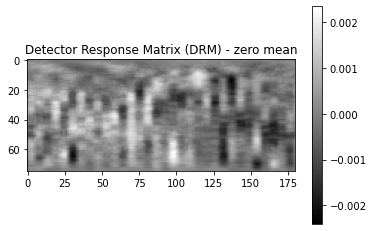

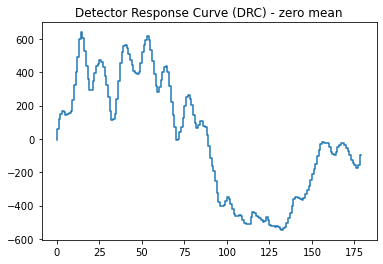

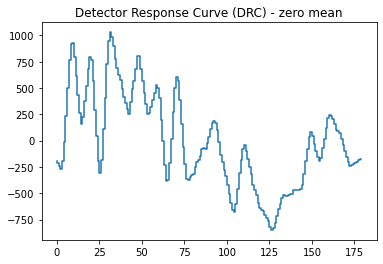

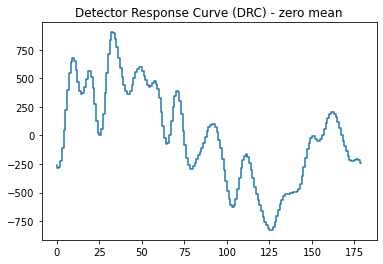

In [11]:
# %% Getting "zero-mean DRC": using DRM_zeroMean and image of 0/1 
# ==================================================================
# get DRC: 
# method #1: matrix-vector product (not use this anymore)
# method #2: FFT
# ==================================================================

DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean

Phi_zeroMean = generate_Phi(DRM_zeroMean)

# DRM_norm = normalize(DRM_origin, axis=1, norm='l2') # only do normalization

print("DRM origin is of size: ", DRM_zeroMean.shape, " with rank ", LA.matrix_rank(DRM_zeroMean))
print("norm of each row of DRM is:", LA.norm(DRM_zeroMean, axis=1))

print("Condition number of DRM.T:", LA.cond(DRM_zeroMean.T))
print("Condition number of the matrix with columns selected out by a0: ", LA.cond(Phi_zeroMean[:, a0 > 0.0]))

print("Mutual Coherence of Phi: max = ", np.max(mutual_coherence_circ(DRM_zeroMean)), ", avg =", np.mean(mutual_coherence_circ(DRM_zeroMean)))


fig, ax = plt.subplots()
a_img = plt.imshow(DRM_zeroMean)
ax.title.set_text('Detector Response Matrix (DRM) - zero mean')
# plt.xlabel('$\\theta$')
# plt.ylabel('$\phi$')
fig.colorbar(a_img)


# x0_norm = Phi_norm @ a0 # DRC
x0_zeroMean = multiplyDRM(DRM_zeroMean, A0_scale)

fig, ax = plt.subplots()
a_img = plt.step(range(n), x0_zeroMean)
ax.title.set_text('Detector Response Curve (DRC) - zero mean') # in fact, normalized in a weird way

# x1_norm = Phi_norm @ a1 # DRC
x1_zeroMean = multiplyDRM(DRM_zeroMean, A1_scale)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x1_zeroMean)
ax.title.set_text('Detector Response Curve (DRC) - zero mean')

# x2_norm = Phi_norm @ a2 # DRC
x2_zeroMean = multiplyDRM(DRM_zeroMean, A2_scale)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x2_zeroMean)
ax.title.set_text('Detector Response Curve (DRC) - zero mean')

In [45]:
Phi_zeroMean @ LA.pinv(Phi_zeroMean)  @ np.ones(n)

array([0.9940308 , 1.01761745, 0.99953051, 0.97975528, 0.98762706,
       1.00587999, 0.99591646, 0.98363948, 0.99529948, 1.02951463,
       1.01452917, 0.98188791, 0.97601324, 0.99307084, 1.008898  ,
       1.0162174 , 1.00179745, 0.99317457, 0.99195049, 0.96713723,
       0.95040315, 0.9701188 , 1.00031595, 1.01829318, 0.99565085,
       0.98930563, 1.00663439, 0.99041549, 0.97307531, 0.96728577,
       1.00715714, 1.02325363, 0.99585844, 0.96505613, 0.98607356,
       0.99542221, 0.98364927, 0.99796618, 1.00380388, 1.01040213,
       1.00940035, 0.97345704, 0.98988298, 1.02296551, 1.01627256,
       0.99706282, 0.99362311, 1.01704691, 1.02242644, 0.98204728,
       0.98560925, 1.01620948, 1.03767354, 1.01705261, 0.9978681 ,
       1.00274855, 0.99702003, 0.99629783, 0.99186602, 1.01930534,
       1.02616677, 1.00899618, 0.97293772, 0.97516911, 1.00524879,
       1.02003953, 0.99261625, 0.97830685, 0.99996742, 1.01776532,
       0.96663582, 0.96338863])

## Try for zero-mean for MLEM

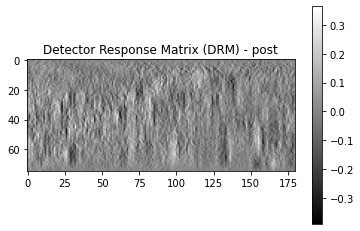

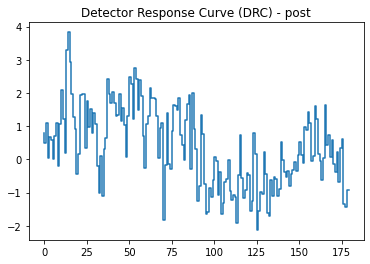

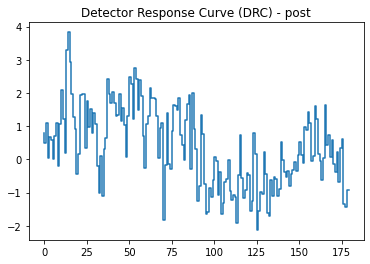

In [11]:
# %% Getting "post" DRC": postprocessing DRC_count -> what we can do in-practice
# ==================================================================
# get DRC: 
# method #1: matrix-vector product (not use this anymore)
# method #2: FFT
# ==================================================================
from scipy.linalg import sqrtm



pre_condi = np.real(LA.inv(sqrtm(Phi @ Phi.T))) * 10 # pre-conditioning matrix

Phi_post = pre_condi @ Phi

DRM_post = np.reshape(Phi_post[0,:], (m,n)) 
# Phi_post = generate_Phi(DRM_post)

fig, ax = plt.subplots()
a_img = plt.imshow(DRM_post)
ax.title.set_text('Detector Response Matrix (DRM) - post')
# plt.xlabel('$\\theta$')
# plt.ylabel('$\phi$')
fig.colorbar(a_img)

x0_post = pre_condi @ multiplyDRM(DRM_origin, A0)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x0_post)
ax.title.set_text('Detector Response Curve (DRC) - post')

x0_equiv = multiplyDRM(DRM_post, A0)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x0_equiv)
ax.title.set_text('Detector Response Curve (DRC) - post')


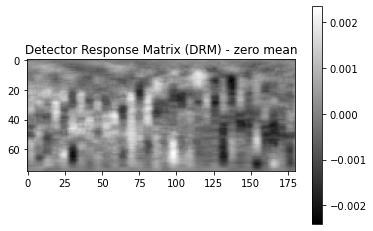

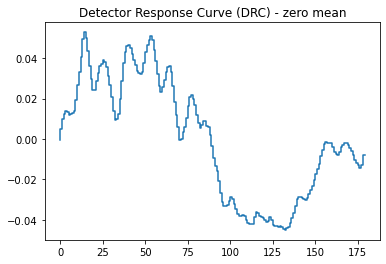

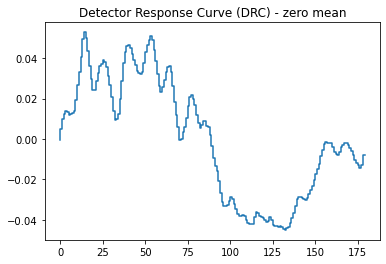

In [12]:
# check zero mean

from scipy.linalg import sqrtm



# pre_condi = np.real(LA.inv(sqrtm(Phi @ Phi.T))) * 10 # pre-conditioning matrix
# Phi_post = pre_condi @ Phi

DRM_post = DRM_origin - DRM_origin.mean(axis=1, keepdims=True)

fig, ax = plt.subplots()
a_img = plt.imshow(DRM_post)
ax.title.set_text('Detector Response Matrix (DRM) - zero mean')
# plt.xlabel('$\\theta$')
# plt.ylabel('$\phi$')
fig.colorbar(a_img)

x0_post = x0_origin - np.mean(x0_origin)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x0_post)
ax.title.set_text('Detector Response Curve (DRC) - zero mean')

x0_equiv = multiplyDRM(DRM_post, A0)
fig, ax = plt.subplots()
a_img = plt.step(range(n), x0_equiv)
ax.title.set_text('Detector Response Curve (DRC) - zero mean')

In [ ]:
(Phi_post @ Phi_post.T)[1,1]

100.00000000352391

In [ ]:
# %% Optional: only for  'RSM-training-set(with noise)' dataset
# ==================================================================
# Plot out the noisey DRC 
# ==================================================================

x0 = multiplyDRM(DRM_origin, A0)

fig, ax = plt.subplots()
a_img = plt.step(range(n), x0)
ax.title.set_text('Detector Response Curve (DRC) - Synthesized')

fig, ax = plt.subplots()
a_img = plt.step(range(n), y0_n0.ravel())
ax.title.set_text('Detector Response Curve (DRC) - no noise')

fig, ax = plt.subplots()
a_img = plt.step(range(n), y0_n1)
ax.title.set_text('Detector Response Curve (DRC) - 1% relative noise')

fig, ax = plt.subplots()
a_img = plt.step(range(n), y0_n2)
ax.title.set_text('Detector Response Curve (DRC) - 4% relative noise')

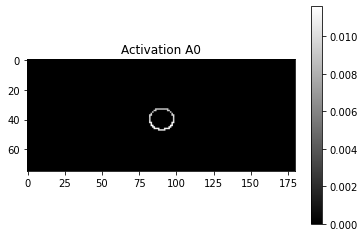

In [ ]:
fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a0 * circ_col_norm(DRM_zeroMean), (m,n))) # or, gray scale: cmap='gray'
ax.title.set_text('Activation A0')
fig.colorbar(a_img)

## Reconstruction Algorithm

---

### Simple functions

In [4]:
# %% finite difference matrix

def Dn(n): # finite difference matrix
    diagonamlem = [ - np.ones(n), np.ones(n-1), [1] ]
    Diff = sp.sparse.diags(diagonals, [0,1, -(n-1)])
    return Diff

def first_diffs_2d_matrix(m, n):
    D_c = sp.sparse.kron(sp.sparse.identity(n), Dn(m))
    D_r = sp.sparse.kron(Dn(n), sp.sparse.identity(m))
    return sp.sparse.vstack([D_c,D_r])

# ADMM parameter, used for PnP CNN
def get_rho_sigma(sigma=2.55/255, iter_num=15, modelSigma1=49.0, modelSigma2=2.55, w=1.0, lambd=0.23):
    '''
    One can change the sigma to implicitly change the trade-off parameter
    between fidelity term and prior term
    '''
    modelSigmaS = np.logspace(np.log10(modelSigma1), np.log10(modelSigma2), iter_num).astype(np.float32)
    modelSigmaS_lin = np.linspace(modelSigma1, modelSigma2, iter_num).astype(np.float32)
    sigmas = (modelSigmaS*w+modelSigmaS_lin*(1-w))/255.
    rhos = list(map(lambda x: lambd*(sigma**2)/(x**2), sigmas))
    return rhos, sigmas

def soft(z, lam):     
    return np.sign(z)*np.maximum(np.abs(z)-lam,0) 

def circ_col_norm(DRM): # column norm of the circulant matrix generated by DRM
    m, n = DRM.shape 
    lam = np.zeros(m*n)
    for i in range(m):
        lam[i*n:(i+1)*n] = LA.norm(DRM[i,:])
    return lam 

### Standard ADMM 

In [13]:
# %% Original ADMM (matrix-vector multiplication)
# =================================================================================
# Using ADMM (self-implemented)
# =================================================================================
# ADMM

# def MLEM_las(a, x, Phi, lambd, niter, m, n):
#     '''
#     MLEM with lasso regularization
#     Input:
#         a: the activation (vectorized image) - what we want, here initialize
#         x: the observed data (DRC)
#         Phi: the dictionary (generated from DRM)
#         lambd: the hyper-parameter for l-1 penalty of activation a
#         niter: number of iterations
#         m, n: shape of the image a (not the vectorized)

#     Intermediate:
#         w: the dual variable

#     Output:
#         a: the activation
#     '''


def ADMM_las(a, x, Phi, lambd, gamma, rho, niter, m, n): #lasso
    '''
    ADMM for lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    D = LA.norm(Phi, axis=0)
    Phi = normalize(Phi, axis=0, norm='l2')

    
    # # # implementation1: ref cmu  - succeed: choose rho = 1
    # z = a
    # w = z*rho # initialize 
    # Phi_outer = Phi.T @ Phi
    # id_mat = rho * sp.sparse.identity(len(Phi_outer))
    # left_matrix = Phi_outer + id_mat
    # for itr in range(niter):
    #     right_matrix = Phi.T @ x + rho*(z-w)
    #     a = LA.solve(left_matrix, right_matrix)
    #     z = soft(a + w, lambd/rho)
    #     w = w + a - z

    # # implementation 2: notation in EECS559 (z = lambd * a) - succeed: chose rho = 100
    # z = lambd * a
    # w = z # initialize 
    # for itr in range(niter):
    #     left_matrix = Phi.T @ Phi + rho * sp.sparse.identity(m*n) * lambd ** 2
    #     right_matrix = Phi.T @ x + lambd * (rho * z + w)
    #     a = LA.solve(left_matrix, right_matrix)
    #     z = soft(lambd * a - w/rho, 1/rho)
    #     w = w + rho*(z - lambd * a)   

    # implementation 3: notation in my personal notes, should be same as #1 - succeed: choose rho = 1 (original) or 1e-3 (when D^-1)


    z = (1/D) * a 
    w = z
    for itr in range(niter):
        left_matrix = Phi.T @ Phi + rho * sp.sparse.diags(1/D ** 2) 
        right_matrix = Phi.T @ x + (1/D) * (rho * z + w)
        a = LA.solve(left_matrix, right_matrix)
    #    a = SLA.lsmr(left_matrix, right_matrix)
    #    a = np.clip(a, 0, 1) # project to >= 0
        z = soft( (1/D) * a - w/rho, lambd/rho)
        w = w + rho*(z - (1/D) * a)
    
    return a, z


def ADMM_flas(a, x, Phi, lambd, gamma, rho, niter, m, n):
    '''
    ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''
    
    D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    z = D @ a
    w = z # initialize 
    left_matrix = Phi.T @ Phi + rho * D.T @ D
    for itr in range(niter):        
        right_matrix = Phi.T @ x + D.T @ (rho * z + w)
        a = LA.solve(left_matrix, right_matrix)
    #    a = LA.lstsq(left_matrix, right_matrix, rcond=None)
    #    a = SLA.lsmr(left_matrix, right_matrix)
    #    a = np.clip(a, 0, 1) # project to >= 0
        z = soft(D @ a - w/rho, 1/rho)
        w = w + rho*(z - D @ a)

    return a

def ADMM_nflas(a, x, Phi, lambd, gamma, rho, niter, m, n):
    '''
    ADMM for non-negative fused lasso (a direct clip version)
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''
    
    D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    z = D @ a
    w = z # initialize 
    for itr in range(niter):
        left_matrix = Phi.T @ Phi + rho * D.T @ D
        right_matrix = Phi.T @ x + D.T @ (rho * z + w)
        a = LA.solve(left_matrix, right_matrix)
        a = np.clip(a, 0, 1) # project to >= 0
        z = soft(D @ a - w/rho, 1/rho)
        w = w + rho*(z - D @ a)

    return a, z



def ADMM_pflas(a, x, Phi, lambd, gamma, rho, niter, m, n):
    '''
    ADMM for positive fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    # # implementation1: directly project - easiest, works
    # D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    # z = D @ a
    # w = z # initialize 
    # for itr in range(niter):
    #     left_matrix = Phi.T @ Phi + rho * D.T @ D
    #     right_matrix = Phi.T @ x + D.T @ (rho * z + w)
    #     a = LA.solve(left_matrix, right_matrix)
    #     a = np.clip(a, 0, 1) # project to >= 0
    #     b = a # b is no use in this implementation
    #     z = soft(D @ a - w/rho, 1/rho)
    #     w = w + rho*(z - D @ a)
    
    # # implementation 2: seems to work
    # D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    # z = D @ a
    # w_1 = z # initialize 
    # w_2 = z
    # b = a
    # for itr in range(niter):
    #     left_matrix = Phi.T @ Phi + rho * D.T @ D 
    #     right_matrix = Phi.T @ x + D.T @ (rho * z + w_1)
    #     a = LA.solve(left_matrix, right_matrix)     
    #     b = SLA.lsmr(D, z + w_2/rho)[0]
    #     b = np.clip(b, 0, np.inf) # project to >= 0
        
    #     z = 0.5 * ( soft(D @ a - w_1/rho, 1/rho) + soft(D @ b - w_2/rho, 1/rho) )
    #     w_1 = w_1 + rho*(z - D @ a)
    #     w_2 = w_2 + rho*(z - D @ a)

    # implementation3: based on derivation - works - select rho = 10
    D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    z = D @ a
    w_1 = z # initialize 
    b = a 
    w_2 = b
    rho_1 = rho
    rho_2 = rho/10 # /10 empirically determined
    beta = 1.2 # make rho larger
    for itr in range(niter):
        left_matrix = Phi.T @ Phi + rho_1 * D.T @ D + rho_2 * sp.sparse.identity(m*n)
        right_matrix = Phi.T @ x + D.T @ (rho_1 * z + w_1) + rho_2 * b + w_2
        a = LA.solve(left_matrix, right_matrix)

        z = soft(D @ a - w_1/rho_1, 1/rho_1)
        w_1 = w_1 + rho_1*(z - D @ a)
        rho_1 = rho_1 * beta

        b = np.clip(a - w_2/rho_2, 0, np.inf)
        w_2 = w_2 + rho_2*(b-a)   
        rho_2 = rho_2 * beta 

    return a, b


### Gradient Descent, Accerlerated Gradient Descent


In [12]:
# %% Gradient Descent, Accerlerated Gradient Descent

# Implementation of Gradient Descent
def GD(z, gf, eta, fun=lambda z,itr: 0, niter=4000, eps=1e-5):    
    '''
    Input: 
        z:     Initialization 
        gf:    Gradient function takes position argument 
        eta:   Step size
        obj:   Objective value takes position argument 
        niter: Number of iterations 
        
    Intermediate: 
        grad:  Gradient    

        
    Output: 
        z:     Final solution 
        out:   Objective values per iterations 
    '''
    out = np.empty(niter+1)
    out[0] = fun(z)
    for itr in range(niter):
        grad = gf(z)
        z = z - eta*grad
        out[itr+1] = fun(z)
        if np.abs(out[itr+1]-out[itr])/out[itr]<eps:
            # print for debugging purpose (checking convergence)
            print("Vanilla gradient descent converges after", itr, " iterations.")
            break


    return z, out[:itr+1]

# Implementation of Accelerated Proximal Gradient Descent 
def AGD(z, gf, eta, fun=lambda z: 0, niter=500, eps=1e-5):    
    '''
    Input: 
        z:     Intilalization 
        gf:    Gradient function takes position argument 
        eta:   Step size
        lam:   Regularization parameter        
        fun:   User defined function (e.g objective function)
        niter: Number of iterations 
        
    Output: 
        z: final solution 
        out: objective values per iterations 
    '''
    out = np.empty(niter+1)
    out[0] = fun(z)
    z_prev = z.copy()
    p = z.copy() 
    t_prev = 1
    beta   = 0 
    out[0] = fun(z_prev)
    
    for itr in range(niter):
    ##TODO: Implment Accelerated gradient method with restart 
        z = p - eta * gf(p)        
        out[itr+1] = fun(z)
        if np.abs(out[itr+1]-out[itr])/out[itr] < eps:
            itr = itr+1
            break
        elif out[itr+1] > out[itr]:
            t_prev = 1
            beta = 0
            p = z 
        else:
            p = z + beta * (z - z_prev)
            z_prev = z 
            t = (1+np.sqrt(1+4*t_prev**2))/2
            beta = (t_prev - 1) / t 
            t_prev = t

    # print for debugging purpose (checking convergence)
    print("Accelerated gradient descent converges after", itr, " iterations.")
   
    return z, out[:itr+1]


### Accerlaterd Standand ADMM 

In [41]:
# %% Accelerated ADMM (FFT-based)

def GP_nnls_fft(a, x, DRM, niter, m, n):
    alpha = 0.002
    for itr in range(niter):
        A = np.reshape(a, (m, n))
        a = a - alpha * multiplyDRM_T(DRM, (multiplyDRM(DRM, A)-x)) # gradient descent
        a = np.clip(a, 0, np.inf) # gradient projection, np.maximum(a, 0)

    return a

def PGD_las_fft(a, x, DRM, lambd, niter, m, n):
    alpha = 0.002 # = 1/L
    for itr in range(niter):
        A = np.reshape(a, (m, n))
        a = a - alpha * multiplyDRM_T(DRM, (multiplyDRM(DRM, A)-x)) # gradient descent
        a = soft(a, lambd * alpha) # soft thresholding
    
    return a

def MLEM_las_fft(a, x, DRM, lambd, niter, m, n):
    '''
    MLEM with lasso regularization
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    # notice lots of operations are element-wise
    for itr in range(niter): 
        A = np.reshape(a, (m, n))
        fp = multiplyDRM(DRM, A) # forward projection (fp): Phi * a
        ratio = x / (fp + 1e-6) # notice, element-wise
        correction = multiplyDRM_T(DRM, ratio) / (multiplyDRM_T(DRM, np.ones(n))+ lambd*np.ones(m*n)) # notice, element-wise
        a = a * correction # notice, element-wise, not @
    
    return a


def MLEM_mrp_fft(a, x, DRM, lambd, niter, m, n):
    '''
    MLEM with median root regularization
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    # notice lots of operations are element-wise
    for itr in range(niter): 
        A = np.reshape(a, (m, n))
        A_median = sp.ndimage.median_filter(A, size=5)
        median_diff = (A - A_median) / A_median
        fp = multiplyDRM(DRM, A) # forward projection (fp): Phi * a
        ratio = x / (fp + 1e-6) # notice, element-wise
        correction = multiplyDRM_T(DRM, ratio) / (multiplyDRM_T(DRM, np.ones(n))+ lambd*median_diff.ravel()) # notice, element-wise
        a = a * correction # notice, element-wise, not @
        
    
    return a



def ADMM_las_fft(a, x, DRM, lambd, gamma, rho, niter, m, n, verbose=False): #lasso
    '''
    ADMM for lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    # keep the unnormalized DRM and normalize the DRM
    # DRM_raw = DRM 
    # DRM = normalize(DRM, axis=1, norm='l2')

    
    # # # implementation1: ref cmu  - succeed: choose rho = 1
    # z = a
    # w = z*rho # initialize 
    # Phi_outer = Phi.T @ Phi
    # id_mat = rho * sp.sparse.identity(len(Phi_outer))
    # left_matrix = Phi_outer + id_mat
    # for itr in range(niter):
    #     right_matrix = Phi.T @ x + rho*(z-w)
    #     a = LA.solve(left_matrix, right_matrix)
    #     z = soft(a + w, lambd/rho)
    #     w = w + a - z

    # # implementation 2: notation in EECS559 - succeed: chose rho = 100
    # z = lambd * a
    # w = z # initialize 
    # for itr in range(niter):

    #     left_matrix = Phi.T @ Phi + rho * sp.sparse.identity(m*n) * lambd ** 2
    #     right_matrix = Phi.T @ x + lambd * (rho * z + w)
    #     a = LA.solve(left_matrix, right_matrix)

    #     z = soft(lambd * a - w/rho, 1/rho)
    #     w = w + rho*(z - lambd * a)   

    # implementation 3: should be same as #1 - succeed: choose rho = 1
    z = a 
    w = z
    for itr in range(niter):
        # left_matrix = Phi.T @ Phi + rho * sp.sparse.identity(m*n) 
        # right_matrix = Phi.T @ x + (rho * z + w)
        # a = LA.solve(left_matrix, right_matrix)

        right_matrix = multiplyDRM_T(DRM, x) + (rho * z + w)
        if verbose == True:
            print("Using fft version of matrix inversion lemma.")
        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, rho )

        z = soft(a - w/rho, (lambd/rho))
        # z = soft(a - w/rho, (lambd/rho)/ circ_col_norm(DRM_raw) )
        w = w + rho*(z - a)
    
    return a, z

def ADMM_tv_fft(a, x, DRM, lambd, gamma, rho, niter, m, n, verbose=False): #lasso
    '''
    ADMM for lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    # implementation 3: should be same as #1 - succeed: choose rho = 1
    z = a 
    w = z
    for itr in range(niter):
        # data fitting
        right_matrix = multiplyDRM_T(DRM, x) + (rho * z + w)
        if verbose == True:
            print("Using fft version of matrix inversion lemma.")

        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, rho )

        # tv denoising
        z = denoise_tv_chambolle(np.reshape(a - w/rho, (m,n)), weight=lambd/rho)
        z = z.ravel()        

        w = w + rho*(z - a)
    
    return a, z

def ADMM_plas_fft(a, x, DRM, lambd, gamma, rho, niter, m, n): # accelerated, using FFT, input DRM not Phi
    '''
    FFT-based (fast) ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    b = a
    w_1 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    c = a
    w_2 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a 

    rho_1 = rho 
    rho_2 = rho
    
    for itr in range(niter):        
        # 1) update: data-fitting
        right_matrix = multiplyDRM_T(DRM, x) + (rho_1 * b + w_1) + (rho_2 * c + w_2)
        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, (rho_1 + rho_2))

        # 2) update: soft thresholding
        b = soft(a - w_1/rho_1, (lambd/rho_1))
        w_1 = w_1 + rho_1*(b - a) 

        # 3) update: positivity constraint
        c = np.clip(a - w_2/rho_2, 0, np.inf)
        w_2 = w_2 + rho_2*(c - a)

    return a, b

def ADMM_ptv_fft(a, x, DRM, lambd, gamma, rho, niter, m, n): # accelerated, using FFT, input DRM not Phi
    '''
    FFT-based (fast) ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    b = a
    w_1 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    c = a
    w_2 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a 

    rho_1 = rho 
    rho_2 = rho
    
    for itr in range(niter):        
        # 1) update: data-fitting
        right_matrix = multiplyDRM_T(DRM, x) + (rho_1 * b + w_1) + (rho_2 * c + w_2)
        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, (rho_1 + rho_2))

        # 2) update: soft thresholding
        b = denoise_tv_chambolle(np.reshape(a - w_1/rho, (m,n)), weight=lambd/rho)
        b = b.ravel()
        w_1 = w_1 + rho_1*(b - a) 

        # 3) update: positivity constraint
        c = np.clip(a - w_2/rho_2, 0, np.inf)
        w_2 = w_2 + rho_2*(c - a)

    return a, b



def ADMM_flas_fft(a, x, DRM, lambd, gamma, rho, niter, m, n): # accelerated, using FFT, input DRM not Phi
    '''
    FFT-based (fast) ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    # only tv
    b = a
    w_1 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    c = a
    w_2 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a 

    rho_1 = rho 
    rho_2 = rho
    
    for itr in range(niter):        
        # 1) update: data-fitting
        right_matrix = multiplyDRM_T(DRM, x) + (rho_1 * b + w_1) + (rho_2 * c + w_2)
        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, (rho_1 + rho_2))

        # 2) update: soft thresholding
        b = soft(a - w_1/rho_1, (lambd/rho_1))
        w_1 = w_1 + rho_1*(b - a) 

        # 3) update: TV denoising
        a_w = np.reshape(a - w_2/rho_2, (m,n)) 
        c = denoise_tv_chambolle(a_w, weight= (gamma/rho_2))
        c = c.ravel() #* a_w_scale
        w_2 = w_2 + rho_2*(c - a)

    return a, b

def ADMM_pflas_fft(a, x, DRM, lambd, gamma, rho, niter, m, n):
    '''
    FFT-based (fast) ADMM for positive fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a, b: two activations (should converge to the same)
    '''

    # # implementation1: directly project - easiest, works
    # D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    # z = D @ a
    # w = z # initialize 
    # for itr in range(niter):
    #     left_matrix = Phi.T @ Phi + rho * D.T @ D
    #     right_matrix = Phi.T @ x + D.T @ (rho * z + w)
    #     a = LA.solve(left_matrix, right_matrix)
    #     a = np.clip(a, 0, 1) # project to >= 0
    #     b = a # b is no use in this implementation
    #     z = soft(D @ a - w/rho, 1/rho)
    #     w = w + rho*(z - D @ a)
    
    # # implementation 2: seems to work
    # D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    # z = D @ a
    # w_1 = z # initialize 
    # w_2 = z
    # b = a
    # for itr in range(niter):
    #     left_matrix = Phi.T @ Phi + rho * D.T @ D 
    #     right_matrix = Phi.T @ x + D.T @ (rho * z + w_1)
    #     a = LA.solve(left_matrix, right_matrix)     
    #     b = SLA.lsmr(D, z + w_2/rho)[0]
    #     b = np.clip(b, 0, np.inf) # project to >= 0
        
    #     z = 0.5 * ( soft(D @ a - w_1/rho, 1/rho) + soft(D @ b - w_2/rho, 1/rho) )
    #     w_1 = w_1 + rho*(z - D @ a)
    #     w_2 = w_2 + rho*(z - D @ a)

    # implementation3: based on derivation - works - select rho = 10
    D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    z = D @ a
    w_1 = z # initialize 
    b = a 
    w_2 = b
    rho_1 = rho
    rho_2 = rho/10 # /10 empirically determined
    beta = 1.2 # make rho larger
    for itr in range(niter):
        # left_matrix = Phi.T @ Phi + rho_1 * D.T @ D + rho_2 * sp.sparse.identity(m*n)
        right_matrix = multiplyDRM_T(DRM, x) + D.T @ (rho_1 * z + w_1) + (rho_2 * b + w_2)

        obj = lambda a: 0.5 * LA.norm(x - multiplyDRM(DRM, np.reshape(a, (m,n)))) ** 2 + rho_1/2 * LA.norm(z - D @ a + w_1/rho_1) **2 + rho_2/2 * LA.norm(b - a + w_2/rho_2) **2

        gf = lambda a: np.squeeze(np.asarray(multiplyDRM_T(DRM, multiplyDRM(DRM, np.reshape(a, (m,n)))) + rho_1 * D.T @ D @ a + rho_2 * a - right_matrix))

        # a = LA.solve(left_matrix, right_matrix)
        a, out_obj = AGD(z=a, gf=gf, eta= 1e-3, fun=obj)

        z = soft(D @ a - w_1/rho_1, 1/rho_1)
        w_1 = w_1 + rho_1*(z - D @ a)
        rho_1 = rho_1 * beta

        b = np.clip(a - w_2/rho_2, 0, np.inf)
        w_2 = w_2 + rho_2*(b-a)   
        rho_2 = rho_2 * beta 

    return a, b

def ADMM_lr_fft(a, x, DRM, lambd, gamma, rho, niter, m, n): # Low Rank, accerlated, using FFT, input DRM not Phi
    '''
    ADMM for Low Rank (nuclear norm)
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''
    
    z = a
    w = z # initialize     
   
    obj = lambda a: 0.5 * LA.norm(x - multiplyDRM(DRM, np.reshape(a, (m,n)))) ** 2 + rho/2 * LA.norm(z - a + w/rho) **2    
    
    for itr in range(niter):        
        right_matrix = multiplyDRM_T(DRM, x) +  (rho * z + w)
        gf = lambda a: np.squeeze(np.asarray(multiplyDRM_T(DRM, multiplyDRM(DRM, np.reshape(a, (m,n)))) + rho * a - right_matrix))
       
        a, out_obj = AGD(z=a, gf=gf, eta= 1e-3, fun=obj)

    #    a = np.clip(a, 0, 1) # project to >= 0
        U, Sigma, VT = LA.svd( np.reshape(a - w/rho, (m,n)), full_matrices=0 )
        Z = U @ np.diag(soft(Sigma, lambd/rho)) @ VT
        z = Z.ravel()

        w = w + rho*(z - a)

    return a


def ADMM_pflaslr_fft(a, x, DRM, lambd, gamma, omega, rho, niter, m, n):
    '''
    FFT-based (fast) ADMM for (positive) fused lasso &low-rank
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        omega: the hyper-parameter for nuclear norm penalty of activation A
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a, b: two activations (should converge to the same)
    '''

    # # implementation1: directly project - easiest, works
    # D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    # z = D @ a
    # w = z # initialize 
    # for itr in range(niter):
    #     left_matrix = Phi.T @ Phi + rho * D.T @ D
    #     right_matrix = Phi.T @ x + D.T @ (rho * z + w)
    #     a = LA.solve(left_matrix, right_matrix)
    #     a = np.clip(a, 0, 1) # project to >= 0
    #     b = a # b is no use in this implementation
    #     z = soft(D @ a - w/rho, 1/rho)
    #     w = w + rho*(z - D @ a)
    
    # # implementation 2: seems to work
    # D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    # z = D @ a
    # w_1 = z # initialize 
    # w_2 = z
    # b = a
    # for itr in range(niter):
    #     left_matrix = Phi.T @ Phi + rho * D.T @ D 
    #     right_matrix = Phi.T @ x + D.T @ (rho * z + w_1)
    #     a = LA.solve(left_matrix, right_matrix)     
    #     b = SLA.lsmr(D, z + w_2/rho)[0]
    #     b = np.clip(b, 0, np.inf) # project to >= 0
        
    #     z = 0.5 * ( soft(D @ a - w_1/rho, 1/rho) + soft(D @ b - w_2/rho, 1/rho) )
    #     w_1 = w_1 + rho*(z - D @ a)
    #     w_2 = w_2 + rho*(z - D @ a)

    # implementation3: based on derivation - works - select rho = 10
    D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    z = D @ a
    w_1 = z # initialize 
    b = a 
    w_2 = b
    rho_1 = rho
    rho_2 = rho/10 # /10 empirically determined
    beta = 1.2 # make rho larger
    for itr in range(niter):
        # left_matrix = Phi.T @ Phi + rho_1 * D.T @ D + rho_2 * sp.sparse.identity(m*n)
        right_matrix = multiplyDRM_T(DRM, x) + D.T @ (rho_1 * z + w_1) + (rho_2 * b + w_2)

        obj = lambda a: 0.5 * LA.norm(x - multiplyDRM(DRM, np.reshape(a, (m,n)))) ** 2 + rho_1/2 * LA.norm(z - D @ a + w_1/rho_1) **2 + rho_2/2 * LA.norm(b - a + w_2/rho_2) **2

        gf = lambda a: np.squeeze(np.asarray(multiplyDRM_T(DRM, multiplyDRM(DRM, np.reshape(a, (m,n)))) + rho_1 * D.T @ D @ a + rho_2 * a - right_matrix))

        # a = LA.solve(left_matrix, right_matrix)
        a, out_obj = AGD(z=a, gf=gf, eta= 1e-3, fun=obj)
        a = np.clip(a, 0, 1) # project to >= 0

        z = soft(D @ a - w_1/rho_1, 1/rho_1)
        w_1 = w_1 + rho_1*(z - D @ a)
        rho_1 = rho_1 * beta

        U, Sigma, VT = LA.svd( np.reshape(a - w_2/rho_2, (m,n)), full_matrices=0 )
        B = U @ np.diag(soft(Sigma, omega/rho_2)) @ VT
        b = B.ravel()
        # b = np.clip(a - w_2/rho_2, 0, np.inf)
        w_2 = w_2 + rho_2*(b-a)   
        rho_2 = rho_2 * beta 

    return a, b

### Plug-and-Play ADMM
---

In [8]:
# %% Plug and Play
def ADMM_pnp(a, x, Phi, lambd, gamma, rho, niter, m, n, pnp_method=0, model=None): #lasso
    '''
    ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a (not used here)
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''    

    noise_level_img = 7.65/255.0         # default: 0, noise level for LR image; 7.65/255.0
    noise_level_model = noise_level_img  # noise level of model, default 0

    modelSigma1 = 49
    modelSigma2 = noise_level_model*255.

    rhos, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd)
    
    rhos, sigmas = torch.tensor(rhos).to(device), torch.tensor(sigmas).to(device)

    a = np.single(a)
    z = a
    w = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a
    Phi_outer = Phi.T @ Phi
    id_mat = sp.sparse.identity(len(Phi_outer))
    
    for itr in range(niter):
        # rho = rhos[itr].item() / (noise_level_model ** 2)
        rho = rhos[itr].item()
        sigma = sigmas[itr].item()

        left_matrix = Phi_outer + rho * id_mat
        right_matrix = Phi.T @ x + rho * z + w
        a = LA.solve(left_matrix, right_matrix) 

        # a = soft(a, sigma ** 2)

        if pnp_method == 0: # BM3D
            z = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            z = z.ravel()
        elif pnp_method == 1: # Dictionary Learning
            dict_learner = DictionaryLearning(n_components=10, transform_algorithm='lasso_lars', random_state=42,)
            X_transformed = dict_learner.fit_transform(np.reshape(a + w, (m, n)))            
            z = X_transformed @ dict_learner.components_
            z = z.ravel()  
        elif pnp_method == 2: # cnn - DRUNet
            a_w = np.reshape(a - w/rho, (m,n))            
            a_w = np.expand_dims(a_w, axis = 2)
            a_w = util.single2tensor4(a_w).to(device)

            # noise_sigma = np.sqrt(lambd/rho) 
            # noise_sigma = torch.tensor(noise_sigma).to(device)
            # z = torch.cat((a, noise_sigma.float().repeat(1, 1, a.shape[2], a.shape[3])), dim=1) # should add float()!

            refield_size = 16
            if len(a) > 30*72:
                refield_size = 32
            
            a_w = torch.cat((a_w, sigmas[itr].float().repeat(1, 1, a_w.shape[2], a_w.shape[3])), dim=1) # should add float()!
            z = utils_model.test_mode(model, a_w, mode=2, refield=refield_size, min_size=256, modulo=16) # denoiser step
            

            z = util.tensor2single(z)
            z = z.squeeze()  
            z = z.ravel()

            # a = util.tensor2single(a) 
            # a = a.squeeze()     
            # a = a.ravel()   

        else:
            z = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            z = z.ravel()

        w = w + rho * (z - a)

        # # (optional) plot lagrangian multiplier w to see whether it looks like (guassian) noise
        # fig, ax = plt.subplots()    
        # a_img = plt.imshow(np.reshape(w, (m,n)))        
        # ax.title.set_text('Lagrange multiplier w - the "noise" ')
        # fig.colorbar(a_img)
        
    return a, z

In [9]:
# %% Plug and Play (FFT-based)
def ADMM_pnp_fft(a, x, DRM, lambd, gamma, rho, niter, m, n, pnp_method=0, model=None): #lasso
    '''
    ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a (not used here)
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''    

    noise_level_img = 7.65/255.0         # default: 0, noise level for LR image
    noise_level_model = noise_level_img  # noise level of model, default 0

    modelSigma1 = 49
    modelSigma2 = noise_level_model*255.

    rhos, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd)    
    rhos, sigmas = torch.tensor(rhos).to(device), torch.tensor(sigmas).to(device)

    a = np.single(a)
    z = a
    w = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    # # used for matrix-vector version (need to comment out)
    # Phi_outer = Phi.T @ Phi
    # id_mat = sp.sparse.identity(len(Phi_outer))
   
    for itr in range(niter):
        # rho = rhos[itr].item() / (noise_level_model ** 2)
        rho = rhos[itr].item()
        sigma = sigmas[itr].item()

        right_matrix = multiplyDRM_T(DRM, x) + (rho * z + w)

        # # closed form solution
        # left_matrix = Phi_outer + rho * id_mat
        # a_exact = LA.solve(left_matrix, right_matrix) 
        
        obj = lambda a: 0.5 * LA.norm(x - multiplyDRM(DRM, np.reshape(a, (m,n)))) ** 2 + rho/2 * LA.norm(z - a + w/rho) **2
        gf = lambda a: np.squeeze(np.asarray(multiplyDRM_T(DRM, multiplyDRM(DRM, np.reshape(a, (m,n)))) + rho * a - right_matrix))

        a, out_obj = AGD(z=a, gf=gf, eta= 5e-3, fun=obj, niter=1000)   # notice that eta is learning rate, eps is the error threshold!; 
                                                                       # initialize with a iterates fastest in general (check OneNote ADMM Summary session)



        # # (optional) plot least squares a to see whether GD same as closed-form solution
        # fig, ax = plt.subplots()  
        # a_img = plt.imshow(np.reshape(a_exact, (m,n)))
        # ax.title.set_text('Iteration {:d}, image a from closed form' .format(itr))
        # fig.colorbar(a_img)

        # fig, ax = plt.subplots()    
        # b_img = plt.imshow(np.reshape(a, (m,n)))
        # ax.title.set_text('Iteration {:d}, image a from FFT' .format(itr))
        # fig.colorbar(b_img)


        if pnp_method == 0: # BM3D
            z = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            z = z.ravel()
        elif pnp_method == 1: # Dictionary Learning
            dict_learner = DictionaryLearning(n_components=10, transform_algorithm='lasso_lars', random_state=42,)
            X_transformed = dict_learner.fit_transform(np.reshape(a + w, (m, n)))            
            z = X_transformed @ dict_learner.components_
            z = z.ravel()  
        elif pnp_method == 2: # cnn - DRUNet
            a_w = np.reshape(a - w/rho, (m,n))            
            a_w = np.expand_dims(a_w, axis = 2)
            a_w = util.single2tensor4(a_w).to(device)

            # noise_sigma = np.sqrt(lambd/rho) 
            # noise_sigma = torch.tensor(noise_sigma).to(device)
            # z = torch.cat((a, noise_sigma.float().repeat(1, 1, a.shape[2], a.shape[3])), dim=1) # should add float()!
            
            refield_size = 16
            if len(a) > 30*72:
                refield_size = 32

            a_w = torch.cat((a_w, sigmas[itr].float().repeat(1, 1, a_w.shape[2], a_w.shape[3])), dim=1) # should add float()!
            z = utils_model.test_mode(model, a_w, mode=2, refield=refield_size, min_size=256, modulo=16) # denoiser step
            

            z = util.tensor2single(z)
            z = z.squeeze()  
            z = z.ravel()

            # a = util.tensor2single(a) 
            # a = a.squeeze()     
            # a = a.ravel()   

        else:
            z = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            z = z.ravel()

        w = w + rho * (z - a)

        # # (optional) plot lagrangian multiplier w to see whether it looks like (guassian) noise
        # fig, ax = plt.subplots()    
        # a_img = plt.imshow(np.reshape(w, (m,n)))
        # ax.title.set_text('Lagrange multiplier w - the "noise" ')
        # fig.colorbar(a_img)


    return a, z

### PnP with l1 (and TV)

In [8]:
# %% Plug and Play together with fused lasso
def ADMM_pnp_flas(a, x, Phi, lambd, gamma, rho, niter, m, n, pnp_method=0, model=None): #lasso
    '''
    ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a (not used here)
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''    

    # keep the unnormalized DRM and normalize the DRM
    DRM = np.reshape(Phi[0,:], (m,n))
    DRM_raw = DRM 
    Phi_raw = Phi
    DRM = normalize(DRM, axis=1, norm='l2')
    Phi = generate_Phi(DRM) # Phi generated from normalized DRM

    noise_level_img = 7.65/255.0         # default: 0, noise level for LR image
    noise_level_model = noise_level_img  # noise level of model, default 0

    modelSigma1 = 49
    modelSigma2 = noise_level_model*255.

    rhos_1, sigmas_1 = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd)

    rhos_2, sigmas_2 = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=gamma)
    
    rhos_2, sigmas_2 = torch.tensor(rhos_2).to(device), torch.tensor(sigmas_2).to(device)

    a = np.single(a)

    # only lasso
    z = a
    w_1 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    # # fused lasso
    # D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , gamma * first_diffs_2d_matrix(m, n)])
    # z = D @ a
    # w_1 = z # initialize


    b = a
    w_2 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    Phi_outer = Phi.T @ Phi
    id_mat = sp.sparse.identity(len(Phi_outer))
    
    for itr in range(niter):
        rho_1 = rhos_1[itr].item()
        sigma_1 = sigmas_1[itr].item()

        rho_2 = rhos_2[itr].item()
        sigma_2 = sigmas_2[itr].item()

        # only lasso (lasso is enough!)
        left_matrix = Phi_outer + rho_1 * id_mat + rho_2 * id_mat
        right_matrix = Phi.T @ x + (rho_1 * z + w_1) + (rho_2 * b + w_2)
        a = LA.solve(left_matrix, right_matrix) 



        z = soft(a- w_1/rho_1, sigma_1 ** 2 / circ_col_norm(DRM_raw))
        w_1 = w_1 + rho_1*(z - a)

        # # fused lasso
        # left_matrix = Phi.T @ Phi + rho * D.T @ D + rho * sp.sparse.identity(m*n)
        # right_matrix = Phi.T @ x + D.T @ (rho * z + w_1) + rho * b + w_2
        # a = LA.solve(left_matrix, right_matrix)

        # z = soft(D @ a - w_1/rho, 1/rho * noise_level_model ** 2)
        # w_1 = w_1 + rho*(z - D @ a)

        if pnp_method == 0: # BM3D
            b = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            b = b.ravel()
        elif pnp_method == 1: # Dictionary Learning
            dict_learner = DictionaryLearning(n_components=10, transform_algorithm='lasso_lars', random_state=42,)
            X_transformed = dict_learner.fit_transform(np.reshape(a + w, (m, n)))            
            b = X_transformed @ dict_learner.components_
            b = b.ravel()  
        elif pnp_method == 2: # cnn - DRUNet
            a_w = np.reshape(a - w_2/rho_2, (m,n))  

            # rescale a_w to [0, 1]
            a_w_scale = np.max(np.abs(a_w))    
            a_w = a_w / a_w_scale    

            a_w = np.expand_dims(a_w, axis = 2)
            a_w = util.single2tensor4(a_w).to(device)

            # noise_sigma = np.sqrt(lambd/rho) 
            # noise_sigma = torch.tensor(noise_sigma).to(device)
            # b = torch.cat((a, noise_sigma.float().repeat(1, 1, a.shape[2], a.shape[3])), dim=1) # should add float()!
            
            a_w = torch.cat((a_w, sigmas_2[itr].float().repeat(1, 1, a_w.shape[2], a_w.shape[3])), dim=1) # should add float()!

            # determine reception field based on image size
            refield_size = 16
            if len(a) > 30*72:
                refield_size = 32

            b = utils_model.test_mode(model, a_w, mode=2, refield=16, min_size=256, modulo=16) # denoiser step
            

            b = util.tensor2single(b)
            b = b.squeeze()  
            b = b.ravel() * a_w_scale # scale back

            # a = util.tensor2single(a) 
            # a = a.squeeze()     
            # a = a.ravel()   

        else:
            b = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            b = b.ravel()
    
        w_2 = w_2 + rho_2 * (b - a)
    return a, b

### Accelerated Plug-and-Play ADMM
---

In [8]:
# %% Plug and Play together with fused lasso (FFT-based)
def ADMM_pnp_fft(a, x, DRM, lambd, gamma, rho, niter, m, n, pnp_method=0, model=None, verbose=False): #lasso
    '''
    ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a (not used here)
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''    

    # noise_level_img = 7.65/255.0         # default: 0, noise level for LR image
    noise_level_img = 100 # cuz noise var = 100 for mean-count = 10000
    noise_level_model = noise_level_img  # noise level of model, default 0

    # modelSigma1 = 49/255.0
    modelSigma1 = 500 / np.mean(LA.norm(DRM, axis=1)) # heuristic for image intensity range, c.f.: 0-255 for common image
    modelSigma2 = noise_level_model



    rhos, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd)
    
    rhos, sigmas = torch.tensor(rhos).to(device), torch.tensor(sigmas).to(device)

    a = np.single(a)

    # only lasso
    z = a
    w = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a
    
    for itr in range(niter):
        rho = rhos[itr].item()
        sigma = sigmas[itr].item()

        # ============================================================
        # Method 3: Using fft version of matrix inversion lemma
        # ===========================================================
        if verbose == True:
            print("Using fft version of matrix inversion lemma.")
            
        right_matrix = multiplyDRM_T(DRM, x) + (rho * z + w) 
        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, rho)

        if pnp_method == 0: # BM3D
            b = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            b = b.ravel()
        elif pnp_method == 1: # Dictionary Learning
            dict_learner = DictionaryLearning(n_components=10, transform_algorithm='lasso_lars', random_state=42,)
            X_transformed = dict_learner.fit_transform(np.reshape(a + w, (m, n)))            
            b = X_transformed @ dict_learner.components_
            b = b.ravel()  
        elif pnp_method == 2: # cnn - DRUNet
            a_w = np.reshape(a - w/rho, (m,n))    

            a_w = np.expand_dims(a_w, axis = 2)
            a_w = util.single2tensor4(a_w).to(device)

         
            # works for splitting b = a
            a_w = torch.cat((a_w, sigmas[itr].float().repeat(1, 1, a_w.shape[2], a_w.shape[3])), dim=1) # should add float()!

            # determine reception field based on image size

            refield_size = 16
            if len(a) > 30*72:
                refield_size = 32

            b = utils_model.test_mode(model, a_w, mode=2, refield=refield_size, min_size=256, modulo=16) # denoiser step
            

            # b = util.tensor2single(b) # this function claps to [0, 1]
            b = b.data.squeeze().float().cpu().numpy()
            b = b.squeeze()  
            b = b.ravel() 
            # b = b * a_w_scale # scale back


        else:
            b = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            b = b.ravel()
    
        w = w + rho * (b - a)
    return a, b




def ADMM_pnp_las_fft(a, x, DRM, lambd, gamma, rho, niter, m, n, pnp_method=0, model=None, verbose=False): #lasso
    '''
    ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a (not used here)
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''    

    # # keep the unnormalized DRM and normalize the DRM
    # DRM_raw = DRM 
    # DRM = normalize(DRM, axis=1, norm='l2')

    # noise_level_img = 7.65/255.0         # default: 0, noise level for LR image
    noise_level_img = 100 # cuz noise var = 100 for mean-count = 10000
    noise_level_model = noise_level_img  # noise level of model, default 0

    # modelSigma1 = 49/255.0
    modelSigma1 = 500 / np.mean(LA.norm(DRM, axis=1)) # heuristic for image intensity range, c.f.: 0-255 for common image
    modelSigma2 = noise_level_model

    rhos_1, sigmas_1 = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd)

    rhos_2, sigmas_2 = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=gamma)
    
    rhos_2, sigmas_2 = torch.tensor(rhos_2).to(device), torch.tensor(sigmas_2).to(device)

    a = np.single(a)

    # only lasso
    # D = sp.sparse.identity(m*n) #  be careful: whether to multiply lambd
    z = a
    w_1 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a


    # # fused lasso
    # D = sp.sparse.vstack([lambd * sp.sparse.identity(m*n) , lambd * first_diffs_2d_matrix(m, n)])
    # z = D @ a
    # w_1 = z # initialize



    b = a
    w_2 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    # # used for matrix-vector version (need to comment out)
    # Phi_outer = Phi.T @ Phi
    # id_mat = sp.sparse.identity(len(Phi_outer))
    
    for itr in range(niter):
        rho_1 = rhos_1[itr].item() #* np.mean(LA.norm(DRM, axis=1))    # rescale the rhos (cuz DRM has small norm)
        sigma_1 = np.sqrt(lambd / rho_1) # this should be the correct way

        rho_2 = rhos_2[itr].item() #* np.mean(LA.norm(DRM, axis=1)) 
        sigma_2 = sigmas_2[itr].item()

        # # =========================================
        # # Option1: only lasso (lasso is enough!)
        # # =========================================

        # # matrix-vector
        # left_matrix = Phi_outer + rho_1 * id_mat + rho_2 * id_mat
        # right_matrix = Phi.T @ x + (rho_1 * z + w_1) + (rho_2 * b + w_2)
        # a = LA.solve(left_matrix, right_matrix) 

        # # =========================================
        # # Option1 - Method 1: Using gradient descent
        # # =========================================
        # right_matrix = multiplyDRM_T(DRM, x) + D.T @ (rho_1 * z + w_1) + (rho_2 * b + w_2)
        # obj = lambda a: 0.5 * LA.norm(x - multiplyDRM(DRM, np.reshape(a, (m,n)))) ** 2 + rho_1/2 * LA.norm(z - D @ a + w_1/rho_1) **2 + rho_2/2 * LA.norm(b - a + w_2/rho_2) **2
        # gf = lambda a: np.squeeze(np.asarray(multiplyDRM_T(DRM, multiplyDRM(DRM, np.reshape(a, (m,n)))) + rho_1 * D.T @ D @ a + rho_2 * a - right_matrix))
        # a, out_obj = AGD(z=z, gf=gf, eta= 1e-3, fun=obj, niter=1000)   # notice that eta is learning rate, eps is the error threshold!


        # # =========================================
        # # Option1 - Method 2: Using clever way of inversion (actually, not so clever, ...)
        # # =========================================
        # print("Using clever way of inversion.")
        # right_matrix = multiplyDRM_T(DRM, x) + D.T @ (rho_1 * z + w_1) + (rho_2 * b + w_2)
        # a = multiplyGramPhi_inv(DRM, right_matrix, (rho_1 + rho_2) * sp.sparse.identity(m*n))

        # ============================================================
        # Method 3: Using fft version of matrix inversion lemma
        # ===========================================================
        if verbose == True:
            print("Using fft version of matrix inversion lemma.")
            
        right_matrix = multiplyDRM_T(DRM, x) + (rho_1 * z + w_1) + (rho_2 * b + w_2)
        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, (rho_1 + rho_2) )


        # update z: do not comment out!!!
        z = soft(a - w_1/rho_1, sigma_1 ** 2)
        # z = denoise_tv_chambolle(a - w_1/rho_1, weight=sigma_1 ** 2)
        # z = soft(a - w_1/rho_1, sigma_1 ** 2 / circ_col_norm(DRM_raw)) # notice the change of threshold
        w_1 = w_1 + rho_1*(z - a)

        # =========================================
        # Option2: fused lasso
        # =========================================

        # # matrix-vector
        # left_matrix = Phi.T @ Phi + rho * D.T @ D + rho * sp.sparse.identity(m*n)
        # right_matrix = Phi.T @ x + D.T @ (rho * z + w_1) + rho * b + w_2
        # a = LA.solve(left_matrix, right_matrix)

        # # FFT-based
        # right_matrix = multiplyDRM_T(DRM, x) + D.T @ (rho_1 * z + w_1) + (rho_2 * b + w_2)
        # obj = lambda a: 0.5 * LA.norm(x - multiplyDRM(DRM, np.reshape(a, (m,n)))) ** 2 + rho_1/2 * LA.norm(z - D @ a + w_1/rho_1) **2 + rho_2/2 * LA.norm(b - a + w_2/rho_2) **2
        # gf = lambda a: np.squeeze(np.asarray(multiplyDRM_T(DRM, multiplyDRM(DRM, np.reshape(a, (m,n)))) + rho_1 * D.T @ D @ a + rho_2 * a - right_matrix))
        # # a, out_obj = AGD(z=a, gf=gf, eta= 1e-3, fun=obj) # too slow  
        # a, out_obj = AGD(z=a, gf=gf, eta= 1e-2, fun=obj, niter=1000)   # notice that eta is learning rate, eps is the error threshold!

        # z = soft(D @ a - w_1/rho, 1/rho * noise_level_model ** 2)
        # w_1 = w_1 + rho*(z - D @ a)

        if pnp_method == 0: # BM3D
            b = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            b = b.ravel()
        elif pnp_method == 1: # Dictionary Learning
            dict_learner = DictionaryLearning(n_components=10, transform_algorithm='lasso_lars', random_state=42,)
            X_transformed = dict_learner.fit_transform(np.reshape(a + w, (m, n)))            
            b = X_transformed @ dict_learner.components_
            b = b.ravel()  
        elif pnp_method == 2: # cnn - DRUNet
            a_w = np.reshape(a - w_2/rho_2, (m,n))    

            # rescale a_w to [0, 1]
            # a_w_scale = np.max(np.abs(a_w))    
            # a_w = a_w / a_w_scale


            a_w = np.expand_dims(a_w, axis = 2)
            a_w = util.single2tensor4(a_w).to(device)

         
            # works for splitting b = a
            a_w = torch.cat((a_w, sigmas_2[itr].float().repeat(1, 1, a_w.shape[2], a_w.shape[3])), dim=1) # should add float()!

            # # scaled sigma: should be correct, but not work
            # scaled_sigma = (sigma_2 / a_w_scale) / np.reshape(np.sqrt(circ_col_norm(DRM_raw)), (m,n))
            # scaled_sigma = np.expand_dims(scaled_sigma, axis = 2)
            # scaled_sigma = util.single2tensor4(scaled_sigma).to(device)
            # a_w = torch.cat((a_w, scaled_sigma), dim=1)



            # determine reception field based on image size

            refield_size = 16
            if len(a) > 30*72:
                refield_size = 32

            b = utils_model.test_mode(model, a_w, mode=2, refield=refield_size, min_size=256, modulo=16) # denoiser step
            

            # b = util.tensor2single(b) # this function claps to [0, 1]
            b = b.data.squeeze().float().cpu().numpy()
            b = b.squeeze()  
            b = b.ravel() 
            # b = b * a_w_scale # scale back


        else:
            b = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            b = b.ravel()
    
        w_2 = w_2 + rho_2 * (b - a)
    return a, b



# %% Plug and Play together with fused lasso (FFT-based)
def ADMM_pnp_tv_fft(a, x, DRM, lambd, gamma, rho, niter, m, n, pnp_method=0, model=None, verbose=False): #lasso
    '''
    ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a (not used here)
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''    

    # # keep the unnormalized DRM and normalize the DRM
    # DRM_raw = DRM 
    # DRM = normalize(DRM, axis=1, norm='l2')

    noise_level_img = 7.65/255.0         # default: 0, noise level for LR image
    noise_level_model = noise_level_img  # noise level of model, default 0

    modelSigma1 = 49
    modelSigma2 = noise_level_model*255.

    rhos_1, sigmas_1 = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd)

    rhos_2, sigmas_2 = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=gamma)
    
    rhos_2, sigmas_2 = torch.tensor(rhos_2).to(device), torch.tensor(sigmas_2).to(device)

    a = np.single(a)

    # only tv
    z = a
    w_1 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    b = a
    w_2 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a
    
    for itr in range(niter):
        rho_1 = rhos_1[itr].item() * np.mean(LA.norm(DRM, axis=1))    # rescale the rhos (cuz DRM has small norm)
        # sigma_1 = sigmas_1[itr].item() # works previously, but in theory in correct
        sigma_1 = np.sqrt(lambd / rho_1) # this should be the correct way

        rho_2 = rhos_2[itr].item() * np.mean(LA.norm(DRM, axis=1)) 
        sigma_2 = sigmas_2[itr].item()


        # 1) update: data-fitting
        if verbose == True:
            print("Using fft version of matrix inversion lemma.")
            
        right_matrix = multiplyDRM_T(DRM, x) + (rho_1 * z + w_1) + (rho_2 * b + w_2)
        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, (rho_1 + rho_2) )

        # 2) update: TV denoising
        a_w = np.reshape(a - w_2/rho_2, (m,n)) 
        a_w_scale = np.max(np.abs(a_w))    
        a_w = a_w / a_w_scale

        z = denoise_tv_chambolle(a_w, weight= sigma_1 ** 2)

        z = z.ravel() * a_w_scale

        w_1 = w_1 + rho_1*(z - a)       

        if pnp_method == 0: # BM3D
            b = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            b = b.ravel()
        elif pnp_method == 1: # Dictionary Learning
            dict_learner = DictionaryLearning(n_components=10, transform_algorithm='lasso_lars', random_state=42,)
            X_transformed = dict_learner.fit_transform(np.reshape(a + w, (m, n)))            
            b = X_transformed @ dict_learner.components_
            b = b.ravel()  
        elif pnp_method == 2: # cnn - DRUNet
            a_w = np.reshape(a - w_2/rho_2, (m,n))    

            # rescale a_w to [0, 1]
            a_w_scale = np.max(np.abs(a_w))    
            a_w = a_w / a_w_scale


            a_w = np.expand_dims(a_w, axis = 2)
            a_w = util.single2tensor4(a_w).to(device)

            a_w = torch.cat((a_w, sigmas_2[itr].float().repeat(1, 1, a_w.shape[2], a_w.shape[3])), dim=1) # should add float()!

            # # scaled sigma: should be correct, but not work
            # scaled_sigma = (sigma_2 / a_w_scale) / np.reshape(np.sqrt(circ_col_norm(DRM_raw)), (m,n))
            # scaled_sigma = np.expand_dims(scaled_sigma, axis = 2)
            # scaled_sigma = util.single2tensor4(scaled_sigma).to(device)
            # a_w = torch.cat((a_w, scaled_sigma), dim=1)

            # determine reception field based on image size

            refield_size = 16
            if len(a) > 30*72:
                refield_size = 32

            b = utils_model.test_mode(model, a_w, mode=2, refield=refield_size, min_size=256, modulo=16) # denoiser step
            

            b = util.tensor2single(b)
            b = b.squeeze()  
            b = b.ravel() * a_w_scale # scale back


        else:
            b = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            b = b.ravel()
    
        w_2 = w_2 + rho_2 * (b - a)
    return a, b




# %% Plug and Play together with fused lasso (FFT-based)
def ADMM_pnp_flas_fft(a, x, DRM, lambd_1, lambd_2, lambd_3, rho, niter, m, n, pnp_method=0, model=None, verbose=False): #lasso
    '''
    ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a (not used here)
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''    

    # # keep the unnormalized DRM and normalize the DRM
    # DRM_raw = DRM 
    # DRM = normalize(DRM, axis=1, norm='l2')

    noise_level_img = 100 # cuz noise var = 100 for mean-count = 10000
    noise_level_model = noise_level_img  # noise level of model, default 0

    modelSigma1 = 50 / np.mean(LA.norm(DRM, axis=1)) # heuristic for image intensity range, c.f.: 0-255 for common image
    modelSigma2 = noise_level_model

    rhos_1, sigmas_1 = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd_1)

    rhos_2, sigmas_2 = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd_2)

    rhos_3, sigmas_3 = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd_3)    
    rhos_3, sigmas_3 = torch.tensor(rhos_2).to(device), torch.tensor(sigmas_3).to(device)

    a = np.single(a)

    # only tv
    b = a
    w_1 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    c = a
    w_2 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    d = a
    w_3 = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a


    
    for itr in range(niter):
        rho_1 = rhos_1[itr].item()     # rescale the rhos (cuz DRM has small norm)
        sigma_1 = np.sqrt(lambd_1 / rho_1) # this should be the correct way

        rho_2 = rhos_2[itr].item()    # rescale the rhos (cuz DRM has small norm)
        sigma_2 = np.sqrt(lambd_2 / rho_2) # this should be the correct way
        # sigma_2 = sigmas_2[itr].item()

        rho_3 = rhos_3[itr].item() 
        sigma_3 = sigmas_3[itr].item()


        # 1) update: data-fitting
        if verbose == True:
            print("Using fft version of matrix inversion lemma.")
            
        right_matrix = multiplyDRM_T(DRM, x) + (rho_1 * b + w_1) + (rho_2 * c + w_2) + (rho_3 * d + w_3)
        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, (rho_1 + rho_2 + rho_3) )

        # 2) update: soft thresholding
        # b = denoise_tv_chambolle(a - w_1/rho_1, weight=sigma_1 ** 2)
        b = soft(a - w_1/rho_1, sigma_1 ** 2)
        w_1 = w_1 + rho_1*(b - a) 

        # 3) update: TV denoising
        # c = soft(a - w_2/rho_2, sigma_2 ** 2)
        a_w = np.reshape(a - w_2/rho_2, (m,n)) 
        # a_w_scale = np.max(np.abs(a_w))    
        # a_w = a_w / a_w_scale

        c = denoise_tv_chambolle(a_w, weight= sigma_2 ** 2)
        # c = denoise_tv_bregman(np.reshape(a - w_2/rho_2, (m, n)), weight=  1 / sigma_2 ** 2, isotropic=True) # switch between isotropic and anisotropic TV
        c = c.ravel() #* a_w_scale
        w_2 = w_2 + rho_2*(c - a)       

        if pnp_method == 0: # BM3D
            b = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            b = b.ravel()
        elif pnp_method == 1: # Dictionary Learning
            dict_learner = DictionaryLearning(n_components=10, transform_algorithm='lasso_lars', random_state=42,)
            X_transformed = dict_learner.fit_transform(np.reshape(a + w, (m, n)))            
            b = X_transformed @ dict_learner.components_
            b = b.ravel()  
        elif pnp_method == 2: # cnn - DRUNet
            a_w = np.reshape(a - w_3/rho_3, (m,n))    

            a_w = np.expand_dims(a_w, axis = 2)
            a_w = util.single2tensor4(a_w).to(device)

            a_w = torch.cat((a_w, sigmas_3[itr].float().repeat(1, 1, a_w.shape[2], a_w.shape[3])), dim=1) # should add float()!

            # determine reception field based on image size

            refield_size = 16
            if len(a) > 30*72:
                refield_size = 32

            d = utils_model.test_mode(model, a_w, mode=2, refield=refield_size, min_size=256, modulo=16) # denoiser step
            

            d = d.data.squeeze().float().cpu().numpy()
            d = d.squeeze()  
            d = d.ravel() 


        else:
            d = bm3d(np.reshape(a + w, (m, n)), np.sqrt(lambd/rho)) # sigma = \sqrt(lambd/rho)
            d = d.ravel()
    
        w_3 = w_3 + rho_3 * (d - a)
    return a, d

### New implementation of Lasso (with increasing rho)

In [6]:
# New Lasso

def ADMM_las(a, x, Phi, lambd, gamma, rho, niter, m, n): #lasso
    '''
    ADMM for lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a (not used here)
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''    

    noise_level_img = 255.0/255.0         # default: 0, noise level for LR image; 7.65/255.0
    noise_level_model = noise_level_img  # noise level of model, default 0

    modelSigma1 = 49
    modelSigma2 = noise_level_model*255.

    rhos, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd)
    
    # rhos, sigmas = torch.tensor(rhos).to(device), torch.tensor(sigmas).to(device)

    a = np.single(a)
    z = a
    w = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a
    Phi_outer = Phi.T @ Phi
    id_mat = sp.sparse.identity(len(Phi_outer))
    
    for itr in range(niter):
        # rho = rhos[itr].item() / (noise_level_model ** 2)
        rho = rhos[itr]
        sigma = sigmas[itr]

        left_matrix = Phi_outer + rho * id_mat
        right_matrix = Phi.T @ x + rho * z + w
        a = LA.solve(left_matrix, right_matrix) 

        z = soft(a - w/rho, sigma ** 2)        

        w = w + rho * (z - a)

        # # (optional) plot lagrangian multiplier w to see whether it looks like (guassian) noise
        # fig, ax = plt.subplots()    
        # a_img = plt.imshow(np.reshape(w, (m,n)))        
        # ax.title.set_text('Lagrange multiplier w - the "noise" ')
        # fig.colorbar(a_img)
        
    return a, z




def ADMM_las_fft(a, x, DRM, lambd, gamma, rho, niter, m, n, verbose = False): #lasso
    '''
    ADMM for fused lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a (not used here)
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''    

    # keep the unnormalized DRM and normalize the DRM
    # DRM_raw = DRM 
    # DRM = normalize(DRM, axis=1, norm='l2')

    noise_level_img = 255.0/255.0         # default: 0, noise level for LR image
    noise_level_model = noise_level_img  # noise level of model, default 0

    modelSigma1 = 49
    modelSigma2 = noise_level_model*255.

    rhos, sigmas = pnp.get_rho_sigma(sigma=max(0.255/255., noise_level_model), iter_num=niter, modelSigma1=modelSigma1, modelSigma2=modelSigma2, w=1.0,lambd=lambd)
    
    # rhos, sigmas = torch.tensor(rhos).to(device), torch.tensor(sigmas).to(device)

    a = np.single(a)
    z = a
    w = np.zeros(a.shape) # initialize as np.zeros(a.shape) or a

    # Phi_outer = Phi.T @ Phi
    # id_mat = sp.sparse.identity(len(Phi_outer))
   
    for itr in range(niter):
        # rho = rhos[itr].item() / (noise_level_model ** 2)
        rho = rhos[itr]
        sigma = sigmas[itr]

        # left_matrix = Phi_outer + rho * id_mat
        # right_matrix = Phi.T @ x + rho * z + w
        # a = LA.solve(left_matrix, right_matrix) 

        right_matrix = multiplyDRM_T(DRM, x) + (rho * z + w)

        # # ==================================
        # # Method 1: Using gradient descent
        # # ==================================
        # obj = lambda a: 0.5 * LA.norm(x - multiplyDRM(DRM, np.reshape(a, (m,n)))) ** 2 + rho/2 * LA.norm(z - a + w/rho) **2
        # gf = lambda a: np.squeeze(np.asarray(multiplyDRM_T(DRM, multiplyDRM(DRM, np.reshape(a, (m,n)))) + rho * a - right_matrix))
        # a, out_obj = AGD(z=np.zeros(a.shape), gf=gf, eta= 1e-3, fun=obj)   


        # # =========================================
        # # Method 2: Using clever way of inversion
        # # =========================================
        # print("Using clever way of inversion.")
        # a = multiplyGramDRM_inv(DRM, right_matrix, rho * sp.sparse.identity(m*n))

        # ============================================================
        # Method 3: Using fft version of matrix inversion lemma
        # ===========================================================
        if verbose == True:
            print("Using fft version of matrix inversion lemma.")
        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, rho )



        z = soft(a - w/rho, sigma ** 2) 
        # z = soft(a - w/rho, sigma ** 2 / circ_col_norm(DRM_raw))        

        w = w + rho * (z - a)

        # # (optional) plot lagrangian multiplier w to see whether it looks like (guassian) noise
        # fig, ax = plt.subplots()    
        # a_img = plt.imshow(np.reshape(w, (m,n)))
        # ax.title.set_text('Lagrange multiplier w - the "noise" ')
        # fig.colorbar(a_img)


    return a, z

# use the heuristic of choosing rho 
def ADMM_tv_fft(a, x, DRM, lambd, gamma, rho, niter, m, n, verbose=False): #lasso
    '''
    ADMM for lasso
    Input:
        a: the activation (vectorized image) - what we want, here initialize
        x: the observed data (DRC)
        Phi: the dictionary (generated from DRM)
        lambd: the hyper-parameter for l-1 penalty of activation a
        gamma: the hyper-parameter for total variation penalty of activation a
        rho:   Augmented Lagrangian Parameter
        niter: number of iterations
        m, n: shape of the image a (not the vectorized)

    Intermediate:
        w: the dual variable

    Output:
        a: the activation
    '''

    # implementation 3: should be same as #1 - succeed: choose rho = 1
    z = a 
    w = z
    for itr in range(niter):
        right_matrix = multiplyDRM_T(DRM, x) + (rho * z + w)
        if verbose == True:
            print("Using fft version of matrix inversion lemma.")

        a = multiplyGramDRM_inv_lemma(DRM, right_matrix, rho )

        z = denoise_tv_chambolle(np.reshape(a - w/rho, (m,n)), weight=lambd/rho)
        z = z.ravel()        

        w = w + rho*(z - a)
    
    return a, z

## Testing
---

SNR of signal =  9.895305988825262 dB
signal power/noise power 9.547863504804491
PSNR of signal =  40.5989305697815 dB


<Figure size 432x288 with 0 Axes>

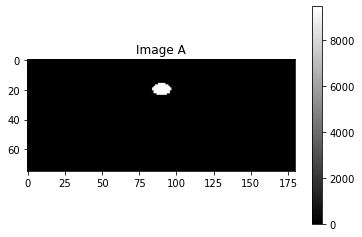

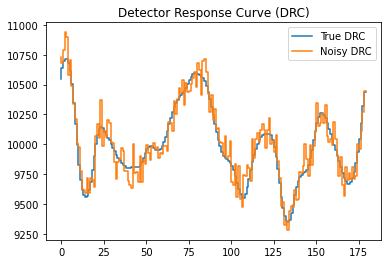

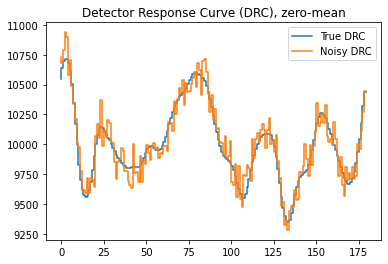

In [8]:
# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

np.random.seed(0) # set the seed for sampling

i = 2 # image index

meanCounts = 10000 # 1% noise - 10,000 mean counts, 4% - 625, - average counts for each rotational angle

noise_percent = 1 # used for guassian noise; comment out if using poisson

# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================
np.set_printoptions(precision=3)  


matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
Ai = matfile[f'S{i}.0']

matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
yi_n0 = matfile[f'y{i}.0']

# matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n1.mat')
# yi_n1 = matfile[f'y{i}.333333333333334'] 
# yi_n1 = yi_n1.ravel()

# matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n2.mat')
# yi_n2 = matfile[f'y{i}.666666666666666'] 
# yi_n2 = yi_n2.ravel()

m, n = Ai.shape 
ai = Ai.ravel()

matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

# raw, normalized, zero-mean DRM
DRM_origin = np.reshape(Phi[0,:], (m,n))
Phi_origin = Phi

DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
Phi_zeroMean = generate_Phi(DRM_zeroMean)

# Raw DRM -> raw DRC

xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

# Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 

Phi_norm = generate_Phi(DRM_norm)
xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

# Scaled A and raw DRM -> Scaled DRC    

scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
Ai_scale = Ai * scale_of_xi
ai_scale = ai * scale_of_xi
xi_scale = multiplyDRM(DRM_origin, Ai_scale)


if testing_mode == 'origin':
    x = xi_origin 
    a = ai 
    DRM = DRM_origin
    Phi = Phi_origin
    # DRM = DRM_norm
    # Phi = Phi_norm
elif testing_mode == 'normalize':
    x = xi_norm
    a = ai 
    DRM = DRM_norm
    Phi = Phi_norm
elif testing_mode == 'count': # should correspond to real-life case
    # # no processing at all
    x = xi_scale
    a = ai_scale
    DRM = DRM_origin
    Phi = Phi_origin



plt.gray()

fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Image A')
fig.colorbar(a_img)

# add noise and de-meaning    
noise_std = np.sqrt(meanCounts) # change to np.mean(abs(x)), or max(abs(x))
x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
# x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
# x_noisy = np.random.poisson(x) # poisson noise

# SNR
snr = SNR(x, meanCounts)
print("SNR of signal = ", snr, "dB")
print("signal power/noise power", LA.norm(x - np.mean(x)) ** 2/LA.norm(x_noisy - x) ** 2)
psnr = PSNR(x, meanCounts)
print("PSNR of signal = ", psnr, "dB")

fig, ax = plt.subplots()
ax.step(range(n), x, label='True DRC')
ax.step(range(n), x_noisy, label='Noisy DRC')
legned = ax.legend(loc='upper right')

ax.title.set_text('Detector Response Curve (DRC)')
# ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
# ax.title.set_text('Detector Response Curve (DRC), with Poisson noise')

# x = x - np.mean(x) 
# x_noisy = x_noisy - np.mean(x_noisy)


fig, ax = plt.subplots()
ax.step(range(n), x, label='True DRC')
ax.step(range(n), x_noisy, label='Noisy DRC')
legned = ax.legend(loc='upper right')
# ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
ax.title.set_text('Detector Response Curve (DRC), zero-mean')

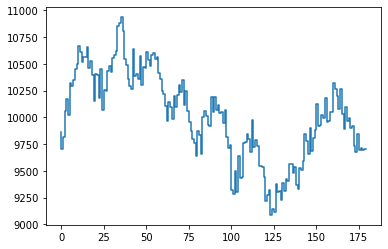

In [11]:
fig, ax = plt.subplots()
ax.step(range(n), x_noisy, label='Noisy DRC')



### Least Squares Solution

In [13]:
1 / (scipy.linalg.svdvals(Phi)[0]) **2

0.002119002193769273

--- 0.3242926597595215 seconds ---
Non-negative least squares solution achieves: 
 minimum error of  2.010657141250562 ,
 and data fit error of  0.0036284143564986977 ,
 and ssim of 0.9752896955155181
--- 0.3282961845397949 seconds ---


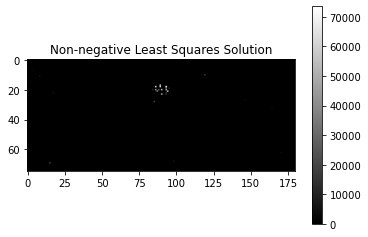

In [27]:
# # subtract the mean
# x = x - np.mean(x) 
# x_noisy = x_noisy - np.mean(x_noisy)
# Phi = Phi_zeroMean

start_time = time.time()

a_est, res = sp.optimize.nnls(Phi, x_noisy)

print("--- %s seconds ---" % (time.time() - start_time))

print("Non-negative least squares solution achieves: \n minimum error of ", LA.norm(a - a_est)/LA.norm(a), ",\n and data fit error of ", LA.norm(Phi @ a_est - x) / LA.norm(x), ",\n and ssim of", ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a_est.max() - a_est.min()))

print("--- %s seconds ---" % (time.time() - start_time))

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
ax.title.set_text('Non-negative Least Squares Solution')
fig.colorbar(a_img)

Non-negative least squares solution achieves: 
 minimum error of  0.643397282505425 ,
 and data fit error of  0.006641392258406681 ,
 and ssim of 0.8730957323797663


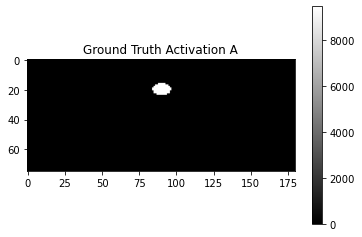

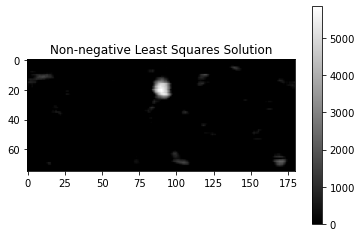

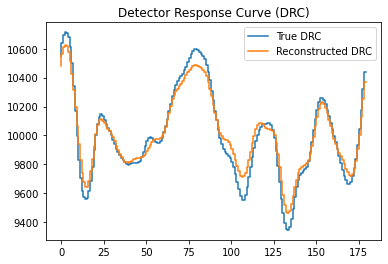

In [40]:
# Non-neg least square solved using gradient projection

num_itr = 500000
a_est = GP_nnls_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, niter=num_itr, m=m, n=n)



print("Non-negative least squares solution achieves: \n minimum error of ", LA.norm(a - a_est)/LA.norm(a), ",\n and data fit error of ", LA.norm(Phi @ a_est - x) / LA.norm(x), ",\n and ssim of", ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a_est.max() - a_est.min()))


fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Ground Truth Activation A')
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
ax.title.set_text('Non-negative Least Squares Solution')
fig.colorbar(a_img)


fig, ax = plt.subplots()
ax.step(range(n), x, label='True DRC')
ax.step(range(n), Phi @ a_est, label='Reconstructed DRC')

legend = ax.legend(loc='upper right')
# ax.title.set_text('Detector Response Curve (DRC), with $\sigma$ = {:.2f}' .format(sigma))
ax.title.set_text('Detector Response Curve (DRC)')

### Standard: MLEM-based (using FFT)

--- 73.67551946640015 seconds ---
MLEM for Fused Lasso achieves minimum error of  0.6372500975710984 , and data fit error of  0.008935195477561412


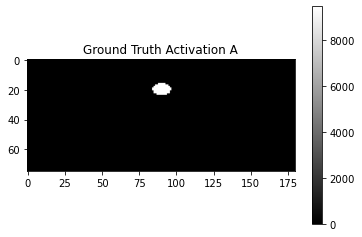

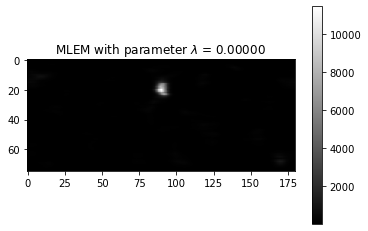

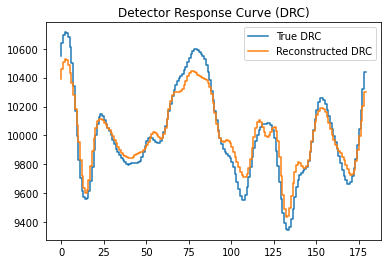

In [7]:
# %% initial test result: for MLEM
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0
num_itr = 10000 # whatever rho, when num_iter bigger, always converge to the same result


start_time = time.time()

# a_est, b_est = ADMM_las(a=np.zeros(a.shape), x=x, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)
a_est = MLEM_mrp_fft(a=np.ones(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, niter=num_itr, m=m, n=n)

# a_est = a_est - multiplyGramDRM_inv_mlem(DRM=DRM, signal_mean=np.mean(x), beta=1)

# practically: keep, theoretically: no need
# a_est = a_est / circ_col_norm(DRM)

print("--- %s seconds ---" % (time.time() - start_time))

# # do this only for zero mean 
# if testing_mode == 'zero mean':
#     for i in range(0,m): 
#         di_norm = LA.norm(DRM_zeroMean[i,:])
#         a_est[n*i:n*(i+1)] = a_est[n*i:n*(i+1)]/di_norm 

# a_est = np.clip(a_est, 0, np.inf)
print("MLEM for Fused Lasso achieves minimum error of ", LA.norm(a - a_est)/LA.norm(a),", and data fit error of ", LA.norm(Phi @ a_est - x) / LA.norm(x))


fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Ground Truth Activation A')
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
ax.title.set_text('MLEM with parameter $\lambda$ = {:.5f}' .format(lambd_val))
fig.colorbar(a_img)


fig, ax = plt.subplots()
ax.step(range(n), x, label='True DRC')
ax.step(range(n), Phi @ a_est, label='Reconstructed DRC')

legend = ax.legend(loc='upper right')
# ax.title.set_text('Detector Response Curve (DRC), with $\sigma$ = {:.2f}' .format(sigma))
ax.title.set_text('Detector Response Curve (DRC)')

### Standard: Lasso-based (using FFT)

--- 2.102911949157715 seconds ---
LASSO ADMM for Fused Lasso achieves minimum error of  1.3520927964184546 , and data fit error of  0.07287926514840183


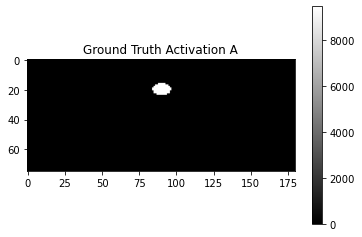

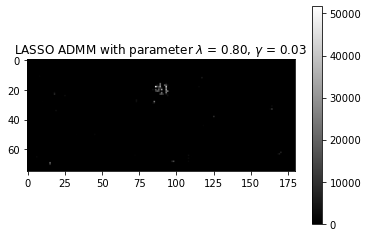

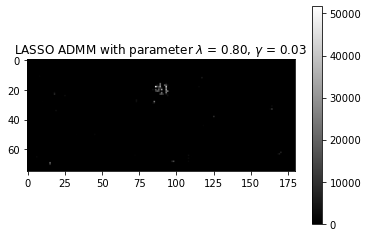

In [44]:
# %% initial test result: for lasso
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0.8 # l1: 0.1 for noiseless, 0.5 for noisy
gamma_val = 0.03
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 1e-3


start_time = time.time()

# a_est, b_est = ADMM_las(a=np.zeros(a.shape), x=x, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)
a_est, b_est = ADMM_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)

# practically: keep, theoretically: no need
# a_est = a_est / circ_col_norm(DRM)

print("--- %s seconds ---" % (time.time() - start_time))

# # do this only for zero mean 
# if testing_mode == 'zero mean':
#     for i in range(0,m): 
#         di_norm = LA.norm(DRM_zeroMean[i,:])
#         a_est[n*i:n*(i+1)] = a_est[n*i:n*(i+1)]/di_norm 

a_est = np.clip(a_est, 0, np.inf)
print("LASSO ADMM for Fused Lasso achieves minimum error of ", LA.norm(a - a_est)/LA.norm(a),", and data fit error of ", LA.norm(Phi @ a_est - x) / LA.norm(x))
b_est = np.clip(b_est, 0, np.inf)

fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Ground Truth Activation A')
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
ax.title.set_text('LASSO ADMM with parameter $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(b_est, (m,n)))
ax.title.set_text('LASSO ADMM with parameter $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

--- 2179.828334093094 seconds ---
PGD LASSO achieves minimum error of  0.8602714019861267 , and data fit error of  0.0047326330605325555


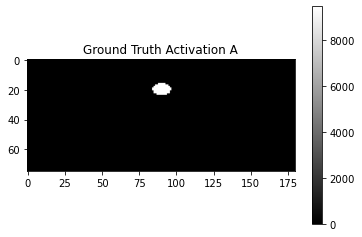

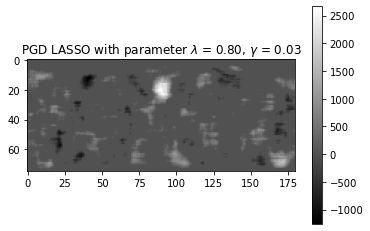

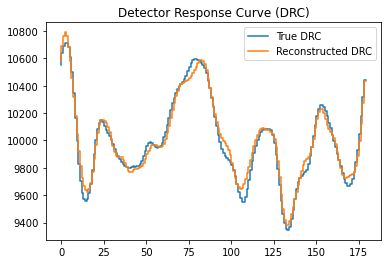

In [51]:
# %% initial test result: for lasso
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0.8 # l1: 0.1 for noiseless, 0.5 for noisy
num_itr = 500000 # whatever rho, when num_iter bigger, always converge to the same result



start_time = time.time()

# a_est, b_est = ADMM_las(a=np.zeros(a.shape), x=x, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)
a_est = PGD_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, niter=num_itr, m=m, n=n)

# practically: keep, theoretically: no need
# a_est = a_est / circ_col_norm(DRM)

print("--- %s seconds ---" % (time.time() - start_time))

# # do this only for zero mean 
# if testing_mode == 'zero mean':
#     for i in range(0,m): 
#         di_norm = LA.norm(DRM_zeroMean[i,:])
#         a_est[n*i:n*(i+1)] = a_est[n*i:n*(i+1)]/di_norm 

# a_est = np.clip(a_est, 0, np.inf)
print("PGD LASSO achieves minimum error of ", LA.norm(a - a_est)/LA.norm(a),", and data fit error of ", LA.norm(Phi @ a_est - x) / LA.norm(x))


fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Ground Truth Activation A')
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
ax.title.set_text('PGD LASSO with parameter $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

fig, ax = plt.subplots()
ax.step(range(n), x, label='True DRC')
ax.step(range(n), Phi @ a_est, label='Reconstructed DRC')

legend = ax.legend(loc='upper right')
# ax.title.set_text('Detector Response Curve (DRC), with $\sigma$ = {:.2f}' .format(sigma))
ax.title.set_text('Detector Response Curve (DRC)')

--- 1.3081891536712646 seconds ---
FLAS ADMM for Fused Lasso achieves minimum error of  0.7992440136521095 , and data fit error of  0.013712087962405303


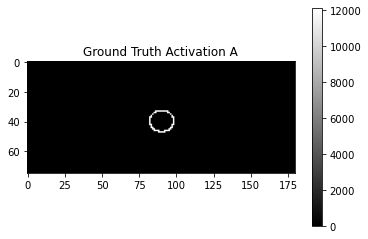

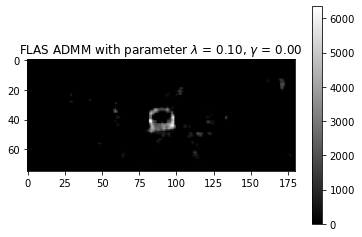

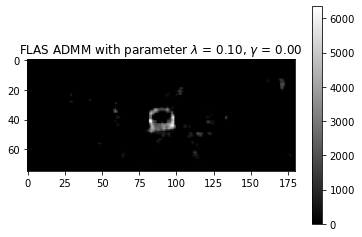

In [24]:
# %% initial test result: for fused lasso
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0.1
gamma_val = 0.003
num_itr = 200 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 1e-3

start_time = time.time()

# a_est = ADMM_flas(a=np.zeros(a.shape), x=x, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)
a_est, _ = ADMM_flas_fft(a=np.zeros(a.shape), x=x, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)

# # do this only for zero mean 
# if testing_mode == 'zero mean':
#     for i in range(0,m): 
#         di_norm = LA.norm(DRM_zeroMean[i,:])
#         a_est[n*i:n*(i+1)] = a_est[n*i:n*(i+1)]/di_norm 
#         # b_est[n*i:n*(i+1)] = b_est[n*i:n*(i+1)]/di_norm 


print("--- %s seconds ---" % (time.time() - start_time))

a_est = np.clip(a_est, 0, np.inf)
print("FLAS ADMM for Fused Lasso achieves minimum error of ", LA.norm(a - a_est)/LA.norm(a),", and data fit error of ", LA.norm(Phi @ a_est - x) / LA.norm(x))

fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Ground Truth Activation A')
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
ax.title.set_text('FLAS ADMM with parameter $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
ax.title.set_text('FLAS ADMM with parameter $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)


In [29]:
# %% initial test result: pflas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0.32  # 0.32
gamma_val = 0.1  # 0.1
num_itr = 20 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 10

a_est, b_est = ADMM_pflas(a=np.zeros(a.shape), x=x_noisy, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)
# a_est, b_est = ADMM_pflas_fft(a=np.zeros(a.shape), x=x, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)

# do this only for zero mean 
if testing_mode == 'zero mean':
    for i in range(0,m): 
        di_norm = LA.norm(DRM_zeroMean[i,:])
        a_est[n*i:n*(i+1)] = a_est[n*i:n*(i+1)]/di_norm 
        b_est[n*i:n*(i+1)] = b_est[n*i:n*(i+1)]/di_norm 



est_ssim = ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a.max() - a.min())

print("ADMM output 1 achieves NRMSE of ", LA.norm(a - a_est)/LA.norm(a), ", SSIM of ", est_ssim, ", and data fit error of ", LA.norm(Phi @ a_est - x) / LA.norm(x))

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
#ax.title.set_text('ADMM output with $\lambda$ = {:.2f}' .format(lambd_val))
ax.title.set_text('PFLAS ADMM output with $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

# b_est = np.clip(b_est, 0, np.inf)
# print("ADMM output 2 achieves NRMSE of ", LA.norm(a - b_est)/LA.norm(a))

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(b_est, (m,n)))
ax.title.set_text('ADMM output 2 with $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

# fig, ax = plt.subplots()    
# a_img = plt.imshow(np.reshape(b_est-a_est, (m,n)))
# ax.title.set_text('ADMM Difference with $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(v, u))
# fig.colorbar(a_img)

a_pflas = a_est

NameError: name 'ADMM_pflas' is not defined

### Plug-and-Play: DRUNet

In [15]:
# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
# model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray_trans_1.pth"), strict=True) # model after transfer learning
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)

In [16]:
device # make sure GPU is used in CoLab

device(type='cuda')

--- 5.983441352844238 seconds ---
PnP ADMM output 1 achieves NRMSE of 0.9823462537242715 , SSIM of  0.9073654742844253 , and data fit error of 0.026407478575800312 , after 200 iterations


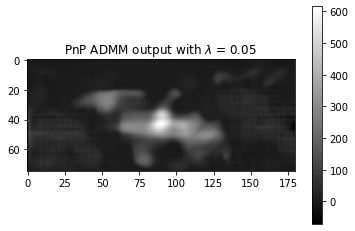

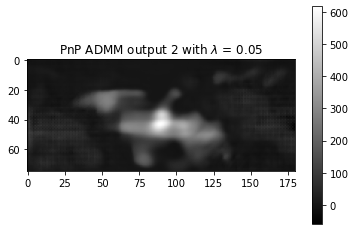

In [20]:
# %% PnP CNN (with a good initialization)

# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0.05  # 0.08
gamma_val = 0.1 # notice that gamma is not used in PnP
num_itr = 200 # for noise_level_img < 25.5/255.0 , when num_iter bigger, always converge to the same result
rho_val = 10 # 10 or 100

start_time = time.time()

# a_est, b_est = ADMM_pnp(a=a_pflas, x=x, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas
a_est, b_est = ADMM_pnp_fft(a=np.zeros(a.shape), x=x, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas



print("--- %s seconds ---" % (time.time() - start_time))

est_ssim = ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a.max() - a.min())

# a_est = np.clip(a_est, 0, np.inf)
print("PnP ADMM output 1 achieves NRMSE of", LA.norm(a - a_est)/LA.norm(a),  ", SSIM of ", est_ssim, ", and data fit error of", LA.norm(Phi @ a_est - x) / LA.norm(x), ", after", num_itr, "iterations")

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
ax.title.set_text('PnP ADMM output with $\lambda$ = {:.2f}' .format(lambd_val))
# ax.title.set_text('PnP ADMM output with $\lambda$ = {:.2f}' .format(lambd_val))
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(b_est, (m,n)))
ax.title.set_text('PnP ADMM output 2 with $\lambda$ = {:.2f}' .format(lambd_val))
fig.colorbar(a_img)

In [74]:
np.min(LA.norm(DRM, axis=1))

0.007361152321477937

In [13]:
x

array([10594.349, 10697.943, 10767.283, 10818.324, 10829.213, 10793.446,
       10722.216, 10625.579, 10488.184, 10320.392, 10092.56 ,  9851.799,
        9617.313,  9422.45 ,  9262.144,  9219.345,  9272.806,  9436.212,
        9641.813,  9830.324,  9988.513, 10136.796, 10214.529, 10232.828,
       10199.784, 10175.133, 10170.445, 10156.683, 10136.871, 10100.425,
       10051.577, 10000.536,  9954.485,  9898.227,  9867.981,  9836.222,
        9826.316,  9820.191,  9805.748,  9788.962,  9786.391,  9775.2  ,
        9768.697,  9760.303,  9757.354,  9776.561,  9802.497,  9819.359,
        9859.512,  9895.505,  9949.873,  9985.488, 10032.975, 10065.565,
       10077.286, 10039.024,  9979.363,  9920.609,  9865.939,  9842.725,
        9860.797,  9929.91 , 10032.748, 10150.936, 10262.621, 10355.931,
       10411.509, 10422.474, 10402.813, 10373.852, 10352.377, 10346.933,
       10391.849, 10464.214, 10536.73 , 10614.236, 10658.472, 10694.54 ,
       10692.121, 10673.973, 10642.138, 10613.177, 

--- 10.14621090888977 seconds ---
PnP-lasso ADMM output 1 achieves NRMSE of 0.9919620075548861 , SSIM of  0.9958059567746604 , and data fit error of 0.032902378454602095 , after 300 iterations


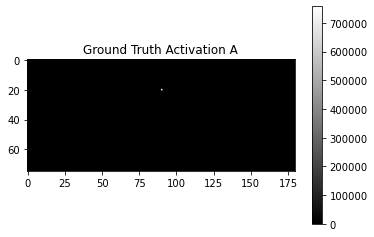

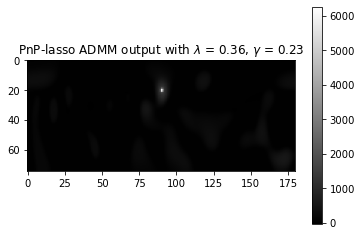

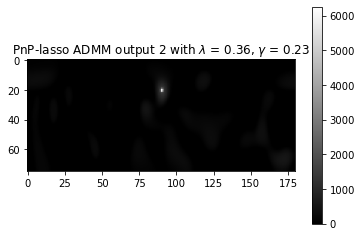

In [92]:
# %%  PnP-las
# # subtract the mean
# x = x - np.mean(x) 
# x_noisy = x_noisy - np.mean(x_noisy)
# Phi = Phi_zeroMean
# DRM = DRM_zeroMean


# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================

# # noiseless
# lambd_val = 0.03
# gamma_val = 0.01 # used here! for CNN penalty 0.23 (in paper), 
# noisy
lambd_val = 0.36 # 0.08
gamma_val = 0.23 #
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result: 200 good for noiseless
rho_val = 10 # 10 or 100

start_time = time.time()

a_init = np.zeros(a.shape)
# a_init, _ = sp.optimize.nnls(Phi, x_noisy)

# a_est, b_est = ADMM_pnp_flas(a=np.zeros(a.shape), x=x, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas
a_est, b_est = ADMM_pnp_las_fft(a=a_init, x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

# a_est = a_est / circ_col_norm(DRM)
# b_est = b_est / circ_col_norm(DRM)

# # do this only for zero mean 
# if testing_mode == 'zero mean':
#     for i in range(0,m): 
#         di_norm = LA.norm(DRM_zeroMean[i,:])
#         a_est[n*i:n*(i+1)] = a_est[n*i:n*(i+1)]/di_norm 
#         b_est[n*i:n*(i+1)] = b_est[n*i:n*(i+1)]/di_norm 


print("--- %s seconds ---" % (time.time() - start_time))

est_ssim = ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a.max() - a.min())

fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Ground Truth Activation A')
fig.colorbar(a_img)



print("PnP-lasso ADMM output 1 achieves NRMSE of", LA.norm(a - a_est)/LA.norm(a),  ", SSIM of ", est_ssim, ", and data fit error of", LA.norm(Phi @ a_est - x) / LA.norm(x), ", after", num_itr, "iterations")

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
#ax.title.set_text('ADMM output with $\lambda$ = {:.2f}' .format(lambd_val))
ax.title.set_text('PnP-lasso ADMM output with $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(b_est, (m,n)))
ax.title.set_text('PnP-lasso ADMM output 2 with $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

## Hyper-parameter Search

### Load data of interest

SNR of signal =  11.056165134223745 dB
signal power/noise power 14.062930752483938
PSNR of signal =  40.53900768658821 dB


<Figure size 432x288 with 0 Axes>

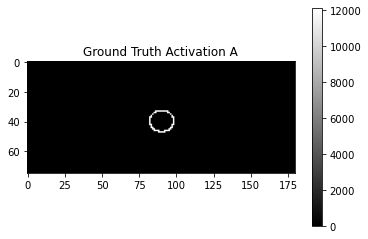

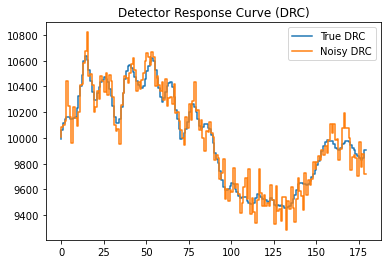

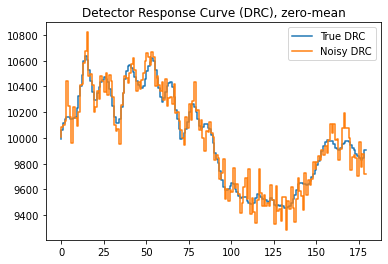

In [93]:
# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

np.random.seed(0) # set the seed for sampling

i = 11 # image index

meanCounts = 10000 # 1% noise - 10,000 mean counts, 4% - 625, - average counts for each rotational angle

noise_percent = 1 # used for guassian noise; comment out if using poisson

# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================
np.set_printoptions(precision=3)  


matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
Ai = matfile[f'S{i}.0']

matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
yi_n0 = matfile[f'y{i}.0']

# matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n1.mat')
# yi_n1 = matfile[f'y{i}.333333333333334'] 
# yi_n1 = yi_n1.ravel()

# matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n2.mat')
# yi_n2 = matfile[f'y{i}.666666666666666'] 
# yi_n2 = yi_n2.ravel()

m, n = Ai.shape 
ai = Ai.ravel()

matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

# raw, normalized, zero-mean DRM
DRM_origin = np.reshape(Phi[0,:], (m,n))
Phi_origin = Phi

DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
Phi_zeroMean = generate_Phi(DRM_zeroMean)

# Raw DRM -> raw DRC

xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

# Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 

Phi_norm = generate_Phi(DRM_norm)
xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

# Scaled A and raw DRM -> Scaled DRC    

scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
Ai_scale = Ai * scale_of_xi
ai_scale = ai * scale_of_xi
xi_scale = multiplyDRM(DRM_origin, Ai_scale)


if testing_mode == 'origin':
    x = xi_origin 
    a = ai 
    DRM = DRM_origin
    Phi = Phi_origin
    # DRM = DRM_norm
    # Phi = Phi_norm
elif testing_mode == 'normalize':
    x = xi_norm
    a = ai 
    DRM = DRM_norm
    Phi = Phi_norm
elif testing_mode == 'count': # should correspond to real-life case
    # # no processing at all
    x = xi_scale
    a = ai_scale
    DRM = DRM_origin
    Phi = Phi_origin



plt.gray()

fig, ax = plt.subplots()
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Ground Truth Activation A')
fig.colorbar(a_img)

# add noise and de-meaning    
noise_std = np.sqrt(meanCounts * noise_percent) # change to np.mean(abs(x)), or max(abs(x))
# x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
# x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
x_noisy = np.random.poisson(x) # poisson noise

# SNR
snr = SNR(x, meanCounts)
print("SNR of signal = ", snr, "dB")
print("signal power/noise power", LA.norm(x - np.mean(x)) ** 2/LA.norm(x_noisy - x) ** 2)
psnr = PSNR(x, meanCounts)
print("PSNR of signal = ", psnr, "dB")

fig, ax = plt.subplots()
ax.step(range(n), x, label='True DRC')
ax.step(range(n), x_noisy, label='Noisy DRC')
legned = ax.legend(loc='upper right')

ax.title.set_text('Detector Response Curve (DRC)')
# ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
# ax.title.set_text('Detector Response Curve (DRC), with Poisson noise')

# x = x - np.mean(x) 
# x_noisy = x_noisy - np.mean(x_noisy)


fig, ax = plt.subplots()
ax.step(range(n), x, label='True DRC')
ax.step(range(n), x_noisy, label='Noisy DRC')
legned = ax.legend(loc='upper right')
# ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
ax.title.set_text('Detector Response Curve (DRC), zero-mean')

In [14]:

print("Total variation of original image:", LA.norm(first_diffs_2d_matrix(m, n) @ a, ord=1))

Total variation of original image: 2057853.1658013104


### Grid Search

In [ ]:
# %%
# ========================================= 
# fused lasso hyperparameter search
# =========================================

lambd_values = np.append(0, np.logspace(-1, 0, 5)) # 50 values in 10^(-a) - 10^b
gamma_values = np.append(0, np.logspace(-1, 0, 5))

num_itr = 300

train_errors = []
test_errors = []
a_est_values = []
para_values = []
data_fit_errors = []
recovery_errors = []
for v in lambd_values:
    for u in gamma_values:
        # a_est = ADMM_flas(a=np.zeros(a.shape), x=x, Phi=Phi, lambd=v, gamma=u, rho=100, niter=10, m=m, n=n)
        # a_est = ADMM_flas_fft(a=np.zeros(a.shape), x=x, DRM=DRM, lambd=v, gamma=u, rho=100, niter=10, m=m, n=n)
        # a_est, _ = ADMM_pfls_acc(a=np.zeros(a.shape), x=x_noisy, Phi=Phi, lambd=v, gamma=u, rho=100, niter=10, m=m, n=n)
        a_est, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model)
        a_est_values.append(a_est)
        para_values.append([v,u])
        data_fit_errors.append(LA.norm(x - Phi @ a_est)/LA.norm(x))
        recovery_errors.append(LA.norm(a - a_est)/LA.norm(a))
        print("ADMM for lambda = ", v, " gamma = ", u, " completed")

print("Result #", np.argmin(recovery_errors), " achieves minimum error of ", np.min(recovery_errors))
print("Result #", np.argmin(data_fit_errors), " achieves minimum error of ", np.min(data_fit_errors))

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Ground truth activation')
fig.colorbar(a_img)

for itr, a_est_itr in enumerate(a_est_values):    
    np.set_printoptions(precision=3)    
    #plt.figure(itr)
    fig, ax = plt.subplots()    
    a_img = plt.imshow(np.reshape(a_est_itr, (m,n)))
    ax.title.set_text('Result #{}, with parameter $\lambda$ = {:.3f}, $\gamma$ = {:.3f}' .format(itr, para_values[itr][0], para_values[itr][1]))
    fig.colorbar(a_img)

In [ ]:
print("normalized data fitting error: ", data_fit_errors)

In [ ]:
# %%
# train_errors = np.array(train_errors)
min_idx = np.argmin(recovery_errors)
print("Result #", min_idx, " achieves minimum reconstruction NRMSE of ", recovery_errors[min_idx])

min_idx = np.argmin(data_errors)
print("Result #", min_idx, " achieves minimum data NRMSE of ", data_errors[min_idx])

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a, (m,n)))
ax.title.set_text('Ground truth activation')
fig.colorbar(a_img)

for itr, a_est_itr in enumerate(a_est_values):    
    np.set_printoptions(precision=3)    
    #plt.figure(itr)
    fig, ax = plt.subplots()    
#    a_est_itr = np.clip(a_est_itr, 0, np.inf)
    a_img = plt.imshow(np.reshape(a_est_itr, (m,n)))
    ax.title.set_text('Result #{}, with parameter $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(itr, para_values[itr][0], para_values[itr][1]))
    fig.colorbar(a_img)

### Bayesian Optimization

In [86]:
# %% Bayesian Opt for pflas
# choose noisy or noiseless
def admm_las_error(lambd_val, gamma_val):
    num_itr = 500
    rho_val = 10
    a_est, b_est = ADMM_las_fft(a=np.zeros(a.shape), x=x, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)
    est_ssim = ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a.max() - a.min())
    
    return est_ssim

def admm_pnp_las_error(lambd_val, gamma_val):
    num_itr = 300
    rho_val = 10
    a_est, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est = a_est / circ_col_norm(DRM) # if using count DRC

    est_ssim = ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a.max() - a.min())
    NRMSE = (-1) * LA.norm(a - a_est)/LA.norm(a)
    
    return est_ssim

def admm_pnp_flas_error(lambd_1_val, lambd_2_val, lambd_3_val):
    num_itr = 100
    rho_val = 10
    a_est, _ = ADMM_pnp_flas_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd_1=lambd_1_val, lambd_2=lambd_2_val, lambd_3=lambd_3_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est = a_est / circ_col_norm(DRM) # if using count DRC

    est_ssim = ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a.max() - a.min())
    NRMSE = (-1) * LA.norm(a - a_est)/LA.norm(a)
    
    return est_ssim

In [96]:
# %% Focus on noisy case
from bayes_opt import BayesianOptimization
# Bounded region of parameter space
pbounds = {'lambd_val': (0.2, 0.4), 'gamma_val': (0.1, 0.3)} 

optimizer = BayesianOptimization(
    f=admm_pnp_las_error, # choose las or pnp
    pbounds=pbounds,
    verbose=2, # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
    random_state=1,
)

optimizer.probe(
    params={"lambd_val": 0.36, "gamma_val": 0.23}, # good parameter from grid search
    lazy=True,
)

optimizer.maximize(
    init_points=5,
    n_iter=5,
)

|   iter    |  target   | gamma_val | lambd_val |
-------------------------------------------------
|  1        |  0.97     |  0.23     |  0.36     |
|  2        |  0.9699   |  0.1834   |  0.3441   |
|  3        |  0.9495   |  0.1      |  0.2605   |
|  4        |  0.9516   |  0.1294   |  0.2185   |
|  5        |  0.9517   |  0.1373   |  0.2691   |
|  6        |  0.9701   |  0.1794   |  0.3078   |
|  7        |  0.9704   |  0.2628   |  0.2824   |
|  8        |  0.9703   |  0.266    |  0.332    |
|  9        |  0.951    |  0.1299   |  0.3258   |
|  10       |  0.9713   |  0.3      |  0.2      |
|  11       |  0.9531   |  0.1791   |  0.2323   |


In [ ]:
# %% search for pnp-l1-tv: 3 hyperparameter
from bayes_opt import BayesianOptimization
# Bounded region of parameter space
pbounds = {'lambd_1_val': (0, 0.6), 'lambd_2_val': (0, 0.6), 'lambd_3_val': (0, 0.6)} 

optimizer = BayesianOptimization(
    f=admm_pnp_flas_error, # choose las or pnp
    pbounds=pbounds,
    verbose=2, # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
    random_state=1,
)

optimizer.probe(
    params={"lambd_1_val": 0.4, "lambd_2_val": 0.12, "lambd_3_val": 0.32}, # good parameter from grid search
    lazy=True,
)

optimizer.maximize(
    init_points=5,
    n_iter=10,
)

### Result using the hyperparameter

--- 10.11217975616455 seconds ---
PnP-lasso ADMM output 1 achieves NRMSE of 0.796191566385982 , SSIM of  0.9695800349592485 , and data fit error of 0.002918175443528217 , after 300 iterations
Total variation of original image: 2057853.1658013104
Total variation of reconstructed image: 1624097.0429510446


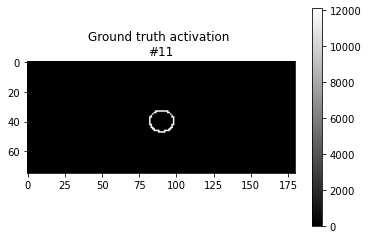

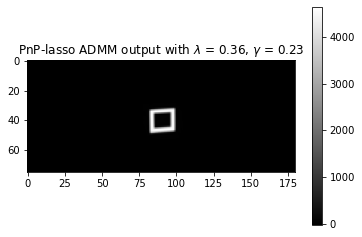

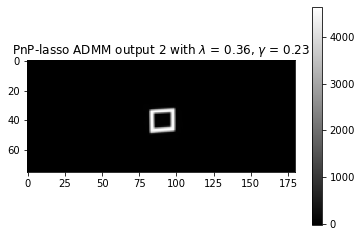

In [94]:
# %%  PnP-l1: plug in renewed estimator
# %% load CNN

# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0.36 # 0.08
gamma_val = 0.23   # used here! for CNN penalty 0.23
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result: 200 good for noiseless
rho_val = 1e7 # 10 or 100

start_time = time.time()

# a_est, b_est = ADMM_pnp_flas(a=np.zeros(a.shape), x=x, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas
a_est, b_est = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

# a_est = a_est / circ_col_norm(DRM)
# b_est = b_est / circ_col_norm(DRM)



print("--- %s seconds ---" % (time.time() - start_time))

est_ssim = ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a.max() - a.min())


print("PnP-lasso ADMM output 1 achieves NRMSE of", LA.norm(a - a_est)/LA.norm(a),  ", SSIM of ", est_ssim, ", and data fit error of", LA.norm(Phi @ a_est - x) / LA.norm(x), ", after", num_itr, "iterations")

print("Total variation of original image:", LA.norm(first_diffs_2d_matrix(m, n) @ a, ord=1))
print("Total variation of reconstructed image:", LA.norm(first_diffs_2d_matrix(m, n) @ a_est, ord=1))

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a, (m,n)))
#ax.title.set_text('ADMM output with $\lambda$ = {:.2f}' .format(lambd_val))
ax.title.set_text(r'Ground truth activation ' + "\n" + f'#{i}')
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
#ax.title.set_text('ADMM output with $\lambda$ = {:.2f}' .format(lambd_val))
ax.title.set_text('PnP-lasso ADMM output with $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(b_est, (m,n)))
ax.title.set_text('PnP-lasso ADMM output 2 with $\lambda$ = {:.2f}, $\gamma$ = {:.2f}' .format(lambd_val, gamma_val))
fig.colorbar(a_img)

--- 6.48490047454834 seconds ---
PnP-lasso ADMM output 1 achieves NRMSE of 0.8648598751084676 , SSIM of  0.9582563025935094 , and data fit error of 0.006203870909054776 , after 200 iterations
Total variation of original image: 1983169.5014972927
Total variation of reconstructed image: 1543576.1343343921


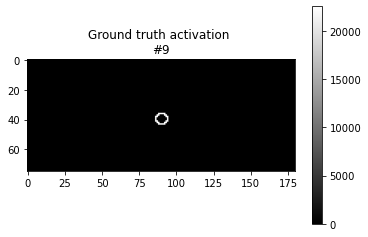

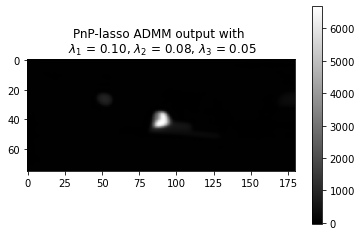

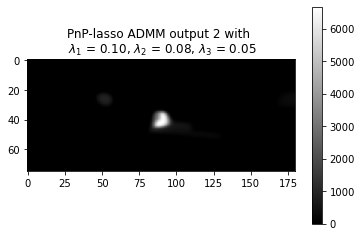

In [39]:
# %%  PnP-l1-TV: plug in renewed estimator
# %% load CNN

# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_1_val = 0.01 # 0.08
lambd_2_val = 0.08
lambd_3_val = 0.05 # used here! for CNN penalty 0.23
num_itr = 200 # whatever rho, when num_iter bigger, always converge to the same result: 200 good for noiseless
rho_val = 1e7 # 10 or 100

start_time = time.time()

# a_est, b_est = ADMM_pnp_flas(a=np.zeros(a.shape), x=x, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas
a_est, b_est = ADMM_pnp_flas_fft(a=np.zeros(a.shape), x=x, DRM=DRM, lambd_1=lambd_1_val, lambd_2=lambd_2_val, lambd_3=lambd_3_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

# a_est = a_est / circ_col_norm(DRM)
# b_est = b_est / circ_col_norm(DRM)



print("--- %s seconds ---" % (time.time() - start_time))

est_ssim = ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a.max() - a.min())


print("PnP-lasso ADMM output 1 achieves NRMSE of", LA.norm(a - a_est)/LA.norm(a),  ", SSIM of ", est_ssim, ", and data fit error of", LA.norm(Phi @ a_est - x) / LA.norm(x), ", after", num_itr, "iterations")

print("Total variation of original image:", LA.norm(first_diffs_2d_matrix(m, n) @ a, ord=1))
print("Total variation of reconstructed image:", LA.norm(first_diffs_2d_matrix(m, n) @ a_est, ord=1))

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a, (m,n)))
#ax.title.set_text('ADMM output with $\lambda$ = {:.2f}' .format(lambd_val))
ax.title.set_text(r'Ground truth activation ' + "\n" + f'#{i}')
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
#ax.title.set_text('ADMM output with $\lambda$ = {:.2f}' .format(lambd_val))
ax.title.set_text('PnP-lasso ADMM output with \n $\lambda_1$ = {:.2f}, $\lambda_2$ = {:.2f}, $\lambda_3$ = {:.2f}' .format(lambd_1_val, lambd_2_val, lambd_3_val))
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(b_est, (m,n)))
ax.title.set_text('PnP-lasso ADMM output 2 with \n $\lambda_1$ = {:.2f}, $\lambda_2$ = {:.2f}, $\lambda_3$ = {:.2f}' .format(lambd_1_val, lambd_2_val, lambd_3_val))
fig.colorbar(a_img)

--- 6.107555866241455 seconds ---
LASSO ADMM for Fused Lasso achieves minimum error of  0.5917278986702248
Lasso ADMM output 1 achieves NRMSE of 0.5917278986702248 , SSIM of  0.9377348552083393 , and data fit error of 0.24112794390200892 , after 600 iterations
Total variation of original image: 1576914.3543147084
Total variation of reconstructed image (want small): 1540000.360944947


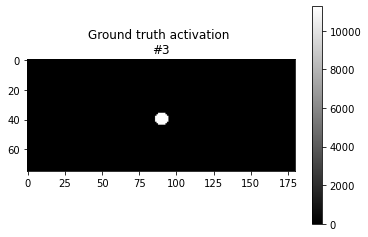

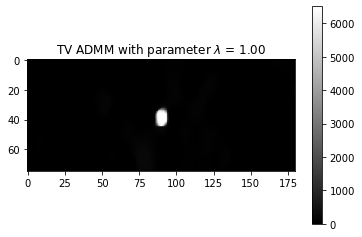

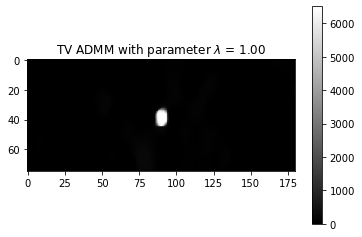

In [75]:
# %% initial test result: for lasso or TV
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 1 # 0.12 for lasso
gamma_val = 1e6
num_itr = 600 # whatever rho, when num_iter bigger, always converge to the same result
rho_val =  np.mean(LA.norm(DRM, axis=1)) 

start_time = time.time()

# a_est, _ = ADMM_las(a=np.zeros(a.shape), x=x, Phi=Phi, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)
a_est, b_est = ADMM_tv_fft(a=np.zeros(a.shape), x=x, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)
# a_est, b_est = ADMM_flas_fft(a=np.zeros(a.shape), x=x, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n)




print("--- %s seconds ---" % (time.time() - start_time))

a_est = np.clip(a_est, 0, np.inf)
print("LASSO ADMM for Fused Lasso achieves minimum error of ", LA.norm(a - a_est)/LA.norm(a))
b_est = np.clip(b_est, 0, np.inf)

est_ssim = ssim(np.reshape(a, (m,n)), np.reshape(a_est, (m,n)), data_range = a.max() - a.min())


print("Lasso ADMM output 1 achieves NRMSE of", LA.norm(a - a_est)/LA.norm(a),  ", SSIM of ", est_ssim, ", and data fit error of", LA.norm(Phi @ a_est - x) / LA.norm(x), ", after", num_itr, "iterations")


print("Total variation of original image:", LA.norm(first_diffs_2d_matrix(m, n) @ a, ord=1))
print("Total variation of reconstructed image (want small):", LA.norm(first_diffs_2d_matrix(m, n) @ a_est, ord=1))



fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a, (m,n)))
#ax.title.set_text('ADMM output with $\lambda$ = {:.2f}' .format(lambd_val))
ax.title.set_text(r'Ground truth activation ' + "\n" + f'#{i}')
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(a_est, (m,n)))
ax.title.set_text('TV ADMM with parameter $\lambda$ = {:.2f}' .format(lambd_val))
fig.colorbar(a_img)

fig, ax = plt.subplots()    
a_img = plt.imshow(np.reshape(b_est, (m,n)))
ax.title.set_text('TV ADMM with parameter $\lambda$ = {:.2f}' .format(lambd_val))
fig.colorbar(a_img)

# Full Testing

### Testing on 'RSM-training-set(with noise)': 2 deg bins
---


naming convention of sources: seems to shift 'Training Suite - 2 deg bins' by one

#### Normalized DRC: noiseless

KeyboardInterrupt: 

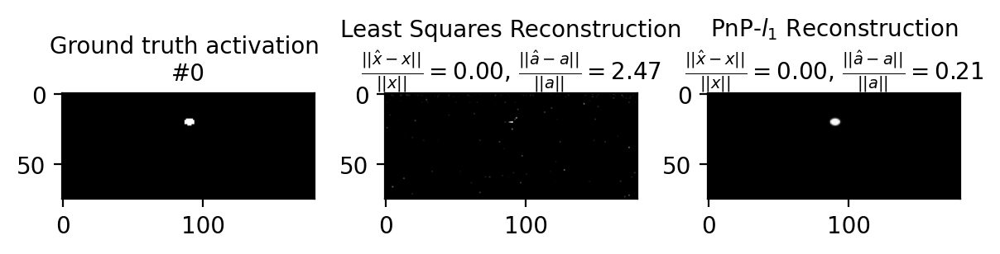

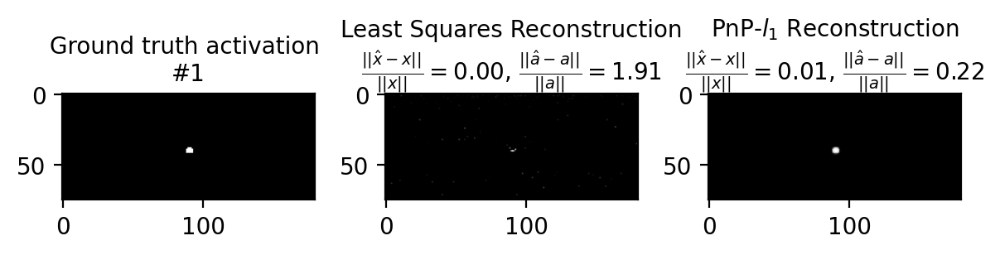

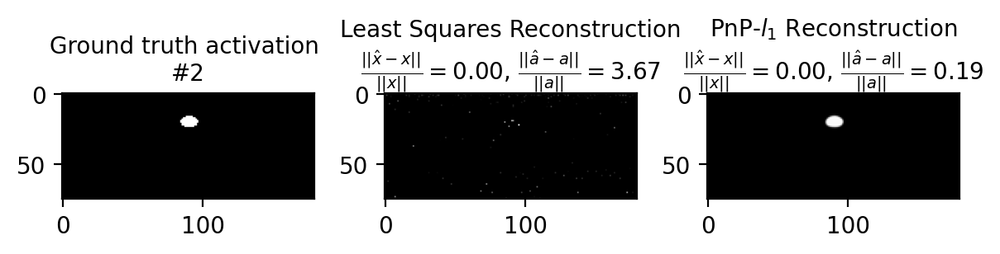

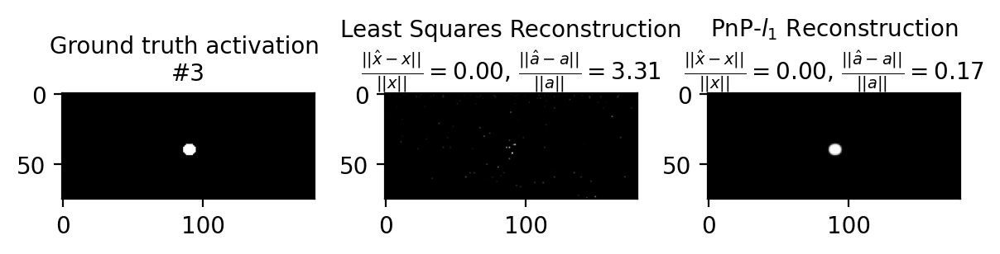

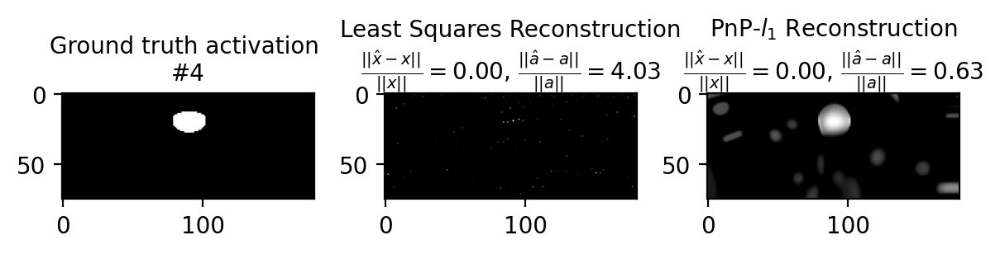

In [53]:
meanCounts = 10000 # 1% noise - 10,000 mean counts; 4% 1,600 - average counts for each rotational angle

# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0.28 # 0.08
gamma_val = 0.6 # used here! for CNN penalty 0.23
num_itr = 100 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 10 # 10 or 100

# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================
matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

# raw, normalized, zero-mean DRM
DRM_origin = np.reshape(Phi[0,:], (m,n))
Phi_origin = Phi

DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
Phi_zeroMean = generate_Phi(DRM_zeroMean)



# testing_mode = 'origin'
testing_mode = 'normalize' # use this for initial testing
# testing_mode = 'count' # use this for "real-life" testing
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
a_est_pnp_all = []


# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)




for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    # matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n1.mat')
    # yi_n1 = matfile[f'y{i}.333333333333334'] 
    # yi_n1 = yi_n1.ravel()

    # matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n2.mat')
    # yi_n2 = matfile[f'y{i}.666666666666666'] 
    # yi_n2 = yi_n2.ravel()

    m, n = Ai.shape 
    ai = Ai.ravel()

    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)
    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        # x = x0_scale
        # a = a0_scale
        # DRM = DRM_origin
        # Phi = Phi_origin

        # zero mean
        x = xi_scale 
        a = ai_scale 
        DRM = DRM_zeroMean
        Phi = Phi_zeroMean

    # add noise and de-meaning
    x_noisy = np.random.normal(x, np.sqrt(max(abs(x))*0.01)) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    # x_noisy = np.random.poisson(x) # poisson noise

    x = x - np.mean(x) 
    x_noisy = x_noisy - np.mean(x_noisy)


    # Start testing

    # least squares
    a_est_ls, _ = sp.optimize.nnls(Phi, x)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_ls)/LA.norm(x)
    recovery_err_ls = LA.norm(a - a_est_ls)/LA.norm(a)

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)

    # # PnP - flas
    # # ===============================================
    # # choose different parameter combinations:
    # # v = 0.05, 0.1, 0.2
    # # rho = 1,10 (for pflas),100
    # # niter = 12, 20, 50
    # # ===============================================
    # lambd_val = 0.28 # 0.08
    # gamma_val = 0.6 # used here! for CNN penalty 0.23
    # num_itr = 200 # whatever rho, when num_iter bigger, always converge to the same result
    # rho_val = 10 # 10 or 100

    start_time = time.time()

    a_est_pnp, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    a_est_pnp = a_est_pnp / circ_col_norm(DRM)

    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)


    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    a_img = ax1.imshow(np.reshape(a, (m,n)))
    ax1.set_title(r'Ground truth activation ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_ls, (m,n)))
    ax2.set_title(r"Least Squares Reconstruction" + "\n" + f'$ \\frac{{||\hat{{x}} - x||}}{{||x||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax3.imshow(np.reshape(a_est_pnp, (m,n)))
    ax3.set_title(r"PnP-$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{x}} - x||}}{{||x||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 



#### Count DRC: noiseless (Non-negative least square vs l1-CNN)

Test # 0
Test # 1
Test # 2
Test # 3
Test # 4
Test # 5
Test # 6
Test # 7
Test # 8
Test # 9
Test # 10
Test # 11
Test # 12
Test # 13
Test # 14
Test # 15
Test # 16
Test # 17
Test # 18
Test # 19


C:\Users\22057\AppData\Local\Temp\ipykernel_28540\3607259603.py:134: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=2, ncols=2)


 ---------------------- Summary ------------------------------
average NRMSE of nnls is 0.447558618640622
average NRMSE of l1-CNN is 0.39971270328172914

average SSIM of nnls is 0.9429585740803
average SSIM of l1-CNN is 0.9917181844459846


<Figure size 432x288 with 0 Axes>

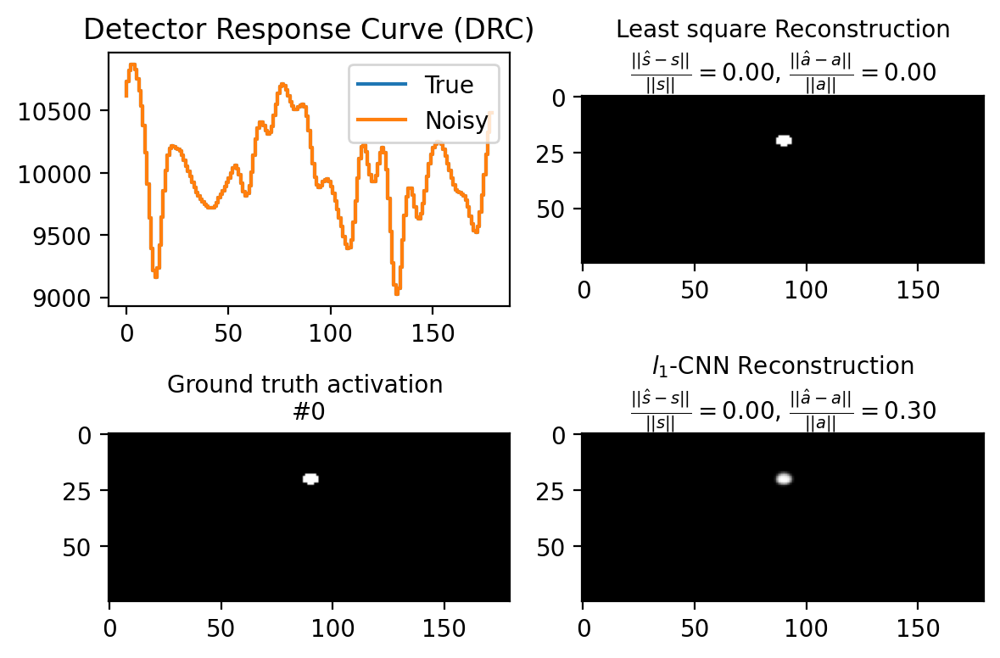

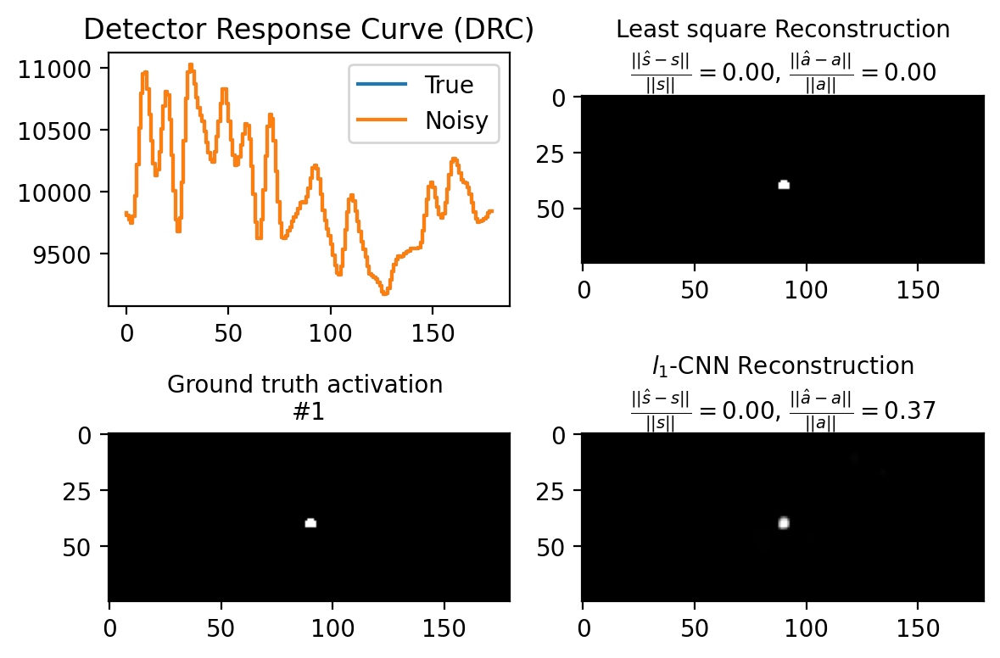

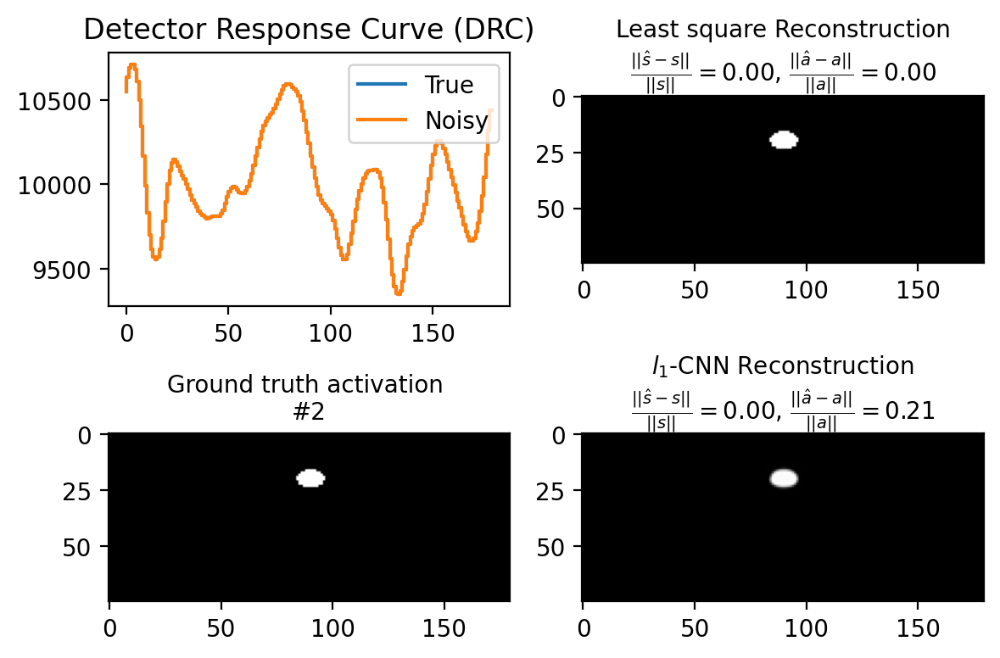

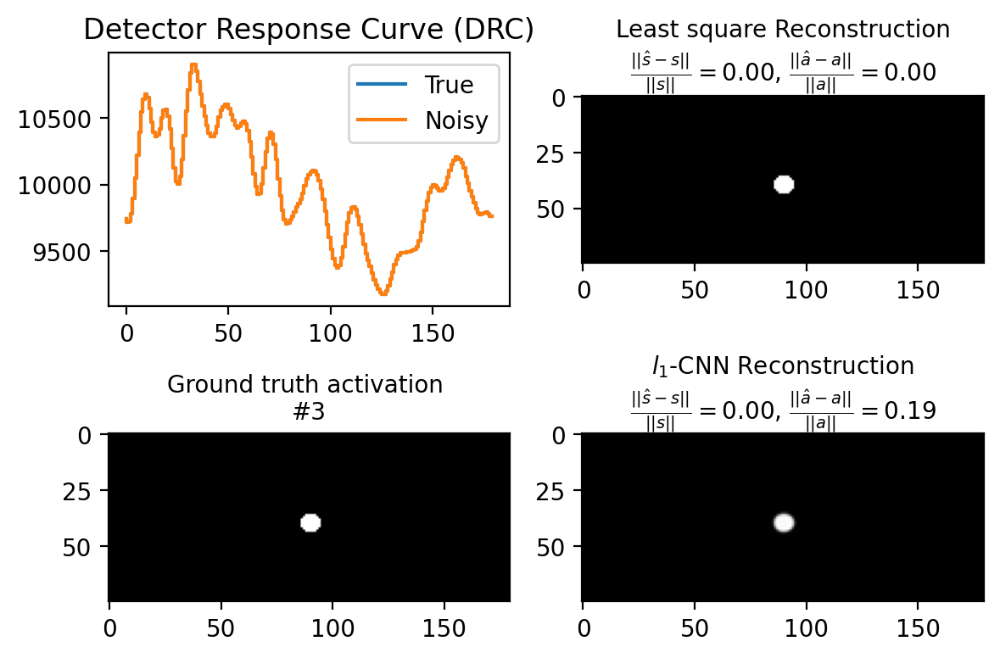

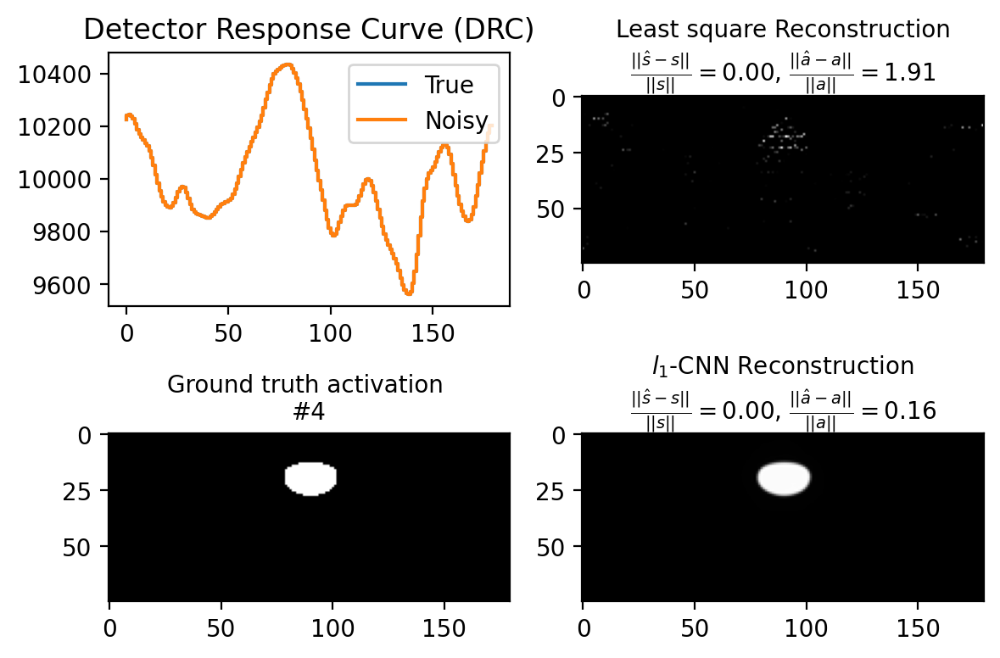

...

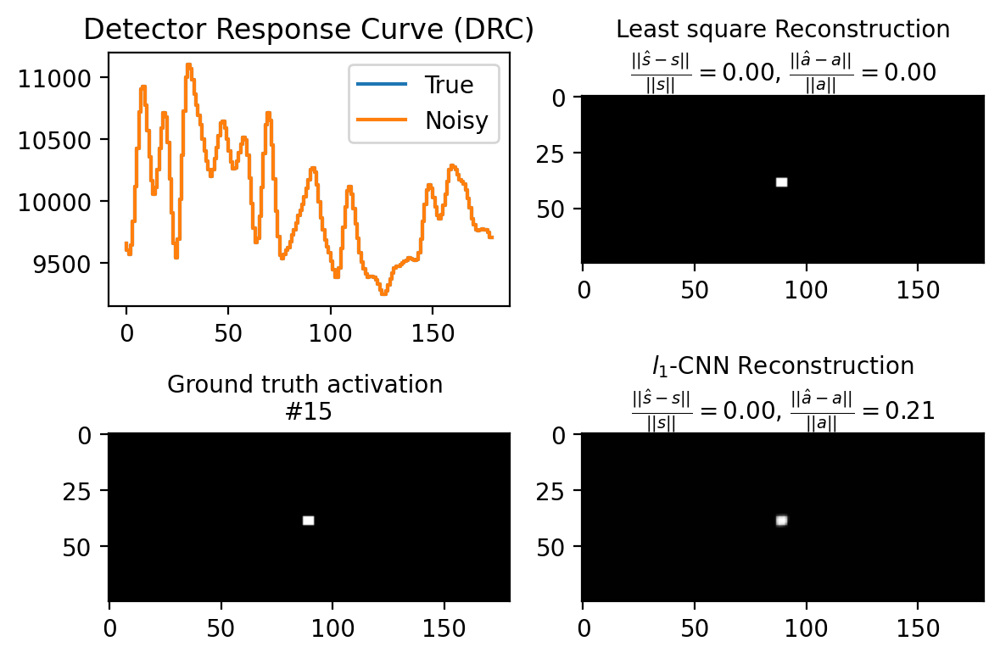

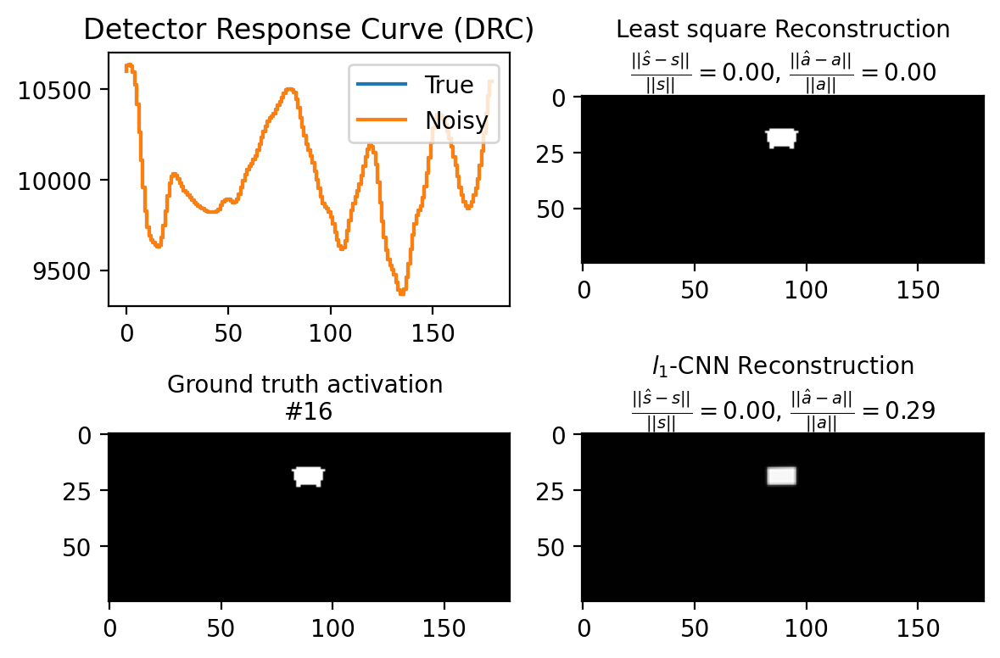

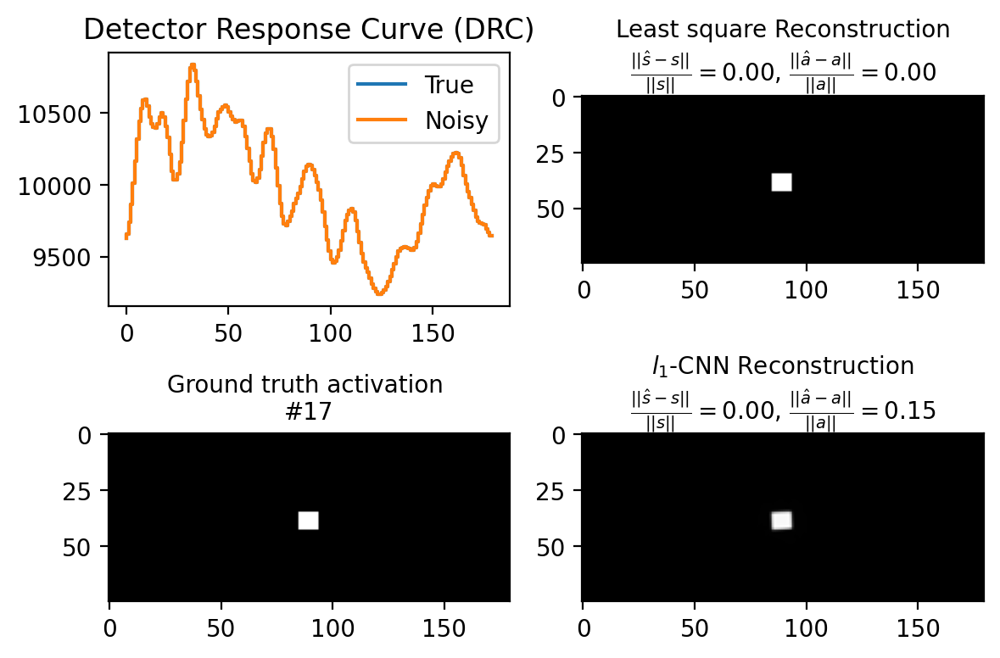

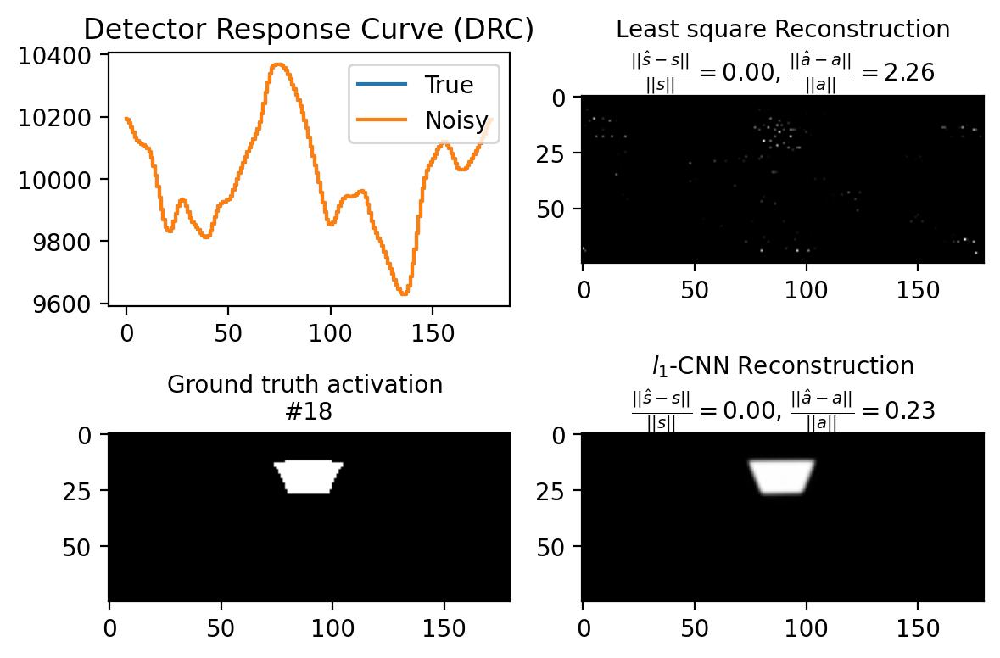

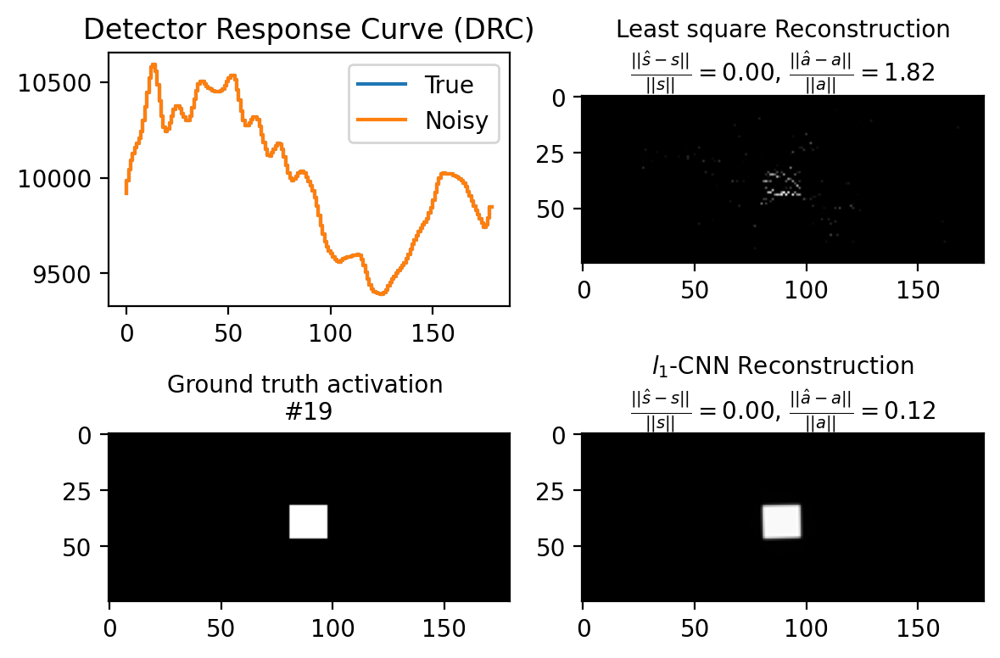

In [34]:
meanCounts = 10000 # 1% noise - 10,000 mean counts; 4% 1,600 - average counts for each rotational angle
# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0.03 # 0.08
gamma_val = 0.01 # used here! for CNN penalty 0.23
num_itr = 200 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 10 # not used

# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================


# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []

plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)

start_time = time.time()


for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    # matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n1.mat')
    # yi_n1 = matfile[f'y{i}.333333333333334'] 
    # yi_n1 = yi_n1.ravel()

    # matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n2.mat')
    # yi_n2 = matfile[f'y{i}.666666666666666'] 
    # yi_n2 = yi_n2.ravel()

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)

    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    

    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        x = xi_scale
        a = ai_scale
        DRM = DRM_origin
        Phi = Phi_origin



    # add noise and de-meaning    
    noise_std = 0
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise

    # # SNR
    # snr = SNR(x, meanCounts)
    print("Test #", i)

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')



    # Start testing

    # # least squares
    # a_est_ls, _ = sp.optimize.nnls(Phi, x)

    # data_fit_err_ls = LA.norm(x - Phi @ a_est_ls)/LA.norm(x)
    # recovery_err_ls = LA.norm(a - a_est_ls)/LA.norm(a)

    # data_fit_errors_ls.append(data_fit_err_ls)
    # recovery_errors_ls.append(recovery_err_ls)

    # nnls
    a_est_ls, _ = sp.optimize.nnls(Phi, x_noisy)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_ls)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_ls)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_ls, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)

    

    # l1-cnn

    a_init = np.zeros(a.shape)
    # a_init, _ = sp.optimize.nnls(Phi, x)

    a_est_pnp, _ = ADMM_pnp_las_fft(a=a_init, x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est_pnp = a_est_pnp / circ_col_norm(DRM)

    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax3.imshow(np.reshape(a, (m,n)))
    # ax3.set_title(r'Ground truth image', size = 10)
    ax3.set_title(r'Ground truth activation ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_ls, (m,n)))
    ax2.set_title(r"Least square Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"$l_1$-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

print(" ---------------------- Summary ------------------------------")
print("average NRMSE of nnls is", np.mean(recovery_errors_ls))
print("average NRMSE of l1-CNN is", np.mean(recovery_errors_pnp))
print()
print("average SSIM of nnls is", np.mean(ssim_errors_ls))
print("average SSIM of l1-CNN is", np.mean(ssim_errors_pnp))

In [33]:
print(" ---------------------- Summary ------------------------------")
print("average NRMSE of nnls is", np.mean(recovery_errors_ls))
print("average NRMSE of l1-CNN is", np.mean(recovery_errors_pnp))
print()
print("average SSIM of nnls is", np.mean(ssim_errors_ls))
print("average SSIM of l1-CNN is", np.mean(ssim_errors_pnp))

 ---------------------- Summary ------------------------------
average NRMSE of nnls is 0.447558618640622
average NRMSE of l1-CNN is 0.2803126765103254

average SSIM of nnls is 0.9429585740803
average SSIM of l1-CNN is 0.9887055416477628


#### Count DRC: noiseless (l1 vs l1-CNN)

Test # 11


<Figure size 432x288 with 0 Axes>

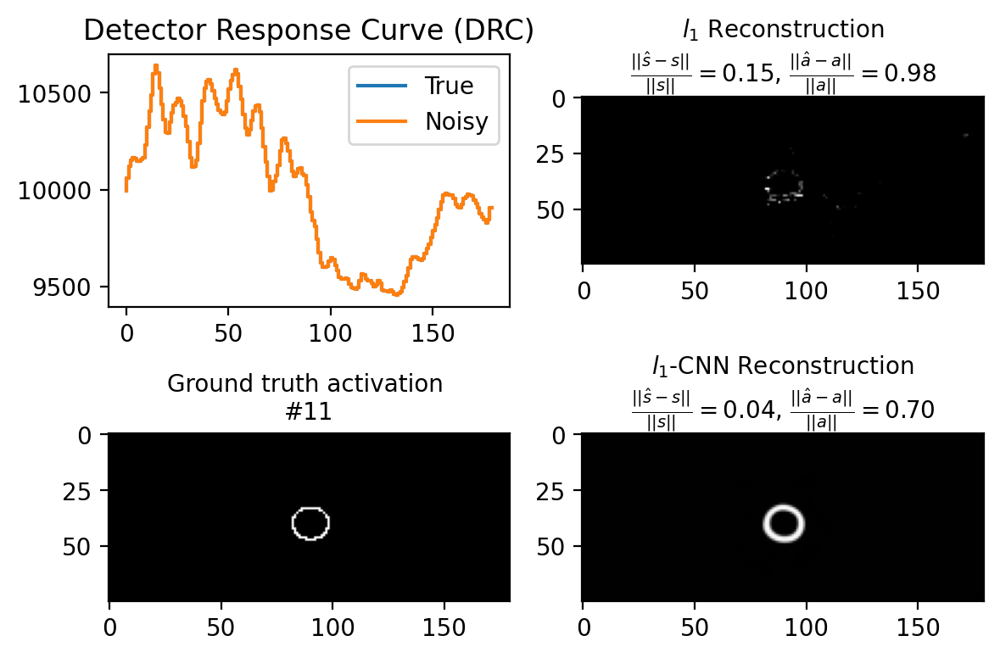

In [44]:
meanCounts = 10000 # 1% noise - 10,000 mean counts; 4% 1,600 - average counts for each rotational angle
# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# ===============================================
lambd_val = 0.01 # 0.08
gamma_val = 0.07 # used here! for CNN penalty 0.23
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 10 # not used

lambd_lasso = 0.1
gamma_lasso = 0

# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================


# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []

plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)




for i in [11]: # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    # matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n1.mat')
    # yi_n1 = matfile[f'y{i}.333333333333334'] 
    # yi_n1 = yi_n1.ravel()

    # matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n2.mat')
    # yi_n2 = matfile[f'y{i}.666666666666666'] 
    # yi_n2 = yi_n2.ravel()

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)

    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    

    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        # x = x0_scale
        # a = a0_scale
        # DRM = DRM_origin
        # Phi = Phi_origin

        # zero mean
        x = xi_scale 
        a = ai_scale 
        DRM = DRM_zeroMean
        Phi = Phi_zeroMean


    # add noise and de-meaning    
    noise_std = 0
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise

    # # SNR
    # snr = SNR(x, meanCounts)
    print("Test #", i)

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')

    # subtract mean
    x = x - np.mean(x) 
    x_noisy = x_noisy - np.mean(x_noisy)


    # Start testing

    # # least squares
    # a_est_ls, _ = sp.optimize.nnls(Phi, x)

    # data_fit_err_ls = LA.norm(x - Phi @ a_est_ls)/LA.norm(x)
    # recovery_err_ls = LA.norm(a - a_est_ls)/LA.norm(a)

    # data_fit_errors_ls.append(data_fit_err_ls)
    # recovery_errors_ls.append(recovery_err_ls)

    # lasso
    a_est_lasso, _ = ADMM_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_lasso, gamma=gamma_lasso, rho=np.mean(LA.norm(DRM, axis=1)) ** 2, niter=num_itr, m=m, n=n)

    # a_est_lasso = a_est_lasso / circ_col_norm(DRM)
    a_est_lasso = np.clip(a_est_lasso, 0, np.inf)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_lasso)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_lasso)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_lasso, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)

    

    start_time = time.time()

    a_est_pnp, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est_pnp = a_est_pnp / circ_col_norm(DRM)

    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax3.imshow(np.reshape(a, (m,n)))
    # ax3.set_title(r'Ground truth image', size = 10)
    ax3.set_title(r'Ground truth activation ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_lasso, (m,n)))
    ax2.set_title(r"$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"$l_1$-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 



#### Count DRC: noiseless (TV vs l1-TV-CNN)

Test # 0 , with SNR =  11.611192872241816 dB
Average NRMSE by TV Reconstruction =  0.7498670776627834
Average NRMSE by l1-TV-CNN Reconstruction =  0.23868482465003613
Test # 1 , with SNR =  13.060819778171455 dB
Average NRMSE by TV Reconstruction =  0.7676296803350328
Average NRMSE by l1-TV-CNN Reconstruction =  0.2858082662261331
Test # 2 , with SNR =  9.895305988825262 dB
Average NRMSE by TV Reconstruction =  0.6704239280682113
Average NRMSE by l1-TV-CNN Reconstruction =  0.2008384646223999
Test # 3 , with SNR =  12.406327746649808 dB
Average NRMSE by TV Reconstruction =  0.6684366014821176
Average NRMSE by l1-TV-CNN Reconstruction =  0.21053495019876167
Test # 4 , with SNR =  6.058438097157849 dB
Average NRMSE by TV Reconstruction =  0.8357557623218191
Average NRMSE by l1-TV-CNN Reconstruction =  0.14519119201843703
Test # 5 , with SNR =  11.396986603900793 dB
Average NRMSE by TV Reconstruction =  0.891343442208092
Average NRMSE by l1-TV-CNN Reconstruction =  0.14617371259622025
Tes

C:\Users\22057\AppData\Local\Temp\ipykernel_56692\2092152786.py:144: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=2, ncols=2)


Average NRMSE by TV Reconstruction =  0.8796037376952047
Average NRMSE by l1-TV-CNN Reconstruction =  0.019488025543372717


<Figure size 432x288 with 0 Axes>

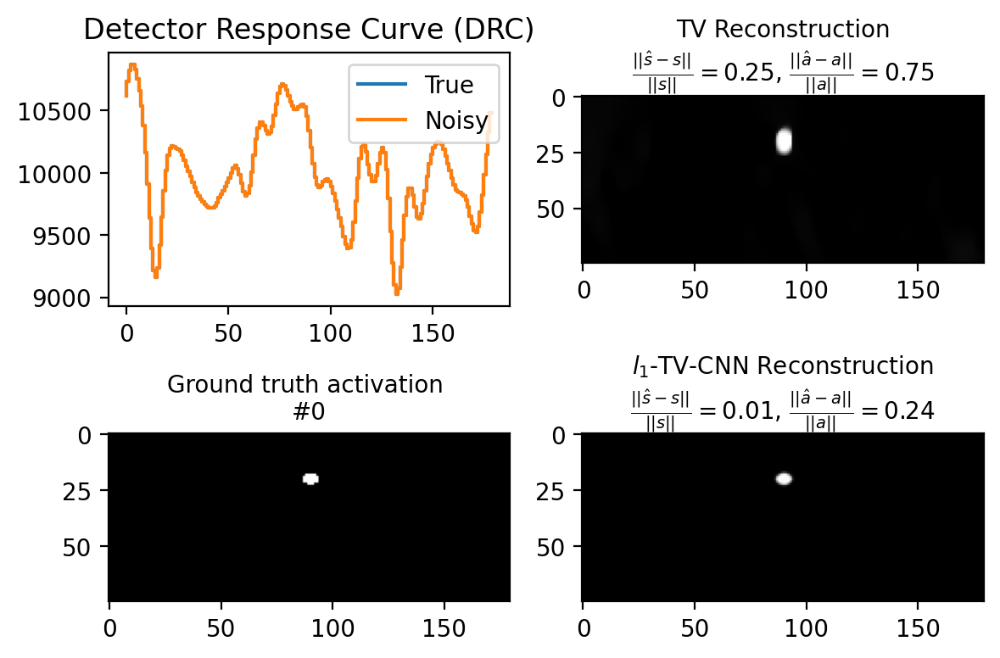

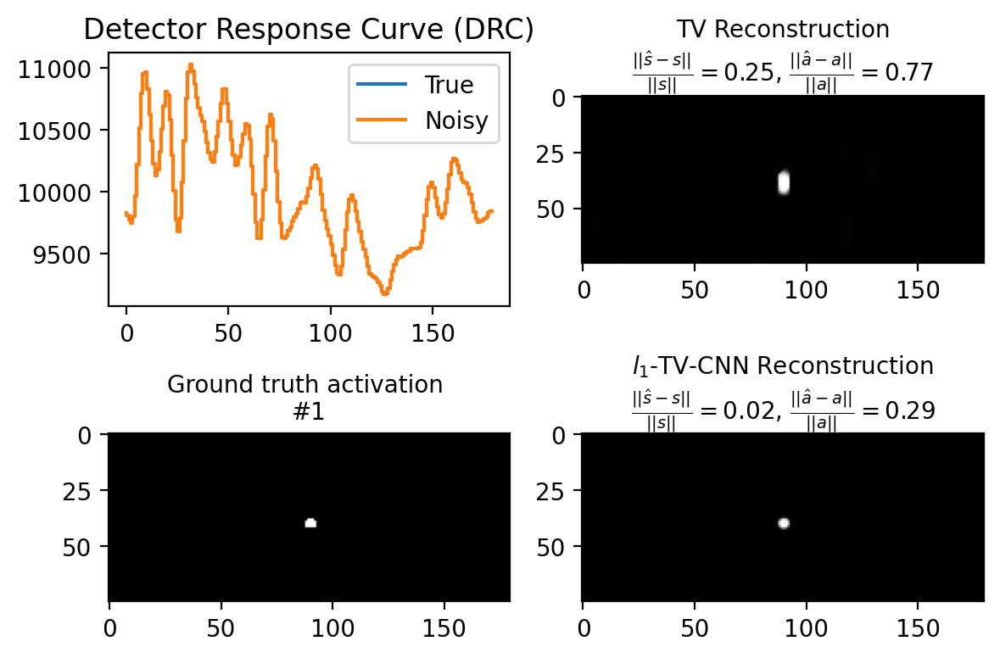

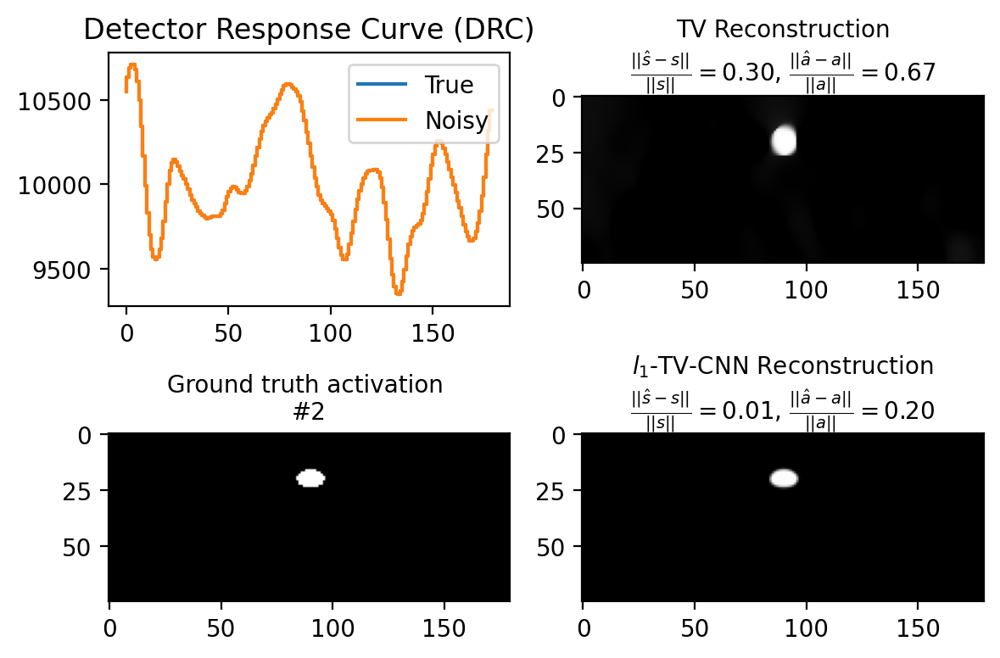

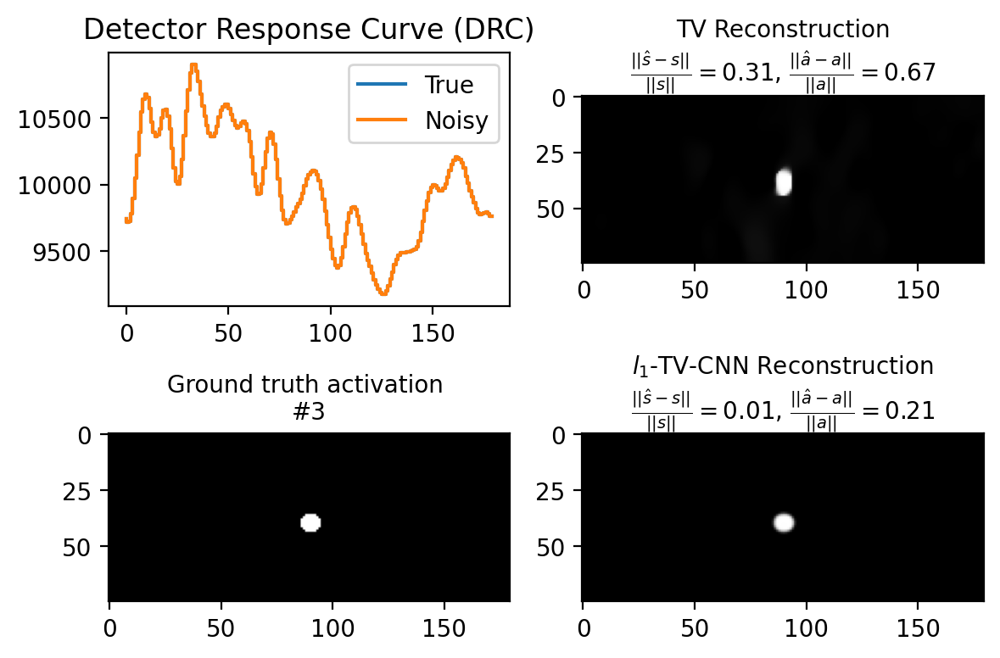

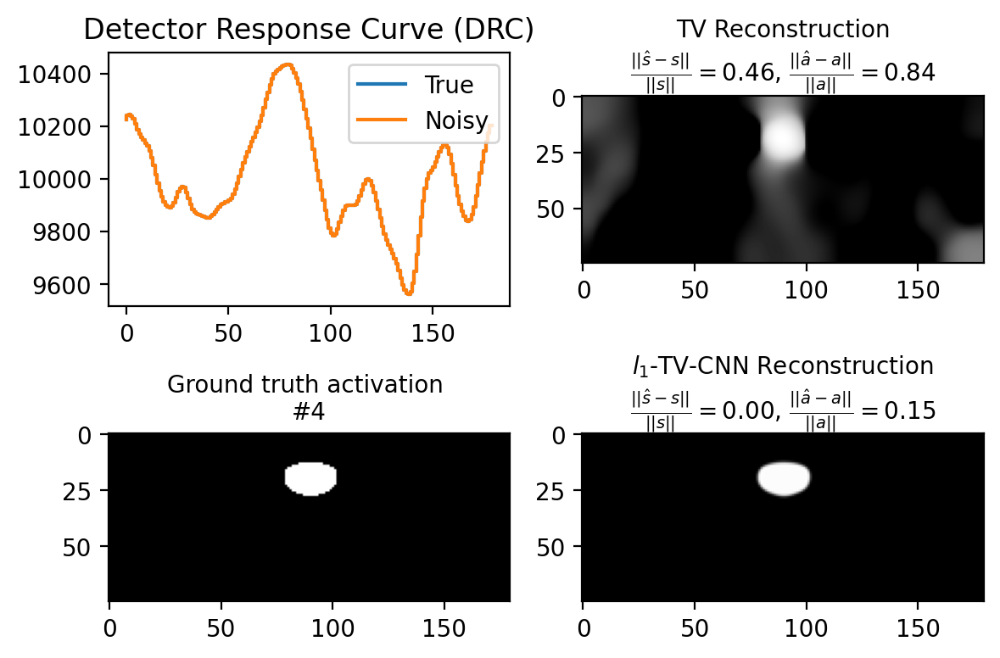

...

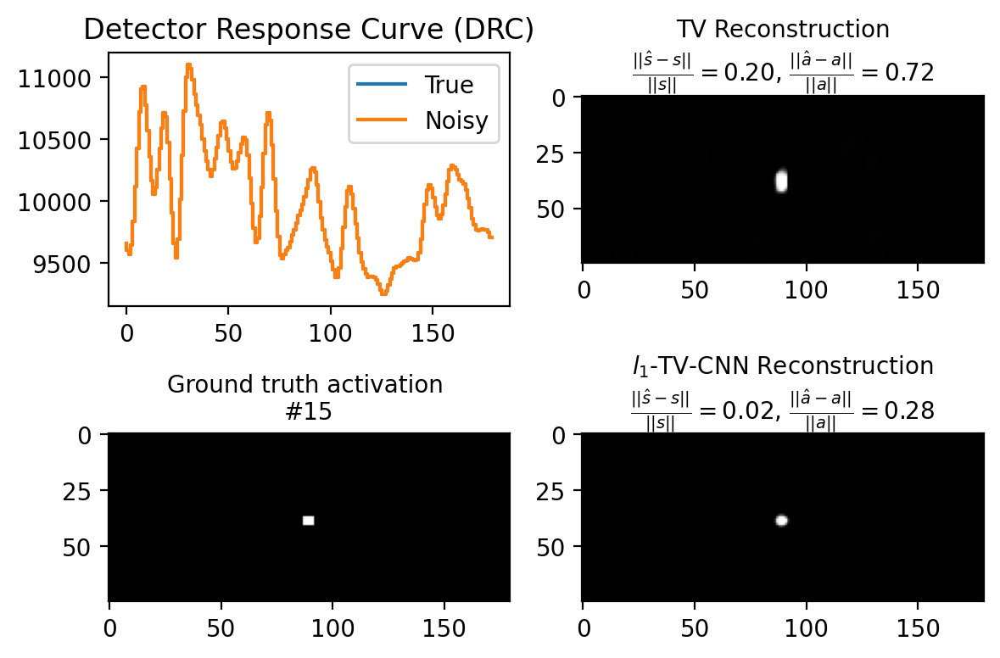

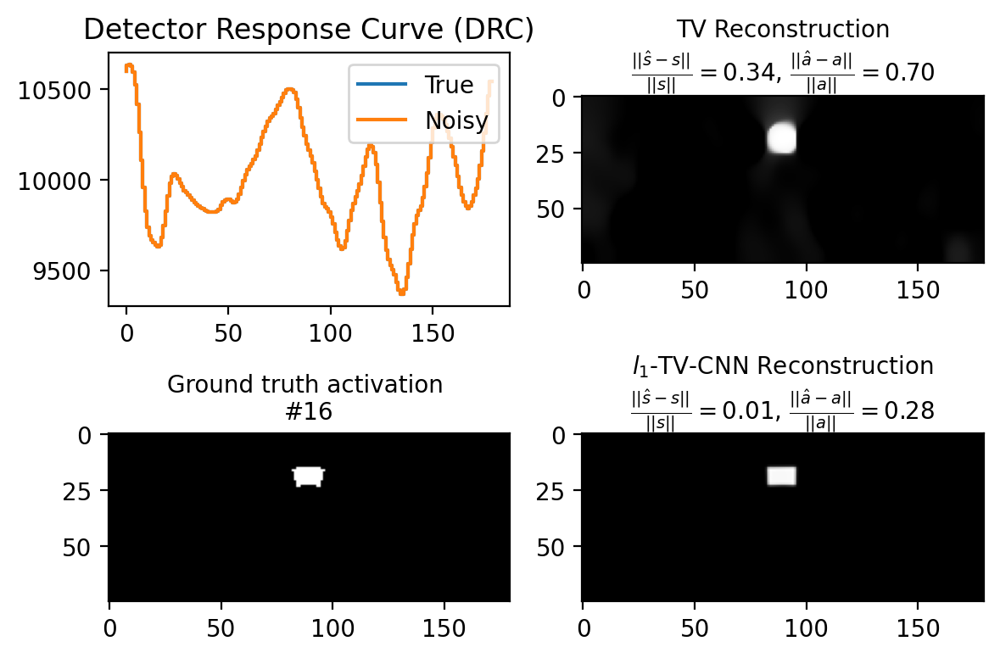

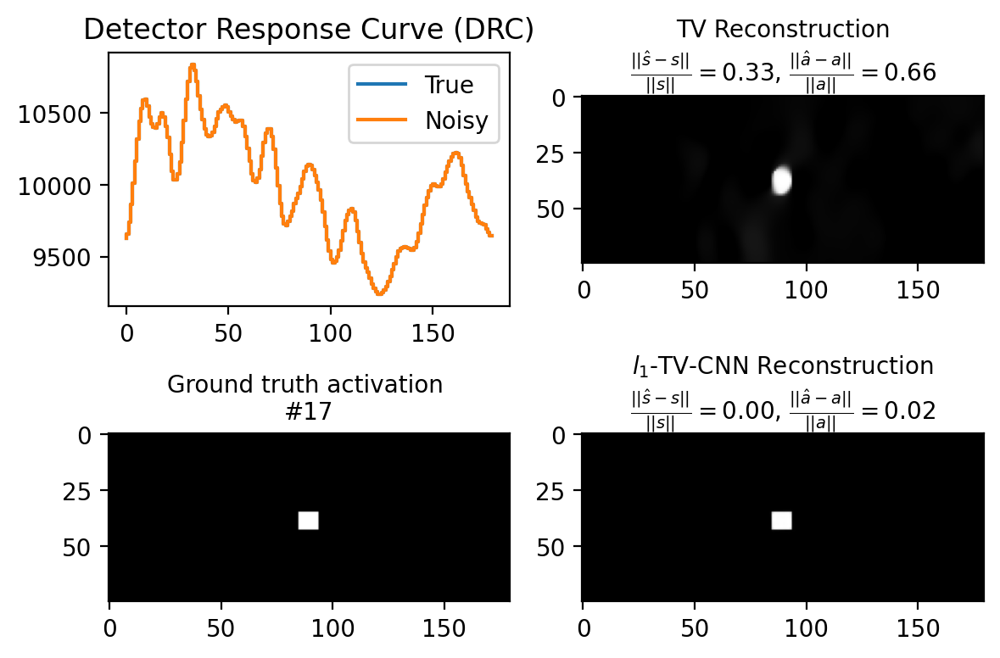

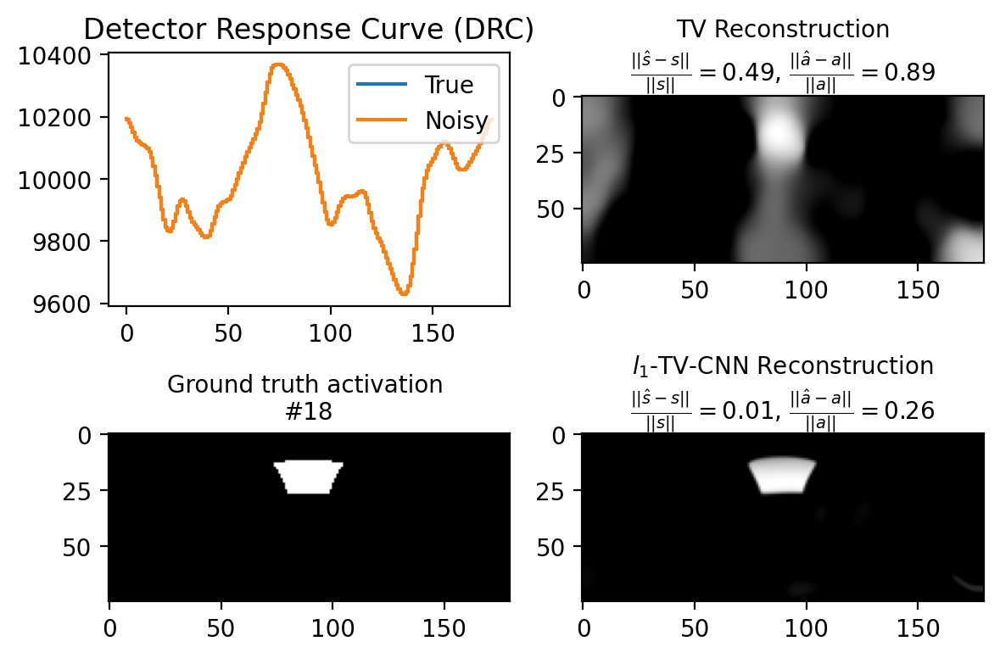

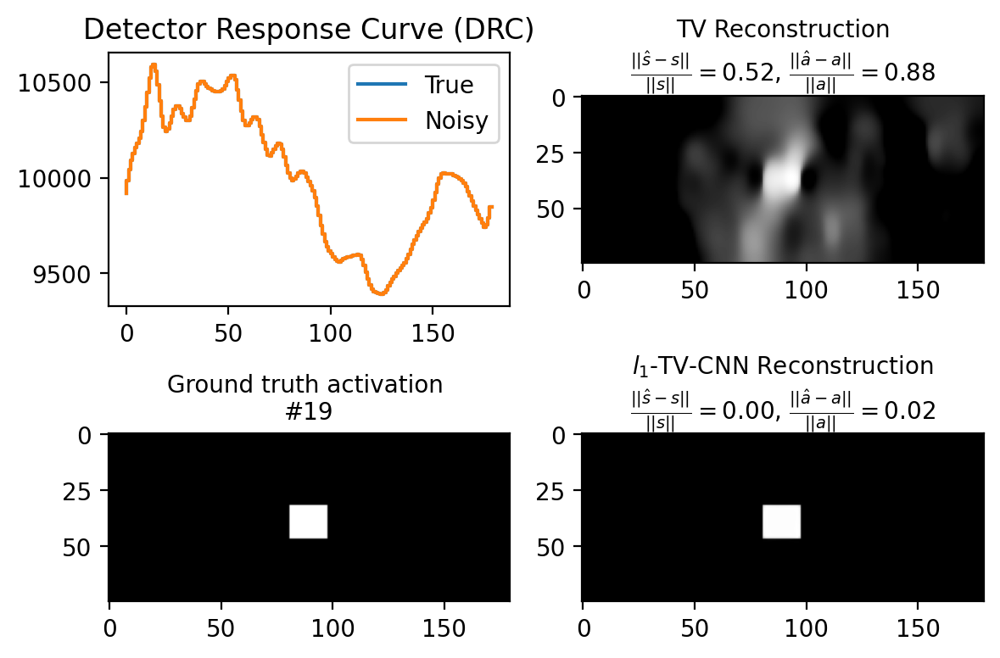

In [76]:
np.random.seed(0) # not needed, no noise here

noise_percent = 0
# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================
lambd_1_val = 0.01 # 0.08
lambd_2_val = 0.08
lambd_3_val = 0.05 # used here! for CNN penalty 0.23
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 1e6 # 10 or 100

lambd_tv = 3
gamma_tv = 0


# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []


plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)


    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        # x = x0_scale
        # a = a0_scale
        # DRM = DRM_origin
        # Phi = Phi_origin

        # zero mean
        x = xi_scale 
        a = ai_scale 
        DRM = DRM_zeroMean
        Phi = Phi_zeroMean

    # add noise and de-meaning    
    noise_std = np.sqrt(meanCounts*noise_percent)
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    # x_noisy = np.random.poisson(x) # poisson noise


    # SNR
    snr = SNR(x, meanCounts)
    print("Test #", i, ", with SNR = ", snr, "dB")

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')

    # subtract mean
    x = x - np.mean(x) 
    x_noisy = x_noisy - np.mean(x_noisy)


    # Start testing    

    # lasso
    a_est_lasso, _ = ADMM_tv_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_tv, gamma=gamma_tv, rho=np.mean(LA.norm(DRM, axis=1)), niter=num_itr, m=m, n=n)

    # a_est_lasso = a_est_lasso / circ_col_norm(DRM)
    a_est_lasso = np.clip(a_est_lasso, 0, np.inf)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_lasso)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_lasso)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_lasso, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)

    
    start_time = time.time()

    a_est_pnp, _ = ADMM_pnp_flas_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd_1=lambd_1_val, lambd_2=lambd_2_val, lambd_3=lambd_3_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est_pnp = a_est_pnp / circ_col_norm(DRM)

    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax3.imshow(np.reshape(a, (m,n)))
    # ax3.set_title(r'Ground truth image', size = 10)
    ax3.set_title(r'Ground truth activation ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_lasso, (m,n)))
    ax2.set_title(r"TV Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"$l_1$-TV-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

print("Average NRMSE by TV Reconstruction = ", np.mean(recovery_err_ls))
print("Average NRMSE by l1-TV-CNN Reconstruction = ", np.mean(recovery_err_pnp))

#### Count DRC: noisy (AWGN)

Test # 0 , with SNR =  11.611192872241816 dB
Test # 1 , with SNR =  13.060819778171455 dB
Test # 2 , with SNR =  9.895305988825262 dB
Test # 3 , with SNR =  12.406327746649808 dB
Test # 4 , with SNR =  6.058438097157849 dB
Test # 5 , with SNR =  11.396986603900793 dB
Test # 6 , with SNR =  11.3419627525458 dB
Test # 7 , with SNR =  13.017392354543627 dB
Test # 8 , with SNR =  9.01852387174636 dB
Test # 9 , with SNR =  12.297214276656419 dB
Test # 10 , with SNR =  4.729416199127502 dB
Test # 11 , with SNR =  11.056165134223745 dB
Test # 12 , with SNR =  13.124397149559787 dB
Test # 13 , with SNR =  13.657235790809901 dB
Test # 14 , with SNR =  11.276074991079481 dB
Test # 15 , with SNR =  12.854751968557192 dB
Test # 16 , with SNR =  9.174137269351503 dB
Test # 17 , with SNR =  11.825057961066971 dB
Test # 18 , with SNR =  4.843513418748327 dB
Test # 19 , with SNR =  10.780909371332525 dB
 ---------------------- Summary ------------------------------
average NRMSE of nnls is 1.801213023

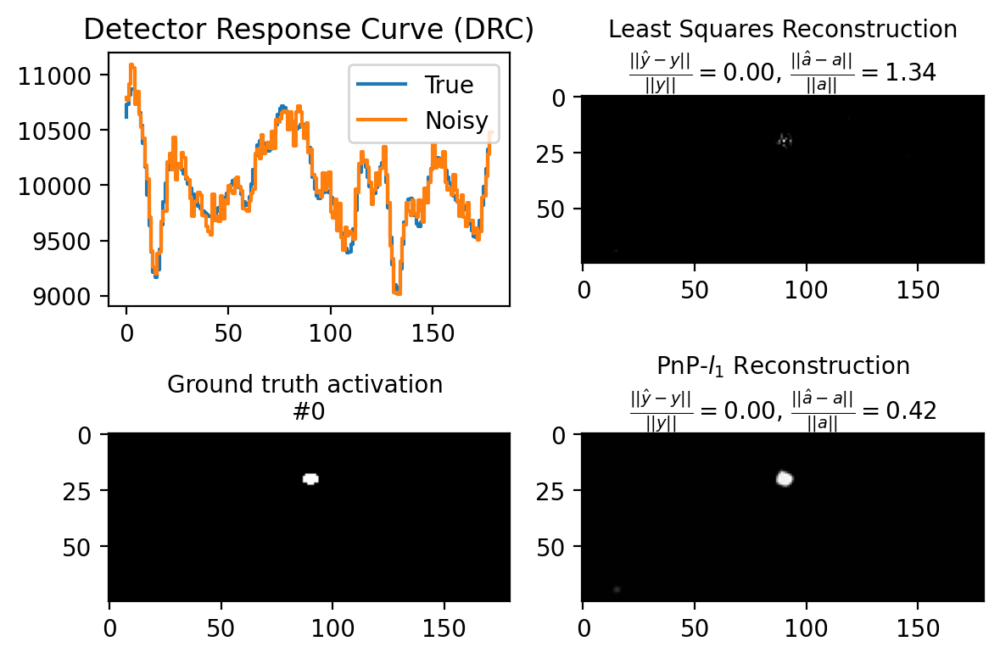

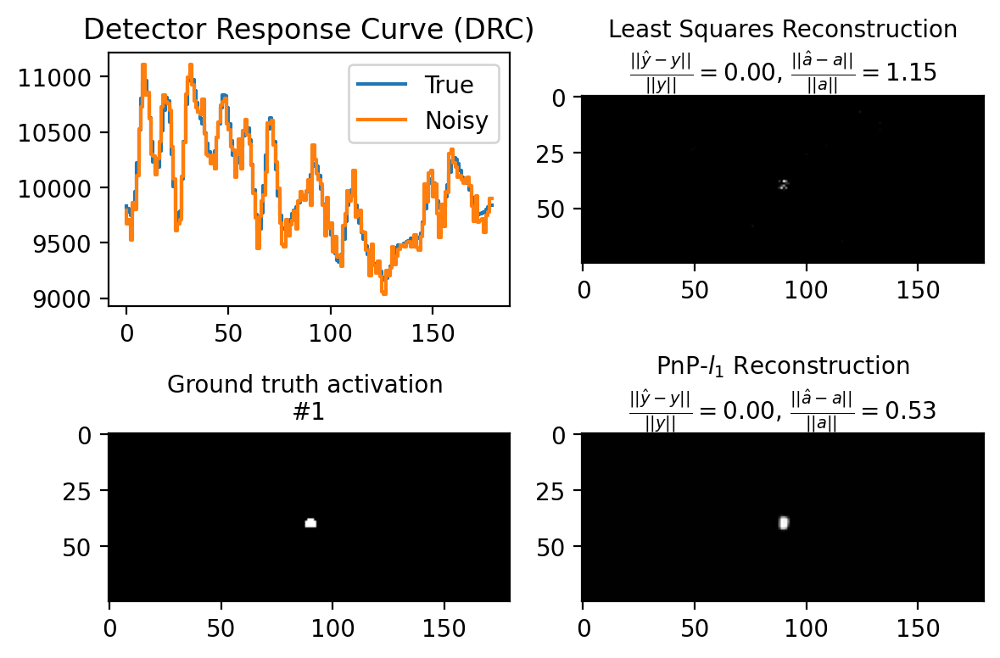

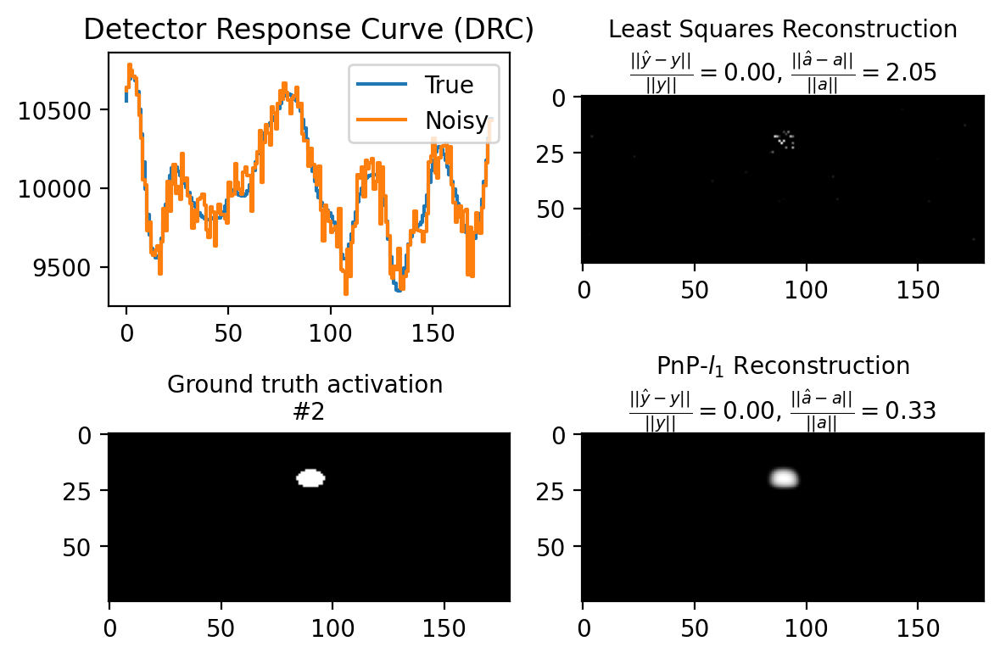

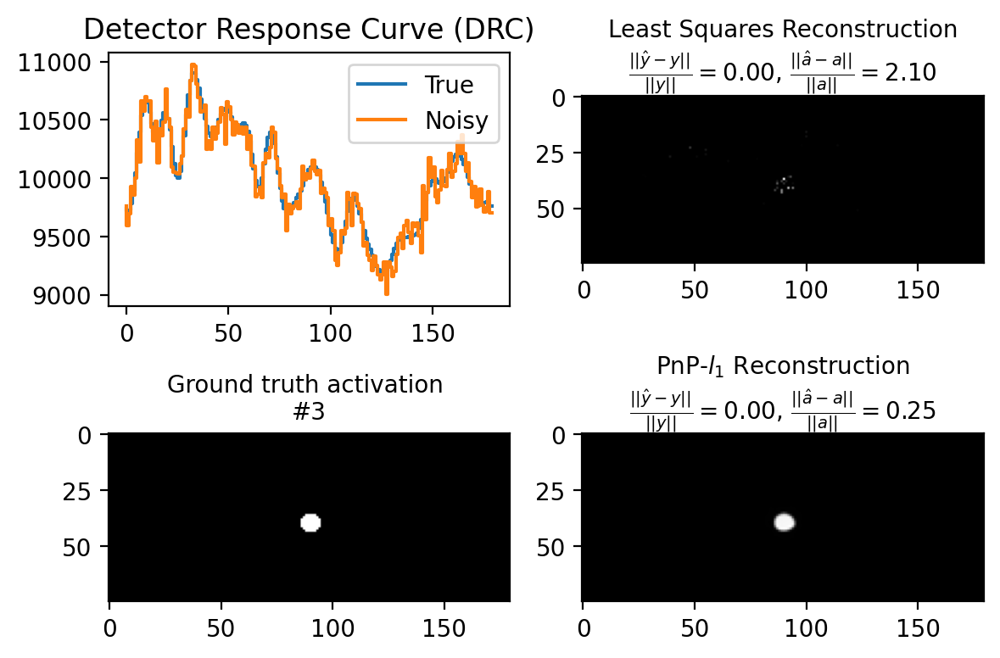

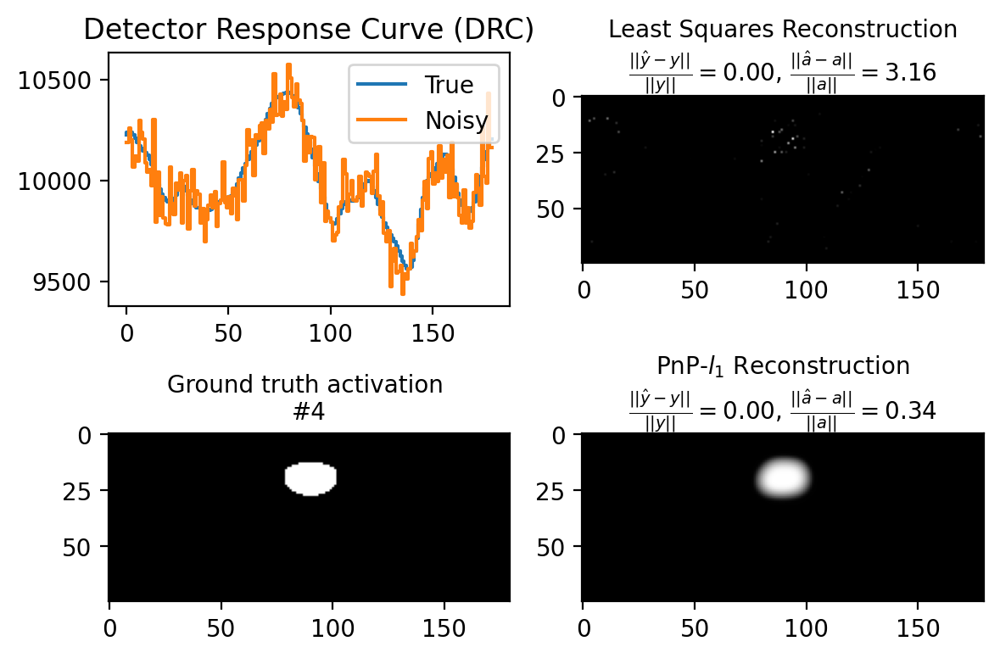

...

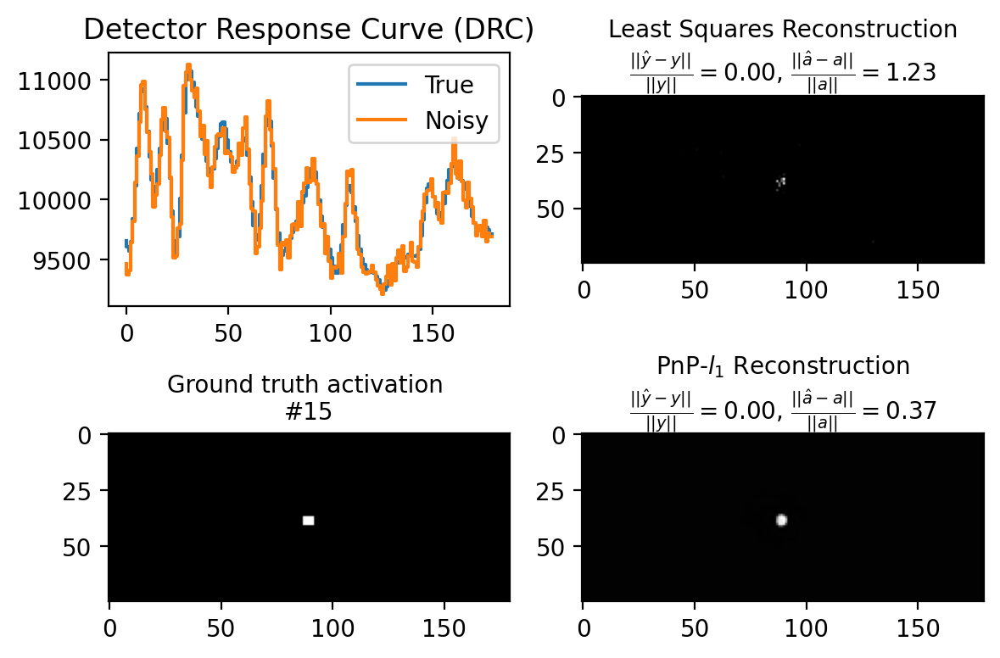

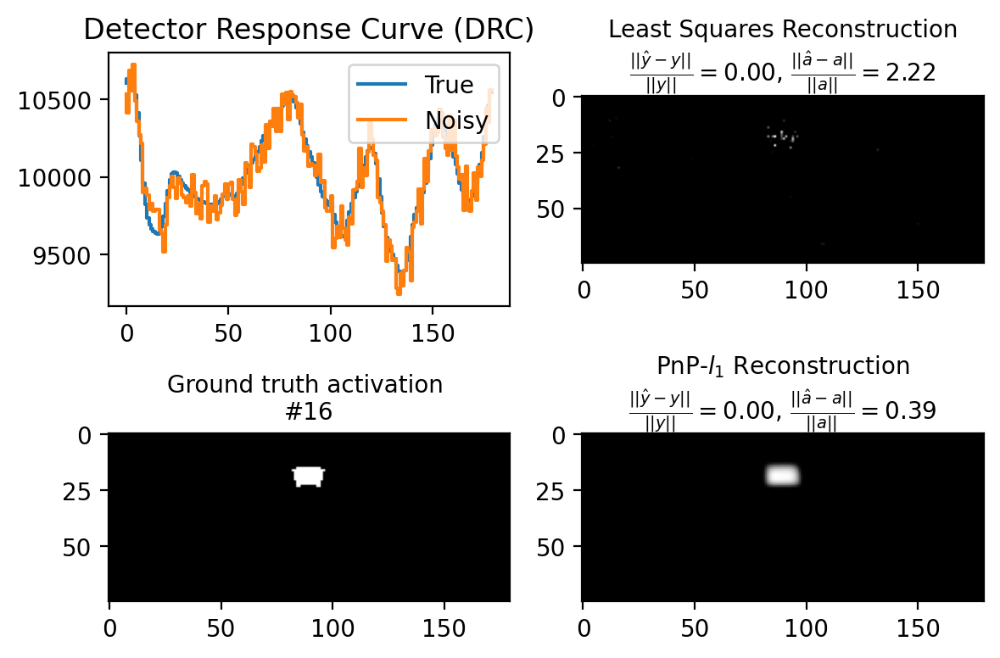

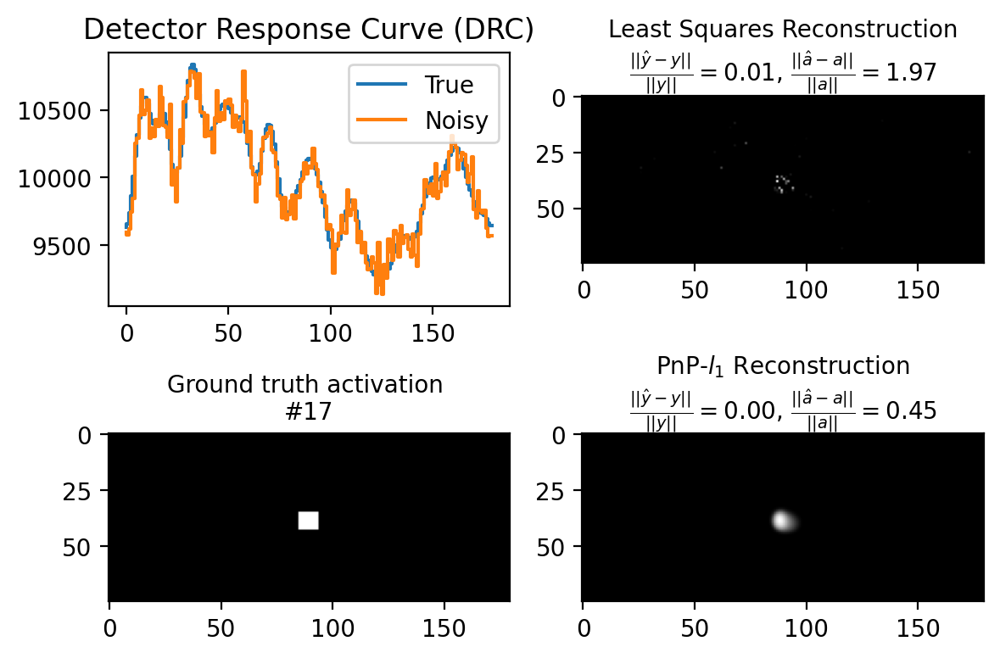

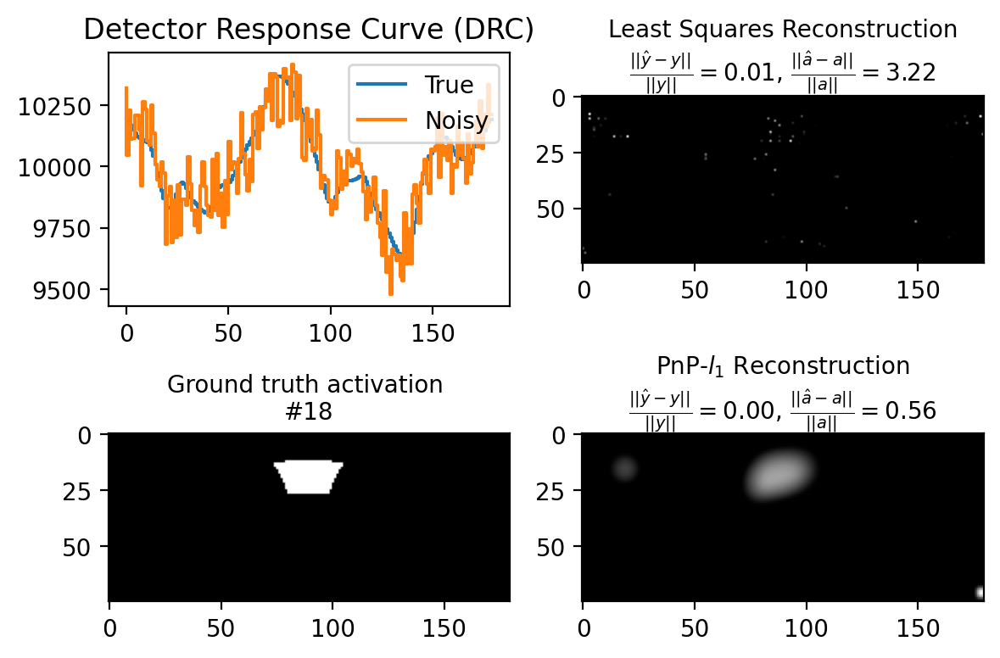

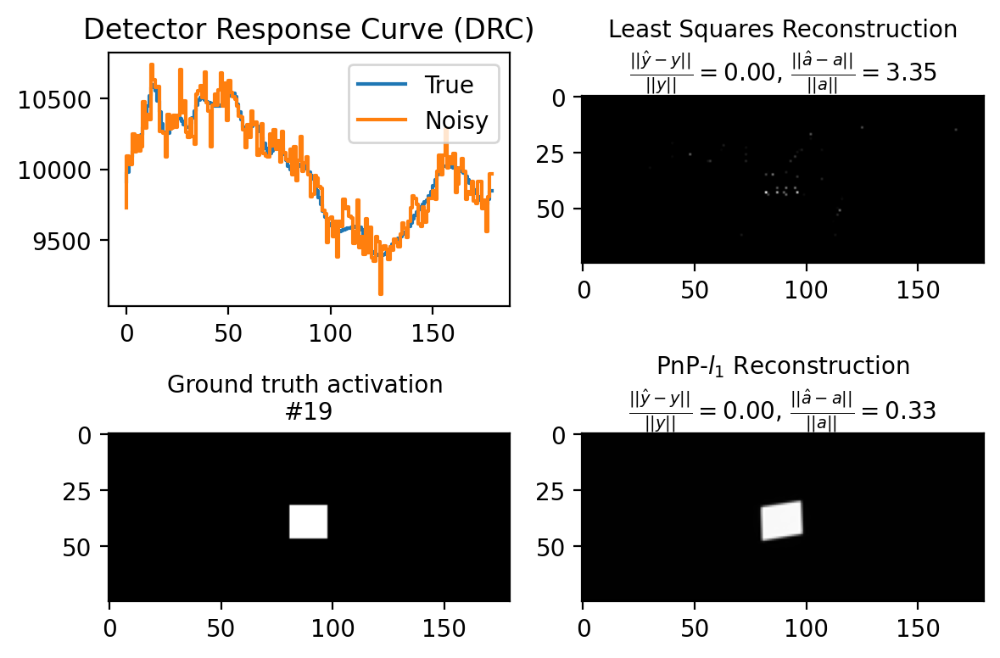

In [100]:
np.random.seed(0)

# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================
lambd_val = 0.36 # 0.08
gamma_val = 0.23 # used here! for CNN penalty 0.23
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 10 # 10 or 100


# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================
matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

# raw, normalized, zero-mean DRM
DRM_origin = np.reshape(Phi[0,:], (m,n))
Phi_origin = Phi

DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
Phi_zeroMean = generate_Phi(DRM_zeroMean)

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []



# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        x = xi_scale
        a = ai_scale
        DRM = DRM_origin
        Phi = Phi_origin


    # add noise  
    noise_std = np.sqrt(meanCounts)
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    # x_noisy = np.random.poisson(x) # poisson noise


    # SNR
    snr = SNR(x, meanCounts)
    print("Test #", i, ", with SNR = ", snr, "dB")

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')


    # Start testing    

    # least squares
    a_est_ls, _ = sp.optimize.nnls(Phi, x_noisy)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_ls)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_ls)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_ls, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)


    a_est_pnp, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est_pnp = a_est_pnp / circ_col_norm(DRM)

    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax3.imshow(np.reshape(a, (m,n)))
    ax3.set_title(r'Ground truth activation ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_ls, (m,n)))
    ax2.set_title(r"Least Squares Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"PnP-$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{y}} - y||}}{{||y||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

print(" ---------------------- Summary ------------------------------")
print("average NRMSE of nnls is", np.mean(recovery_errors_ls))
print("average NRMSE of l1-CNN is", np.mean(recovery_errors_pnp))
print()
print("average SSIM of nnls is", np.mean(ssim_errors_ls))
print("average SSIM of l1-CNN is", np.mean(ssim_errors_pnp))

#### Count DRC: noisy (Poisson)

 ---------------------- Summary ------------------------------
average NRMSE of nnls is 1.8412845037630219
average NRMSE of l1-CNN is 0.56185870755743

average SSIM of nnls is 0.9383303658095403
average SSIM of l1-CNN is 0.9810939215395124


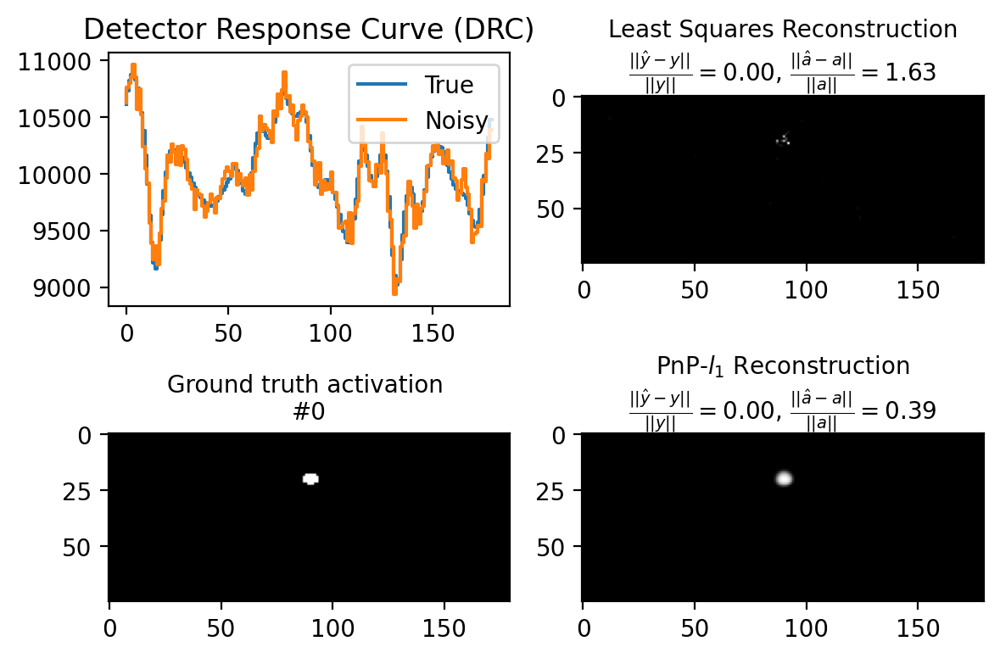

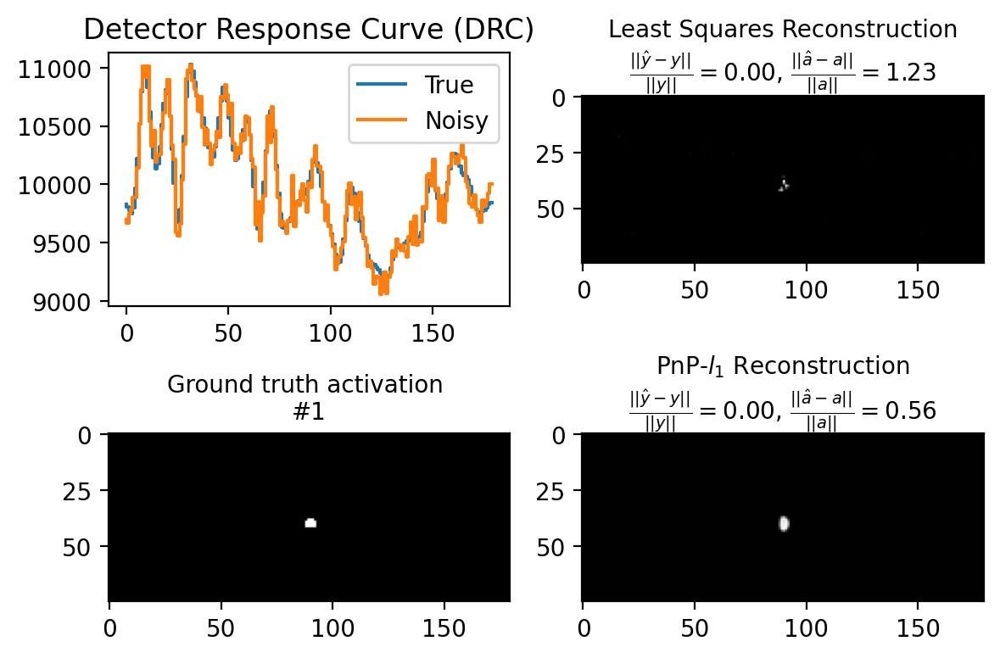

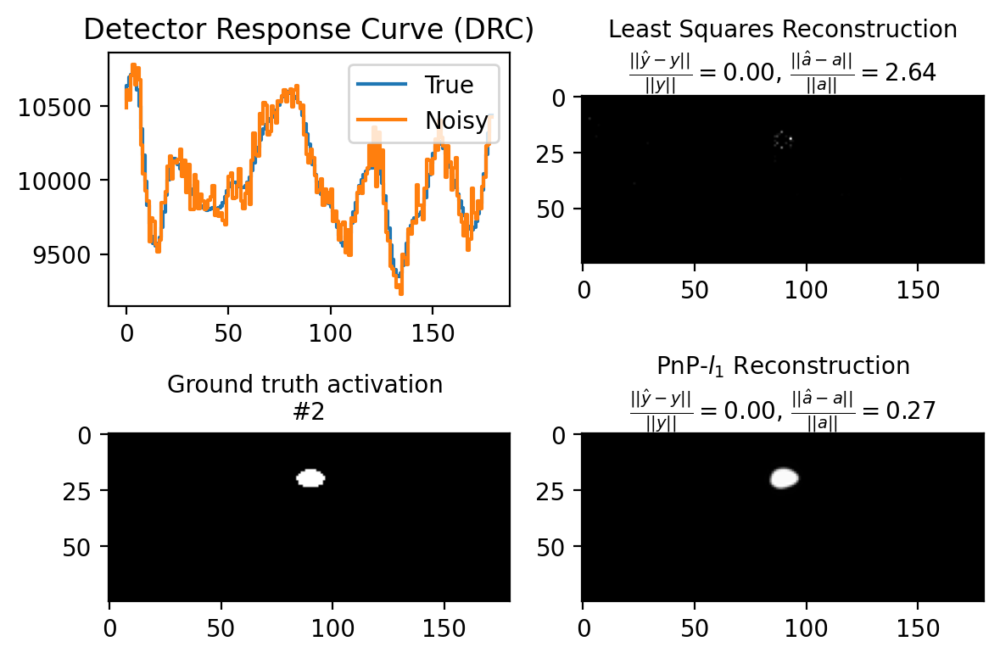

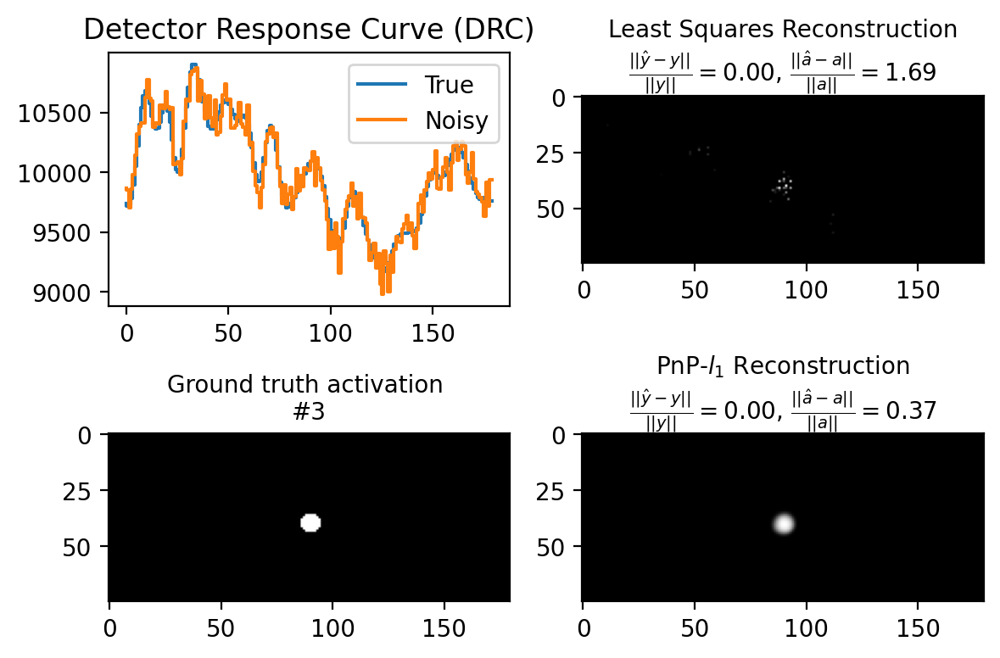

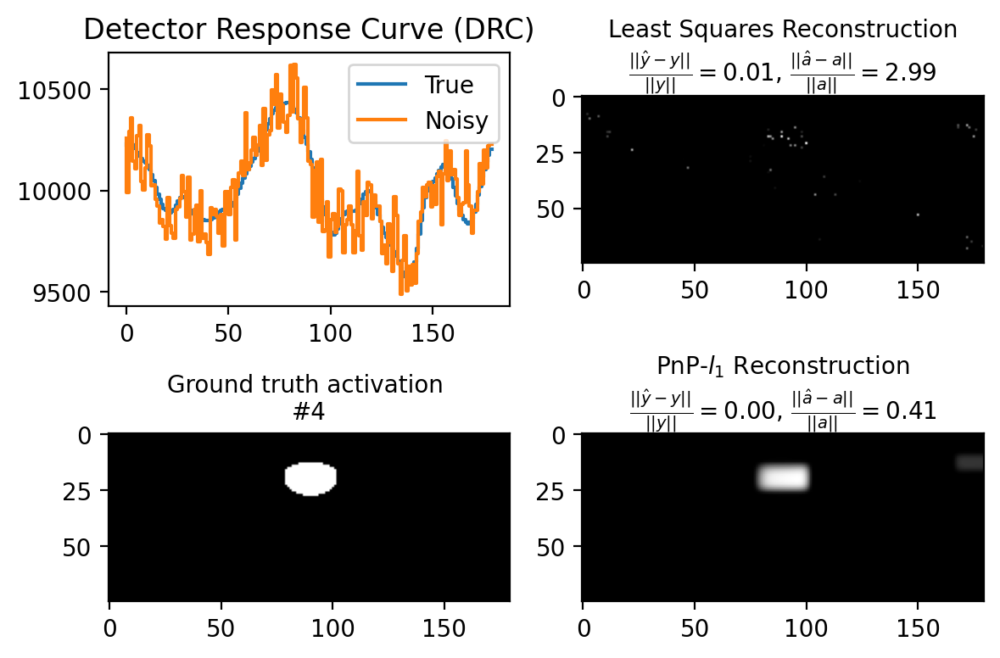

...

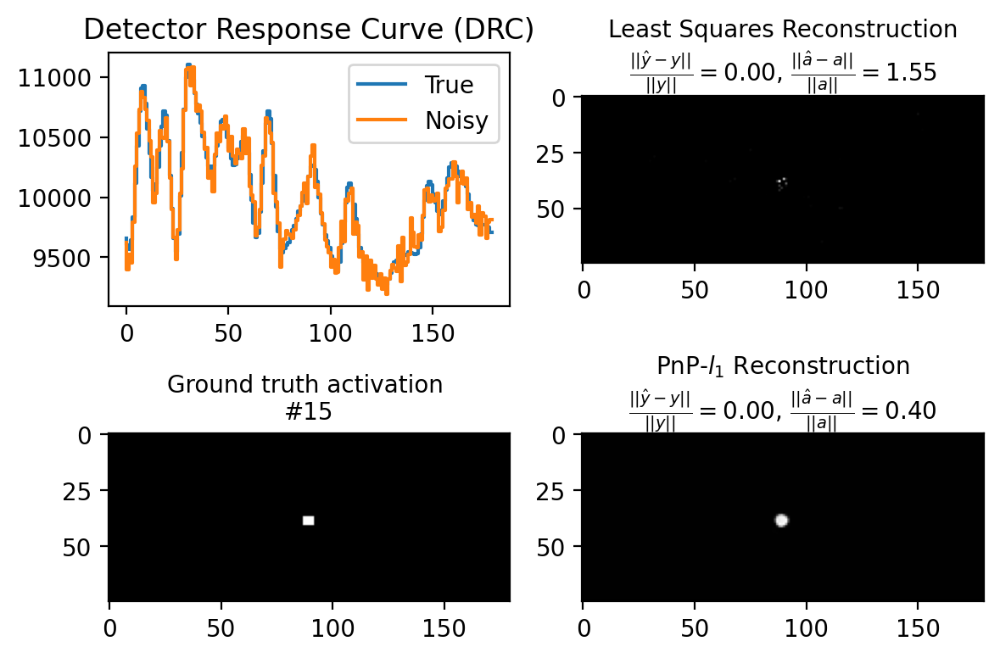

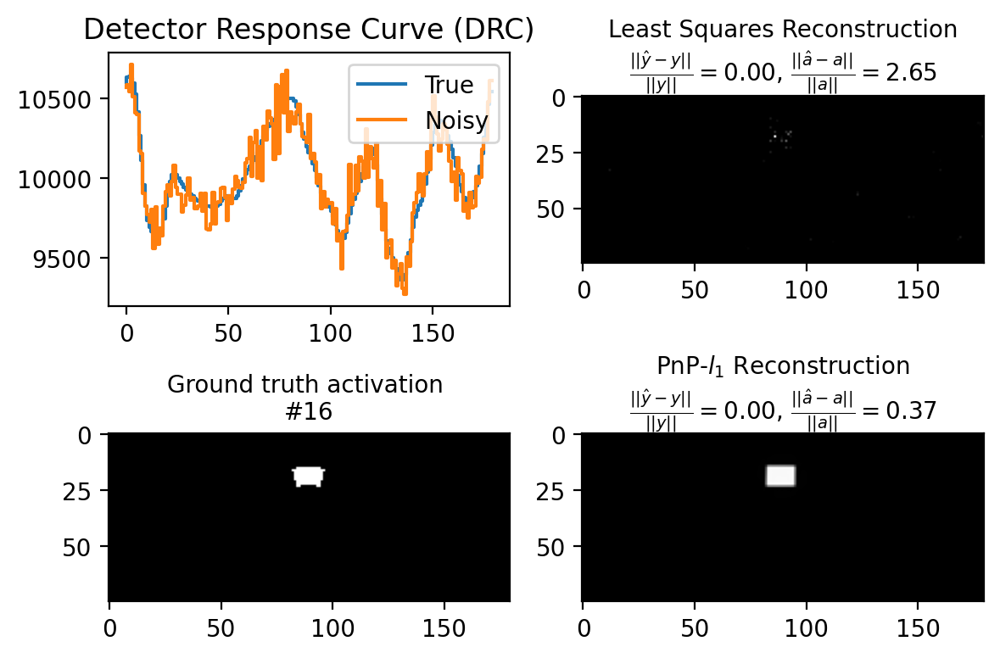

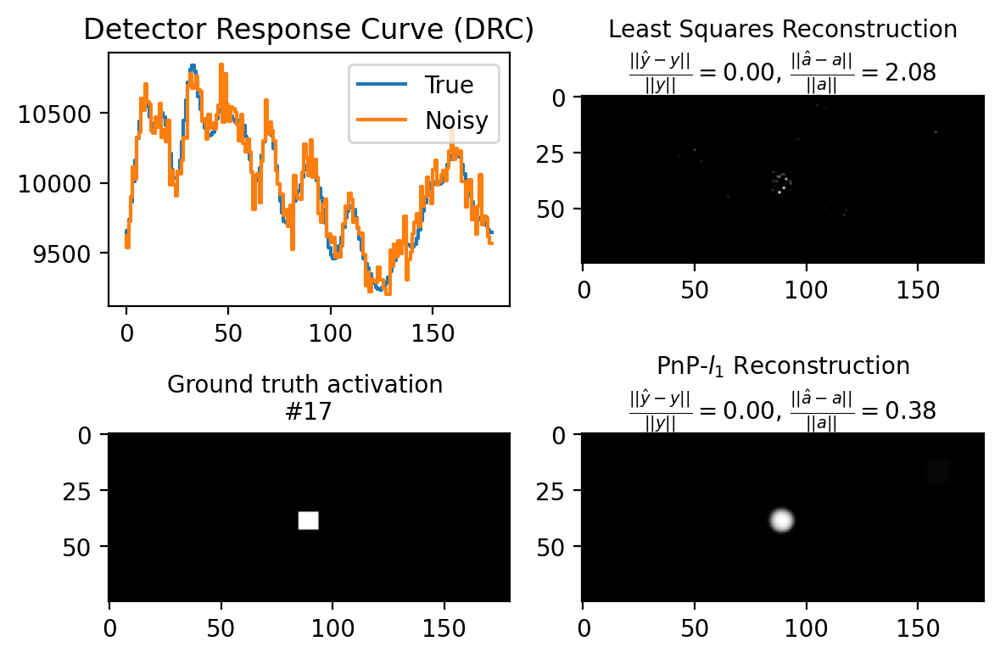

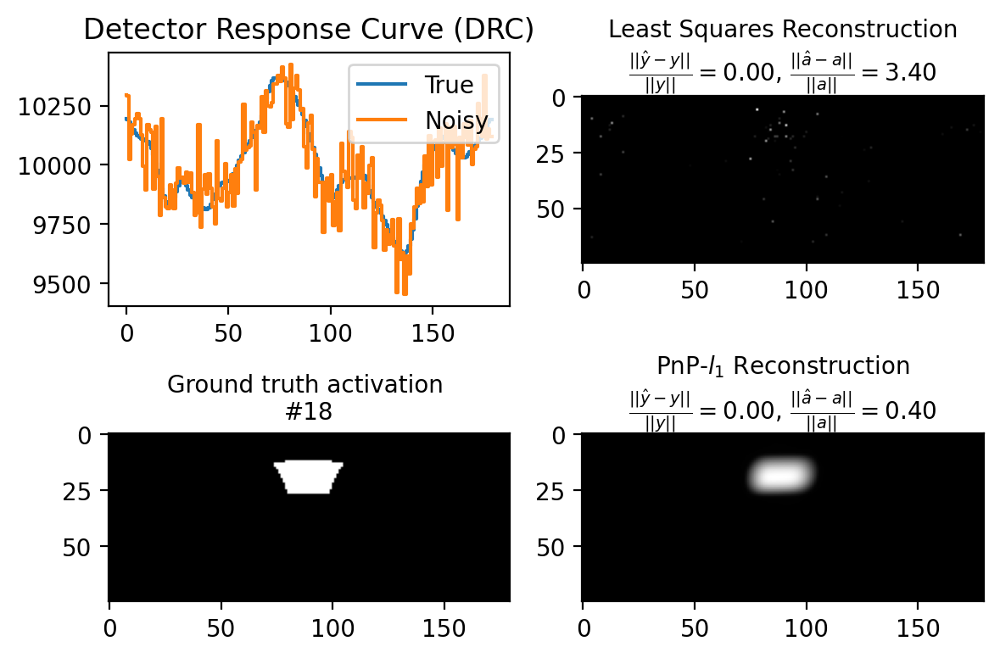

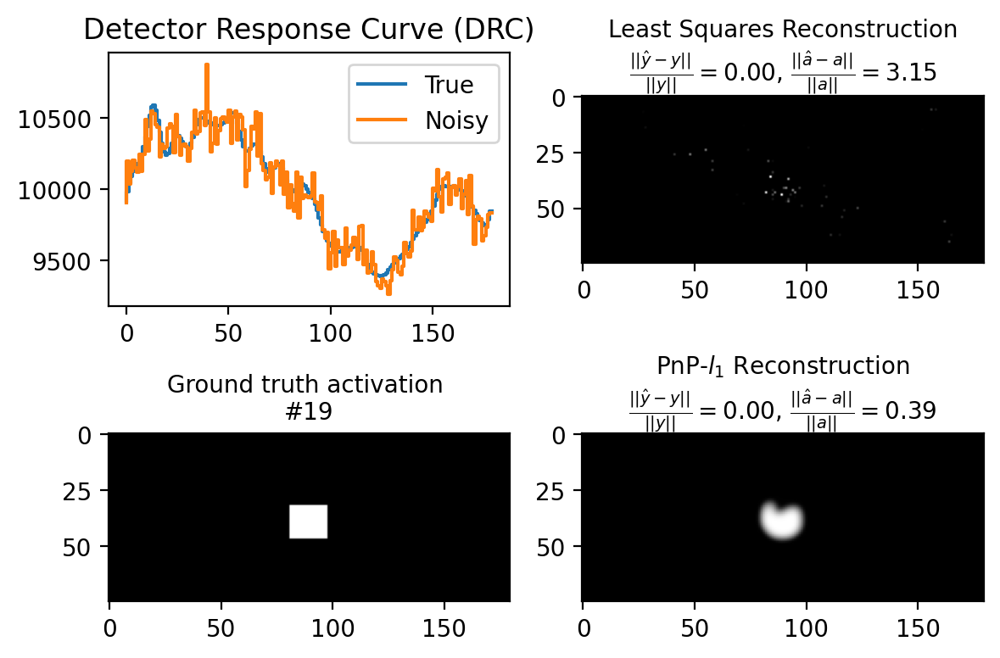

In [95]:
np.random.seed(0)

# PnP - flas # 100, 88
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================
lambd_val = 0.36 # 0.08
gamma_val = 0.23 # used here! for CNN penalty 0.23
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 1e-3 # 10 or 100


# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================
matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

# raw, normalized, zero-mean DRM
DRM_origin = np.reshape(Phi[0,:], (m,n))
Phi_origin = Phi

DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
Phi_zeroMean = generate_Phi(DRM_zeroMean)

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []


# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # no processing at all
        x = xi_scale
        a = ai_scale
        DRM = DRM_origin
        Phi = Phi_origin



    # add noise     
    # noise_std = np.sqrt(max(abs(x))*noise_percent)
    # x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    x_noisy = np.random.poisson(x) # poisson noise

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')



    # x = x - np.mean(x) 
    # x_noisy = x_noisy - np.mean(x_noisy)


    # Start testing    

    # least squares
    a_est_ls, _ = sp.optimize.nnls(Phi, x_noisy)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_ls)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_ls)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_ls, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)

    
    start_time = time.time()

    a_init = np.zeros(a.shape)
    # a_init, _ = sp.optimize.nnls(Phi, x_noisy)

    a_est_pnp, _ = ADMM_pnp_las_fft(a=a_init, x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est_pnp = a_est_pnp / circ_col_norm(DRM)

    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())
    

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)
    


    
    a_img = ax3.imshow(np.reshape(a, (m,n)))
    ax3.set_title(r'Ground truth activation ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_ls, (m,n)))
    ax2.set_title(r"Least Squares Reconstruction" + "\n" + f'$ \\frac{{||\hat{{y}} - y||}}{{||y||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"PnP-$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{y}} - y||}}{{||y||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

print(" ---------------------- Summary ------------------------------")
print("average NRMSE of nnls is", np.mean(recovery_errors_ls))
print("average NRMSE of l1-CNN is", np.mean(recovery_errors_pnp))
print()
print("average SSIM of nnls is", np.mean(ssim_errors_ls))
print("average SSIM of l1-CNN is", np.mean(ssim_errors_pnp))

#### Count DRC: baselines - mlem (w/o mrp), l1(w/o positivity constraint), TV, elastic-net

In [10]:
recovery_err_nnls

1.3382359210708779

Test # 0 , with SNR =  11.611192872241816 dB
Test # 1 , with SNR =  13.060819778171455 dB
Test # 2 , with SNR =  9.895305988825262 dB
Test # 3 , with SNR =  12.406327746649808 dB
Test # 4 , with SNR =  6.058438097157849 dB
Test # 5 , with SNR =  11.396986603900793 dB
Test # 6 , with SNR =  11.3419627525458 dB
Test # 7 , with SNR =  13.017392354543627 dB
Test # 8 , with SNR =  9.01852387174636 dB
Test # 9 , with SNR =  12.297214276656419 dB
Test # 10 , with SNR =  4.729416199127502 dB
Test # 11 , with SNR =  11.056165134223745 dB
Test # 12 , with SNR =  13.124397149559787 dB
Test # 13 , with SNR =  13.657235790809901 dB
Test # 14 , with SNR =  11.276074991079481 dB
Test # 15 , with SNR =  12.854751968557192 dB
Test # 16 , with SNR =  9.174137269351503 dB
Test # 17 , with SNR =  11.825057961066971 dB
Test # 18 , with SNR =  4.843513418748327 dB
Test # 19 , with SNR =  10.780909371332525 dB


C:\Users\22057\AppData\Local\Temp\ipykernel_4320\422798693.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=1, ncols=8, gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 1, 1, 1]},  figsize=(22, 2.5))


 ---------------------- Summary ------------------------------
average NRMSE of MLEM is 0.802985393217055
average NRMSE of Non.neg Least Square is 1.8012130237765906
average NRMSE of l1 is 1.111840702382173
average NRMSE of TV is 0.6021099410928177
average NRMSE of Fused Lasso is 0.6315638279499224
average NRMSE of l1-CNN is 0.5539686355412784

average SSIM of MLEM is 0.8656359823585413
average SSIM of Non.neg Least Square is 0.9371648381622034
average SSIM of l1 is 0.9273216544006638
average SSIM of TV is 0.9293077558826923
average SSIM of Fused Lasso is 0.9366022987212486
average SSIM of l1-CNN is 0.9823058712206587


<Figure size 432x288 with 0 Axes>

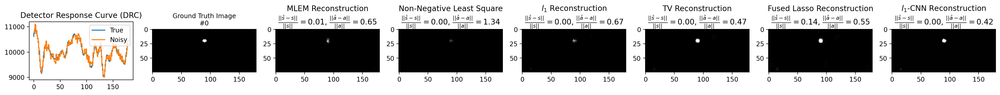

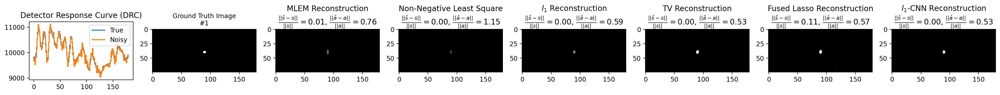

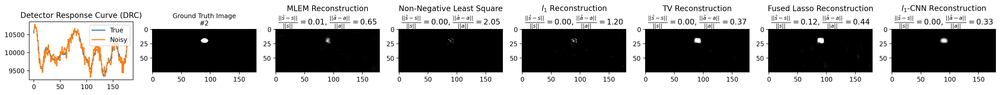

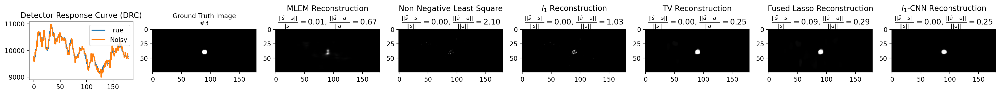

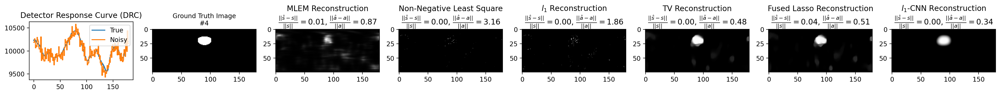

...

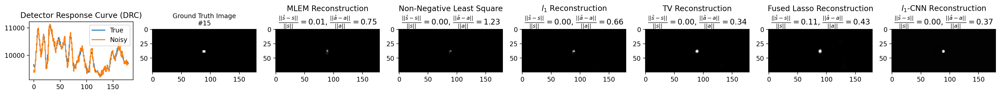

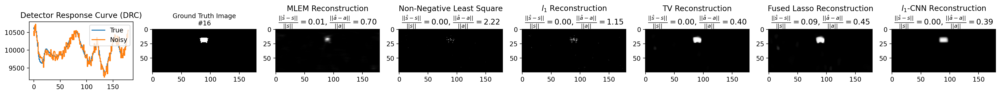

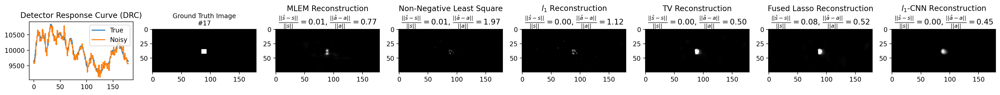

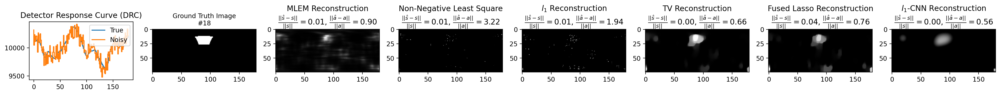

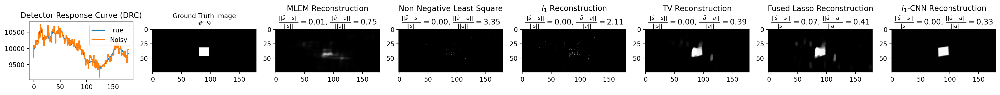

In [14]:
# change: seed, hyper-parameter, denoising cnn
np.random.seed(0)

# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================

lambd_mlem = 0
num_itr_mlem = 10000

lambd_lasso = 0.5 # 0.1 for noiseless, 1 for noisy
gamma_lasso = 0
rho_lasso = 1e-3 # 10 or 100
num_itr_lasso = 300 # whatever rho, when num_iter bigger, always converge to the same result; 100 or 200 or 300

lambd_tv = 1 # 0.5 for noiseless, 3 for noisy
gamma_tv = 0
rho_tv = 1e-3 
num_itr_tv = 300

lambd_flas = 0.3 # 0.5 for noiseless, 3 for noisy
gamma_flas = 0.6
rho_flas = 1e-3 
num_itr_flas = 300


lambd_lascnn = 0.36 # 172
gamma_lascnn = 0.23 # used here! for CNN penalty 142
rho_lascnn = 0
num_itr_lascnn = 300




# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_mlem = []
recovery_errors_mlem = []
ssim_errors_mlem = []
a_est_mlem_all = []

data_fit_errors_nnls = []
recovery_errors_nnls = []
ssim_errors_nnls = []
a_est_nnls_all = []

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_tv = []
recovery_errors_tv = []
ssim_errors_tv = []
a_est_tv_all = []

data_fit_errors_flas = []
recovery_errors_flas = []
ssim_errors_flas = []
a_est_flas_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []


plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
# model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray_trans_1.pth"), strict=True) # model after transfer learning
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)


    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)

    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        x = xi_scale
        a = ai_scale
        DRM = DRM_origin
        Phi = Phi_origin


    # add noise 
    noise_std = np.sqrt(meanCounts)
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise

    # x_noisy = x # set noiseless


    # SNR
    snr = SNR(x, meanCounts)
    print("Test #", i, ", with SNR = ", snr, "dB")

    # Plotting
    fig, ax = plt.subplots(nrows=1, ncols=8, gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 1, 1, 1]},  figsize=(22, 2.5))
    (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8) = ax[0], ax[1], ax[2], ax[3], ax[4], ax[5], ax[6], ax[7]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legend = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)' )
    ax1.set_box_aspect(9/16)


    # Start testing    

    # mlem
    a_est_mlem = MLEM_mrp_fft(a=np.ones(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_mlem, niter=num_itr_mlem, m=m, n=n)

    data_fit_err_mlem = LA.norm(x - Phi @ a_est_mlem)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_mlem = LA.norm(a - a_est_mlem)/LA.norm(a)
    ssim_err_mlem = ssim(np.reshape(a, (m,n)), np.reshape(a_est_mlem, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_mlem.append(data_fit_err_mlem)
    recovery_errors_mlem.append(recovery_err_mlem)
    ssim_errors_mlem.append(ssim_err_mlem)

    # non-neg. least square
    a_est_nnls, _ = sp.optimize.nnls(Phi, x_noisy)
    data_fit_err_nnls = LA.norm(x - Phi @ a_est_nnls)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_nnls = LA.norm(a - a_est_nnls)/LA.norm(a)
    ssim_err_nnls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_nnls, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_nnls.append(data_fit_err_nnls)
    recovery_errors_nnls.append(recovery_err_nnls)
    ssim_errors_nnls.append(ssim_err_nnls)

    # lasso
    a_est_lasso, _ = ADMM_plas_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_lasso, gamma=gamma_lasso, rho=rho_lasso, niter=num_itr_lasso, m=m, n=n)
    # a_est_lasso = np.clip(a_est_lasso, 0, np.inf)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_lasso)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_lasso)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_lasso, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)


    # tv
    a_est_tv, _ = ADMM_ptv_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_tv, gamma=gamma_tv, rho=rho_tv, niter=num_itr_tv, m=m, n=n) # ptv performs much better than tv
    # a_est_tv = np.clip(a_est_tv, 0, np.inf)

    data_fit_err_tv = LA.norm(x - Phi @ a_est_tv)/LA.norm(x)
    recovery_err_tv = LA.norm(a - a_est_tv)/LA.norm(a)
    ssim_err_tv = ssim(np.reshape(a, (m,n)), np.reshape(a_est_tv, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_tv.append(data_fit_err_tv)
    recovery_errors_tv.append(recovery_err_tv)
    ssim_errors_tv.append(ssim_err_tv)


    # fused lasso
    a_est_flas, _ = ADMM_flas_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_flas, gamma=gamma_flas, rho=rho_flas, niter=num_itr_flas, m=m, n=n)
    a_est_flas = np.clip(a_est_flas, 0, np.inf)

    data_fit_err_flas = LA.norm(x - Phi @ a_est_flas)/LA.norm(x)
    recovery_err_flas = LA.norm(a - a_est_flas)/LA.norm(a)
    ssim_err_flas = ssim(np.reshape(a, (m,n)), np.reshape(a_est_flas, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_flas.append(data_fit_err_flas)
    recovery_errors_flas.append(recovery_err_flas)
    ssim_errors_flas.append(ssim_err_flas)


    # l1-CNN
    a_est_pnp, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_lascnn, gamma=gamma_lascnn, rho=rho_lascnn, niter=num_itr_lascnn, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas


    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)



    # Plotting

    a_img = ax2.imshow(np.reshape(a, (m,n)))
    ax2.set_title(r'Ground Truth Image'+ "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax3.imshow(np.reshape(a_est_mlem, (m,n)))
    ax3.set_title(r"MLEM Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_mlem:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_mlem:.2f}}}$')

    a_img = ax4.imshow(np.reshape(a_est_nnls, (m,n)))
    ax4.set_title(r"Non-Negative Least Square" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_nnls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_nnls:.2f}}}$')

    a_img = ax5.imshow(np.reshape(a_est_lasso, (m,n)))
    ax5.set_title(r"$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$')

    a_img = ax6.imshow(np.reshape(a_est_tv, (m,n)))
    ax6.set_title(r"TV Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_tv:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_tv:.2f}}}$')

    a_img = ax7.imshow(np.reshape(a_est_flas, (m,n)))
    ax7.set_title(r"Fused Lasso Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_flas:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_flas:.2f}}}$')

    a_img = ax8.imshow(np.reshape(a_est_pnp, (m,n)))
    ax8.set_title(r"$l_1$-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$')

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

    plt.savefig('Figure/rsm_baseline_result_all_' + str(i) + '.pdf')  

print(" ---------------------- Summary ------------------------------")
print("average NRMSE of MLEM is", np.mean(recovery_errors_mlem))
print("average NRMSE of Non.neg Least Square is", np.mean(recovery_errors_nnls))
print("average NRMSE of l1 is", np.mean(recovery_errors_ls))
print("average NRMSE of TV is", np.mean(recovery_errors_tv))
print("average NRMSE of Fused Lasso is", np.mean(recovery_errors_flas))
print("average NRMSE of l1-CNN is", np.mean(recovery_errors_pnp))
print()
print("average SSIM of MLEM is", np.mean(ssim_errors_mlem))
print("average SSIM of Non.neg Least Square is", np.mean(ssim_errors_nnls))
print("average SSIM of l1 is", np.mean(ssim_errors_ls))
print("average SSIM of TV is", np.mean(ssim_errors_tv))
print("average SSIM of Fused Lasso is", np.mean(ssim_errors_flas))
print("average SSIM of l1-CNN is", np.mean(ssim_errors_pnp))

In [15]:
data_fit_err_nnls

0.0035042957708131322

#### Count DRC: Lasso vs. PnP-Lasso

Test # 0 , with SNR =  11.611192872241816 dB
Test # 1 , with SNR =  13.060819778171455 dB
Test # 2 , with SNR =  9.895305988825262 dB
Test # 3 , with SNR =  12.406327746649808 dB
Test # 4 , with SNR =  6.058438097157849 dB
Test # 5 , with SNR =  11.396986603900793 dB
Test # 6 , with SNR =  11.3419627525458 dB
Test # 7 , with SNR =  13.017392354543627 dB
Test # 8 , with SNR =  9.01852387174636 dB
Test # 9 , with SNR =  12.297214276656419 dB
Test # 10 , with SNR =  4.729416199127502 dB
Test # 11 , with SNR =  11.056165134223745 dB
Test # 12 , with SNR =  13.124397149559787 dB
Test # 13 , with SNR =  13.657235790809901 dB
Test # 14 , with SNR =  11.276074991079481 dB
Test # 15 , with SNR =  12.854751968557192 dB
Test # 16 , with SNR =  9.174137269351503 dB
Test # 17 , with SNR =  11.825057961066971 dB
Test # 18 , with SNR =  4.843513418748327 dB
Test # 19 , with SNR =  10.780909371332525 dB


C:\Users\22057\AppData\Local\Temp\ipykernel_17292\2364279571.py:139: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=2, ncols=2)


 ---------------------- Summary ------------------------------
average NRMSE of l1 is 1.3062829094360988
average NRMSE of l1-CNN is 0.5539686355412784

average SSIM of l1 is 0.9055865056874847
average SSIM of l1-CNN is 0.9823058712206587


<Figure size 432x288 with 0 Axes>

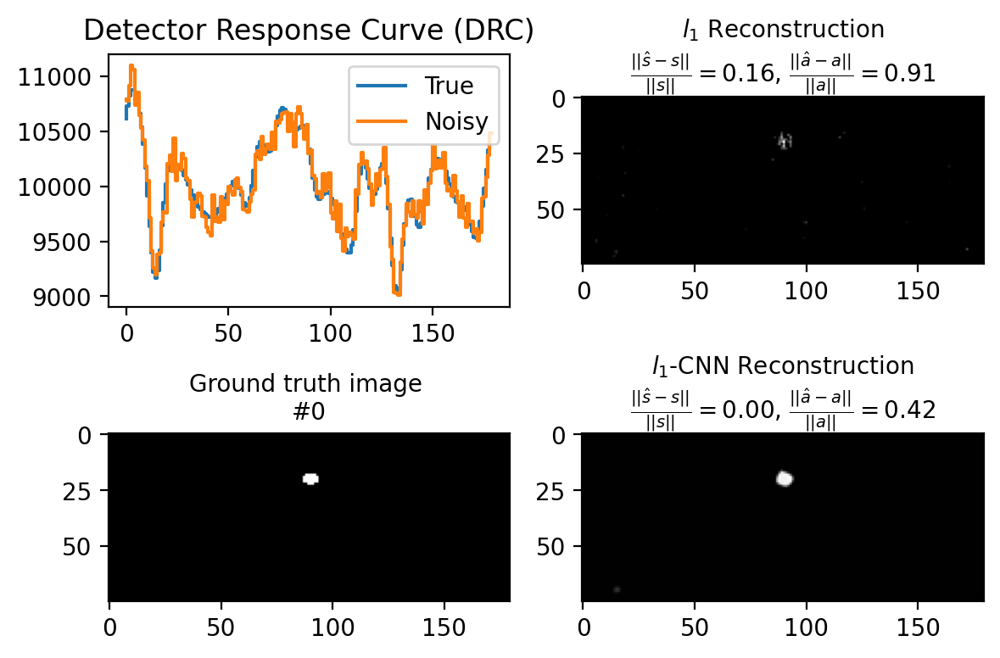

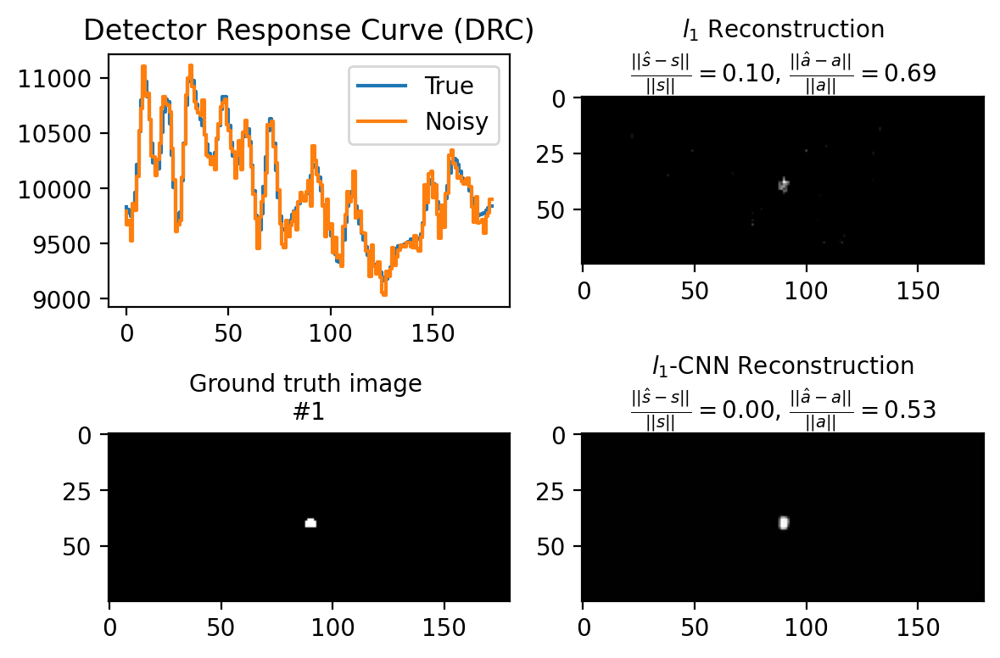

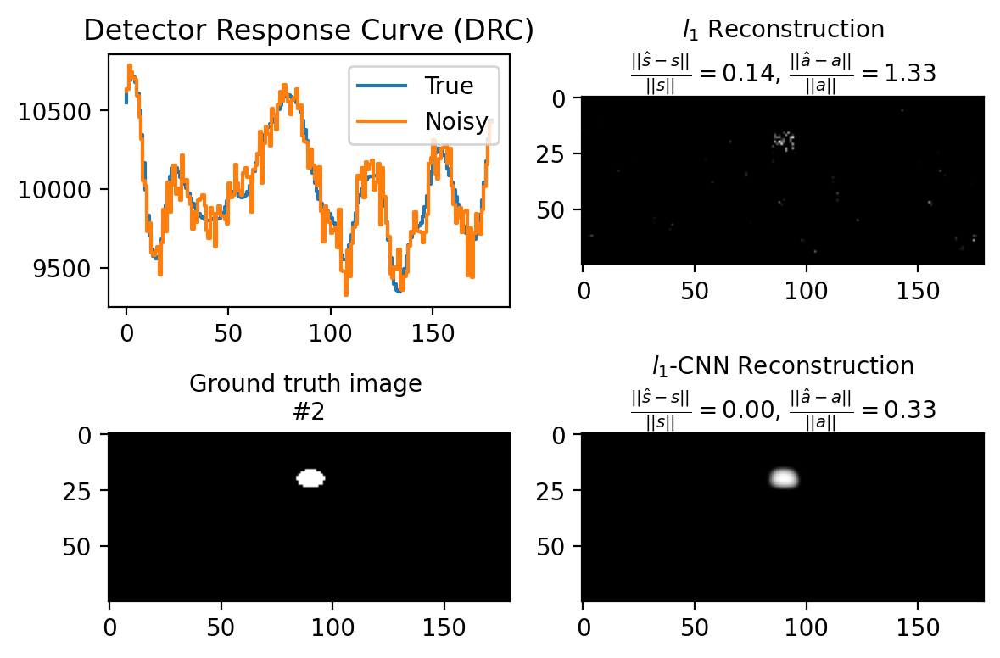

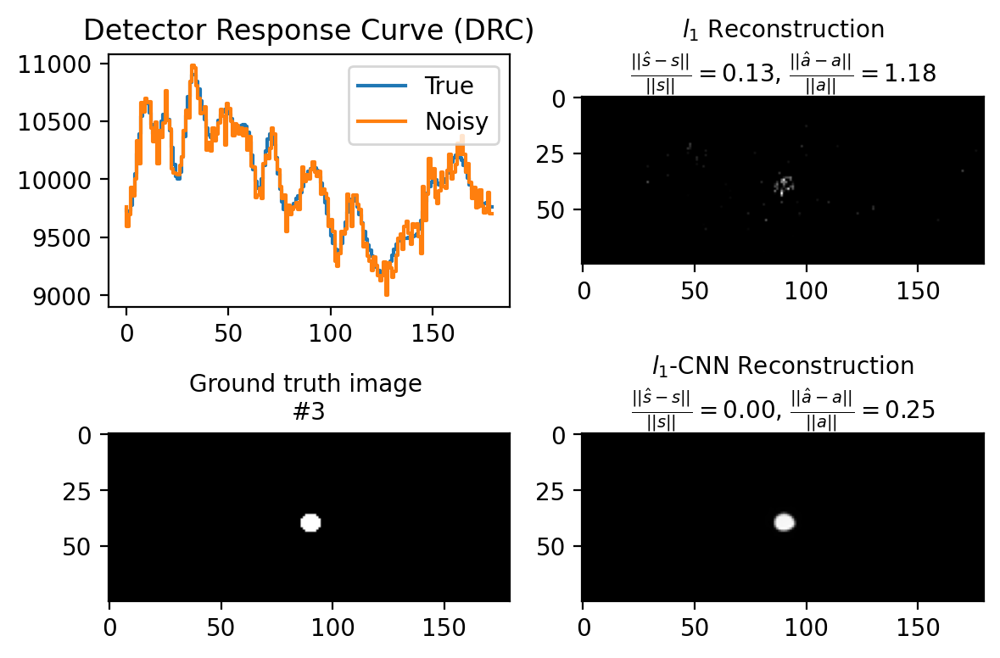

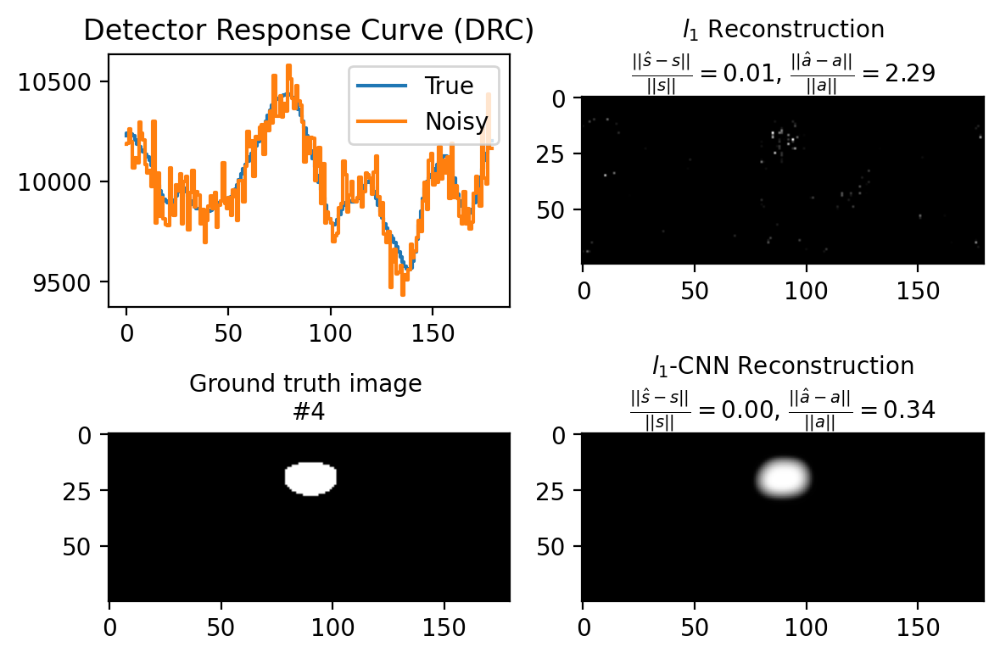

...

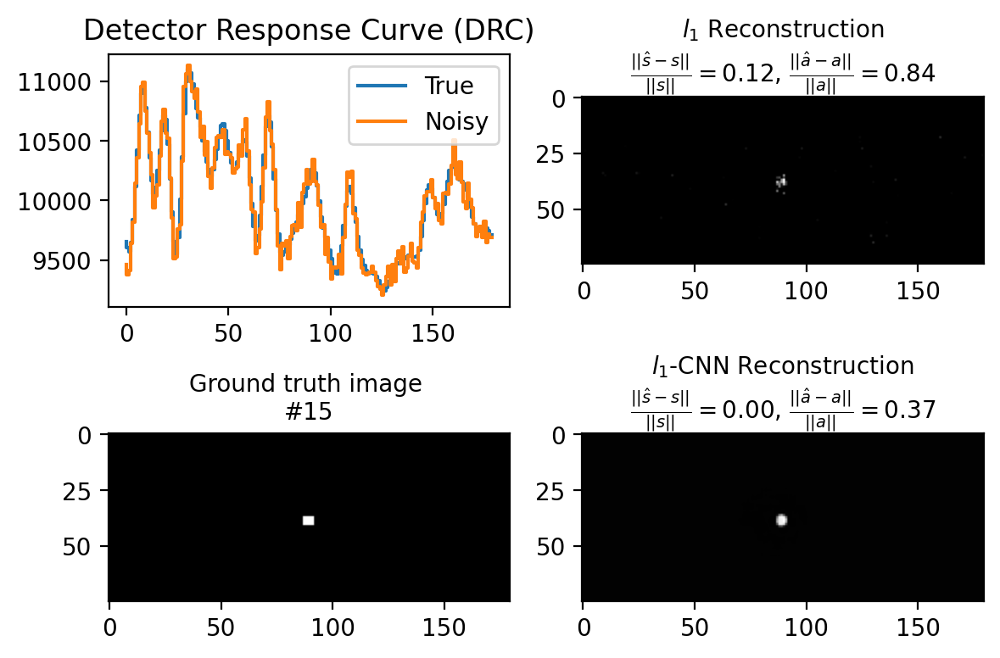

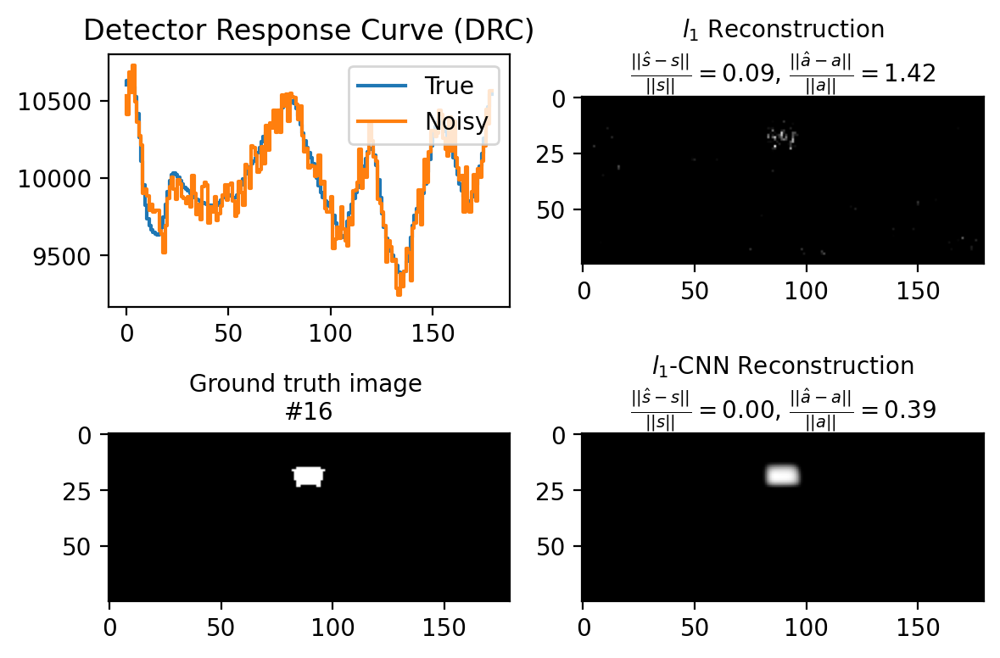

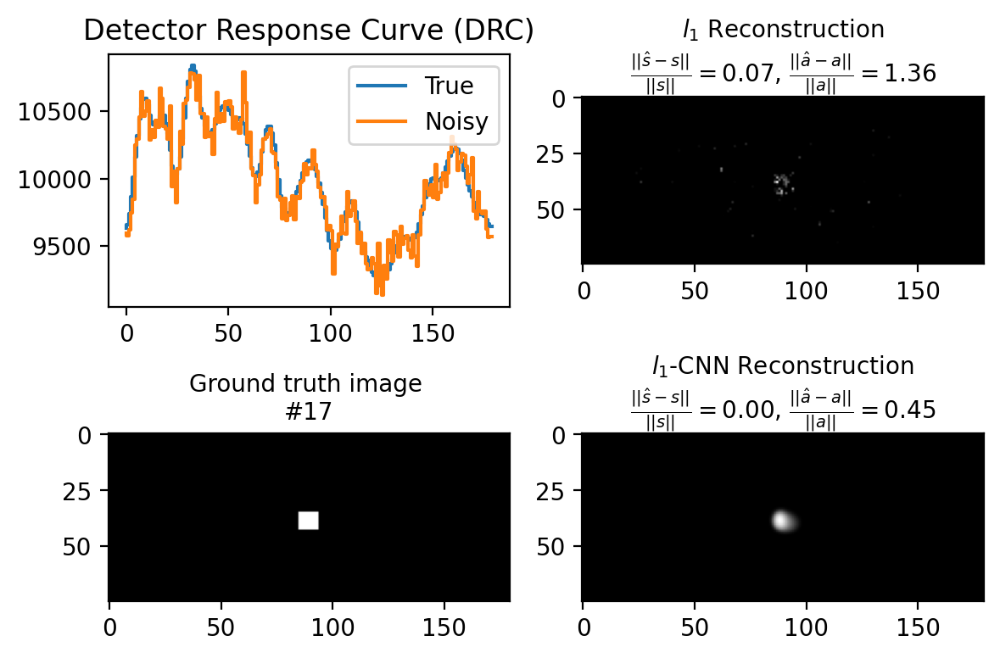

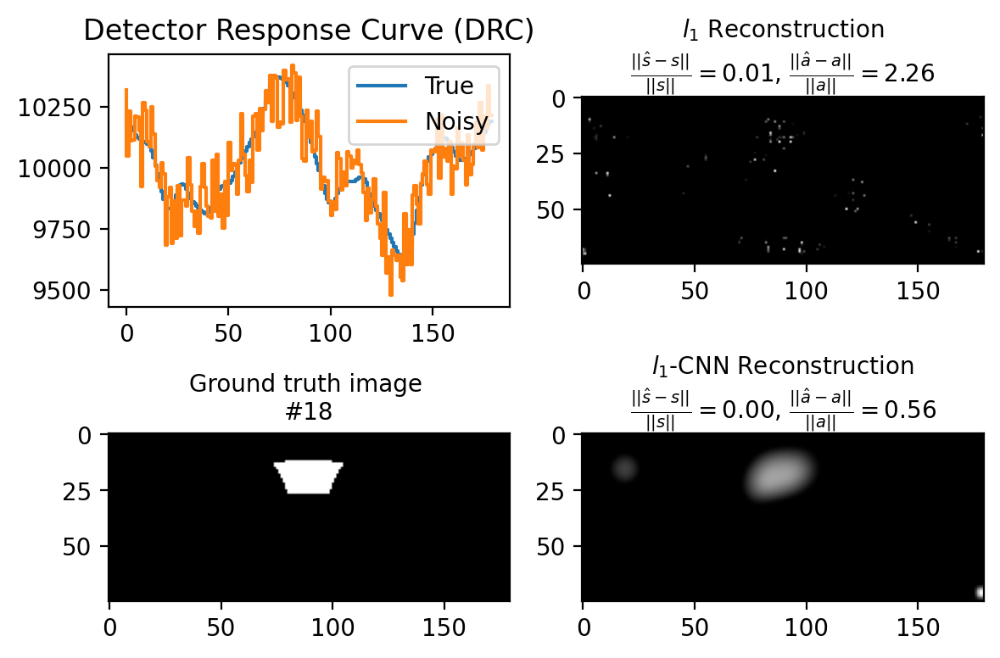

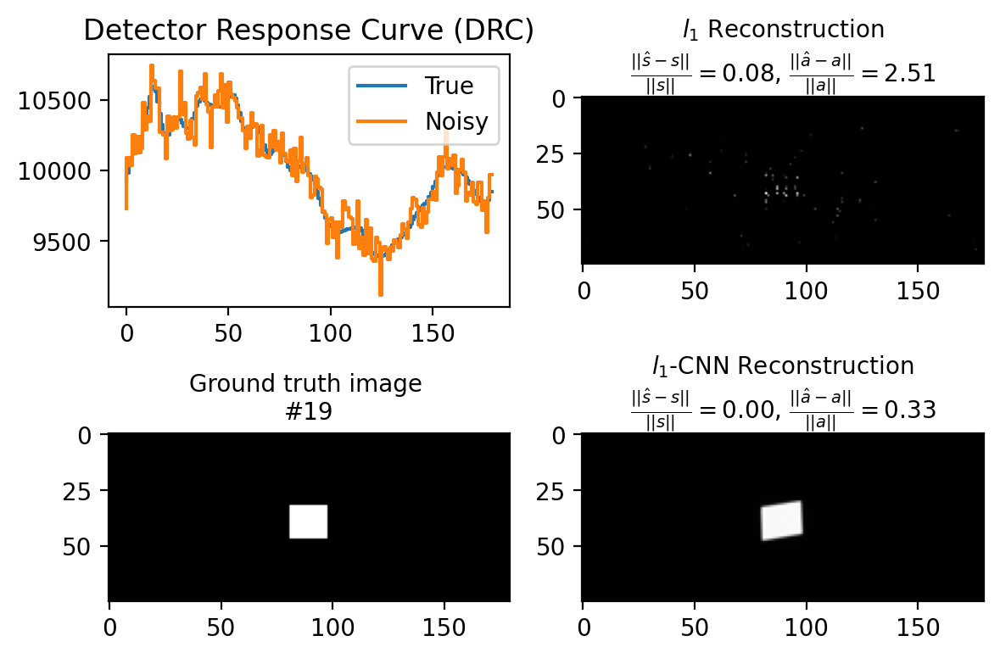

In [56]:
# change: seed, hyper-parameter, denoising cnn
np.random.seed(0)

# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================
lambd_val = 0.36 # 172
gamma_val = 0.23 # used here! for CNN penalty 142
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result; 100 or 200 or 300


lambd_lasso = 0.5
gamma_lasso = 0
rho_val = 1e-3 # 10 or 100

# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []


plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
# model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray_trans_1.pth"), strict=True) # model after transfer learning
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)


    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        x = xi_scale
        a = ai_scale
        DRM = DRM_origin
        Phi = Phi_origin


    # add noise 
    noise_std = np.sqrt(meanCounts)
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    # x_noisy = np.random.poisson(x) # poisson noise


    # SNR
    snr = SNR(x, meanCounts)
    print("Test #", i, ", with SNR = ", snr, "dB")

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')


    # Start testing    

    # lasso
    a_est_lasso, _ = ADMM_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_lasso, gamma=gamma_lasso, rho=rho_val, niter=num_itr, m=m, n=n)

    # a_est_lasso = a_est_lasso / circ_col_norm(DRM)
    a_est_lasso = np.clip(a_est_lasso, 0, np.inf)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_lasso)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_lasso)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_lasso, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)

    
    start_time = time.time()

    a_est_pnp, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas


    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax3.imshow(np.reshape(a, (m,n)))
    # ax3.set_title(r'Ground truth image', size = 10)
    ax3.set_title(r'Ground truth image ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_lasso, (m,n)))
    ax2.set_title(r"$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"$l_1$-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

print(" ---------------------- Summary ------------------------------")
print("average NRMSE of l1 is", np.mean(recovery_errors_ls))
print("average NRMSE of l1-CNN is", np.mean(recovery_errors_pnp))
print()
print("average SSIM of l1 is", np.mean(ssim_errors_ls))
print("average SSIM of l1-CNN is", np.mean(ssim_errors_pnp))

Test # 3 , with SNR =  12.406327746649808 dB
Test # 11 , with SNR =  11.056165134223745 dB
Test # 16 , with SNR =  9.174137269351503 dB
Test # 19 , with SNR =  10.780909371332525 dB


<Figure size 432x288 with 0 Axes>

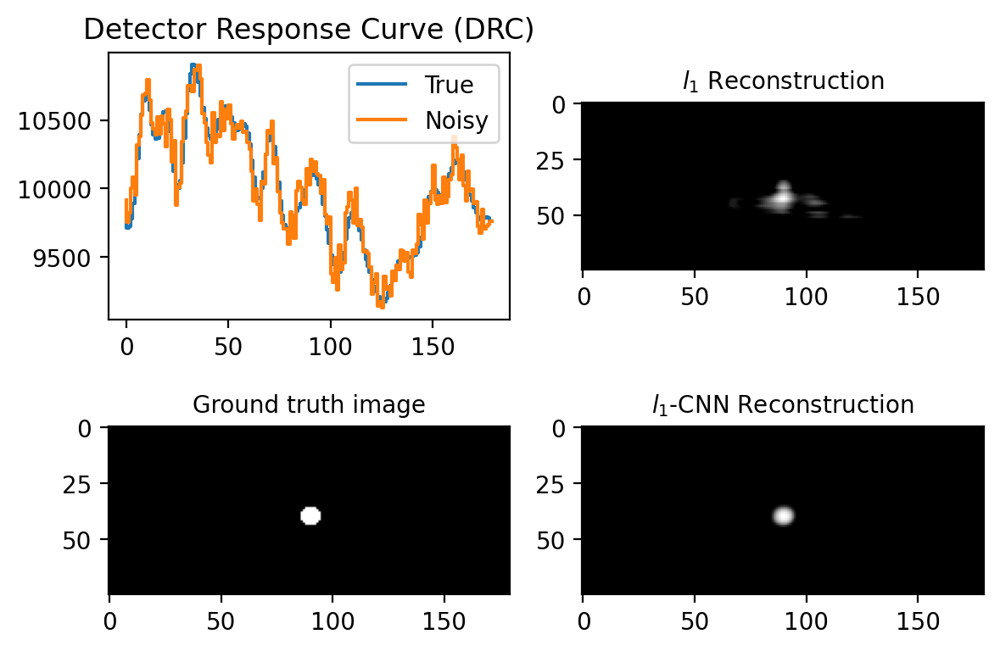

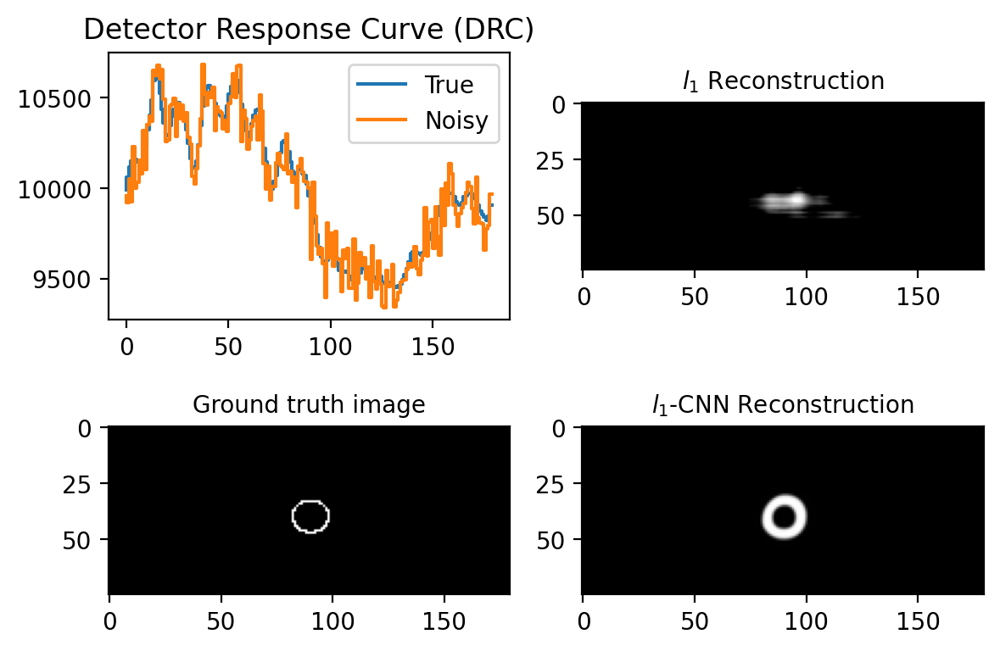

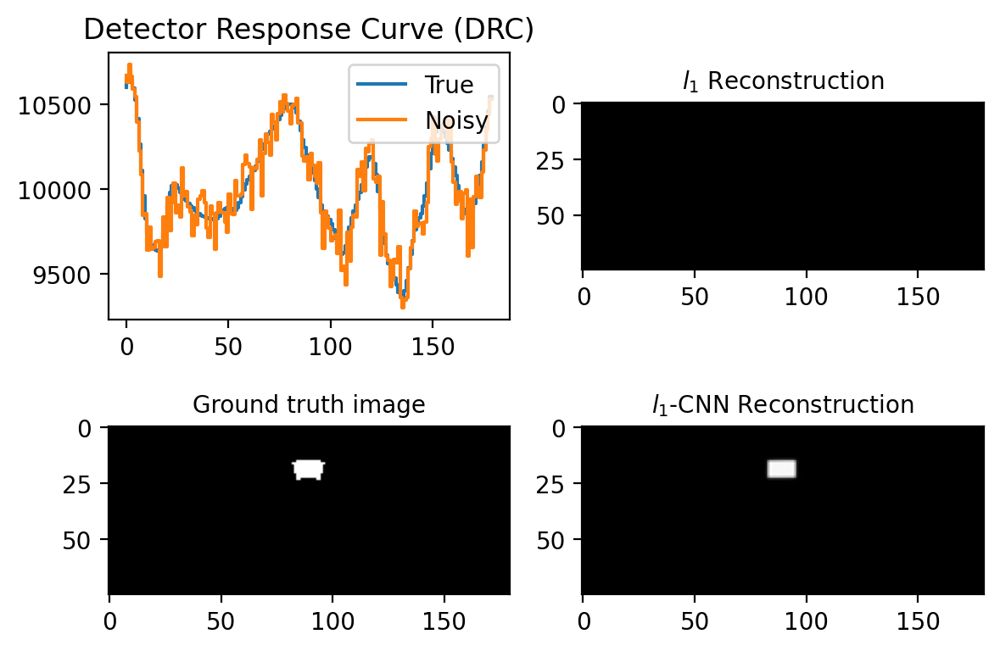

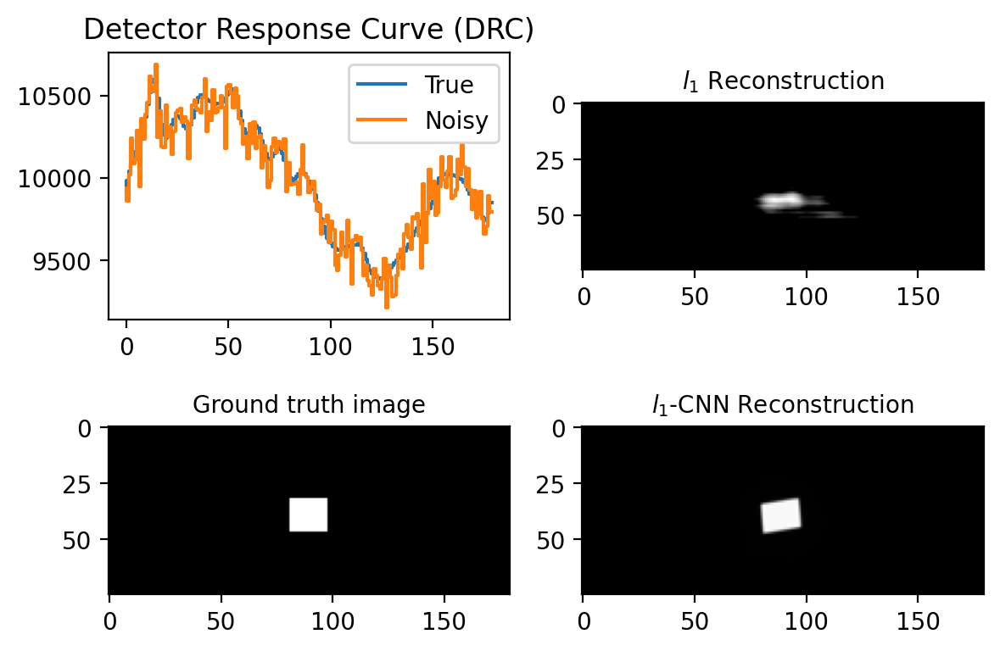

In [12]:
# plot a subset of testing cases

np.random.seed(0)  # try different random seeds

noise_percent = 1
# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================
lambd_val = 0.36 # 172
gamma_val = 0.28 # used here! for CNN penalty 142
num_itr = 100 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 10 # 10 or 100

lambd_lasso = 30
gamma_lasso = 0


# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []


plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
# model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray_trans_1.pth"), strict=True) # model after transfer learning
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in [3, 11, 16, 19]: # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)


    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm  
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # no processing at all
        x = xi_scale
        a = ai_scale
        DRM = DRM_origin
        Phi = Phi_origin

        # # zero mean
        # x = xi_scale 
        # a = ai_scale 
        # DRM = DRM_zeroMean
        # Phi = Phi_zeroMean

    # add noise and de-meaning    
    noise_std = np.sqrt(meanCounts*noise_percent)
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    # x_noisy = np.random.poisson(x) # poisson noise


    # SNR
    snr = SNR(x, meanCounts)
    print("Test #", i, ", with SNR = ", snr, "dB")

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')

    # subtract mean
    x = x - np.mean(x) 
    x_noisy = x_noisy - np.mean(x_noisy)


    # Start testing    

    # lasso
    a_est_lasso, _ = ADMM_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_lasso, gamma=gamma_lasso, rho=rho_val, niter=200, m=m, n=n)

    # a_est_lasso = a_est_lasso / circ_col_norm(DRM)
    a_est_lasso = np.clip(a_est_lasso, 0, np.inf)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_lasso)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_lasso)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_lasso, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)

    
    start_time = time.time()

    a_est_pnp, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est_pnp = a_est_pnp / circ_col_norm(DRM)

    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax3.imshow(np.reshape(a, (m,n)))
    ax3.set_title(r'Ground truth image', size = 10)
    # ax3.set_title(r'Ground truth activation ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_lasso, (m,n)))
    ax2.set_title(r"$l_1$ Reconstruction", size = 10)
    # ax2.set_title(r"$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"$l_1$-CNN Reconstruction", size = 10)
    # ax4.set_title(r"$l_1$-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

Test # 11 , with SNR =  11.056165134223745 dB


<Figure size 432x288 with 0 Axes>

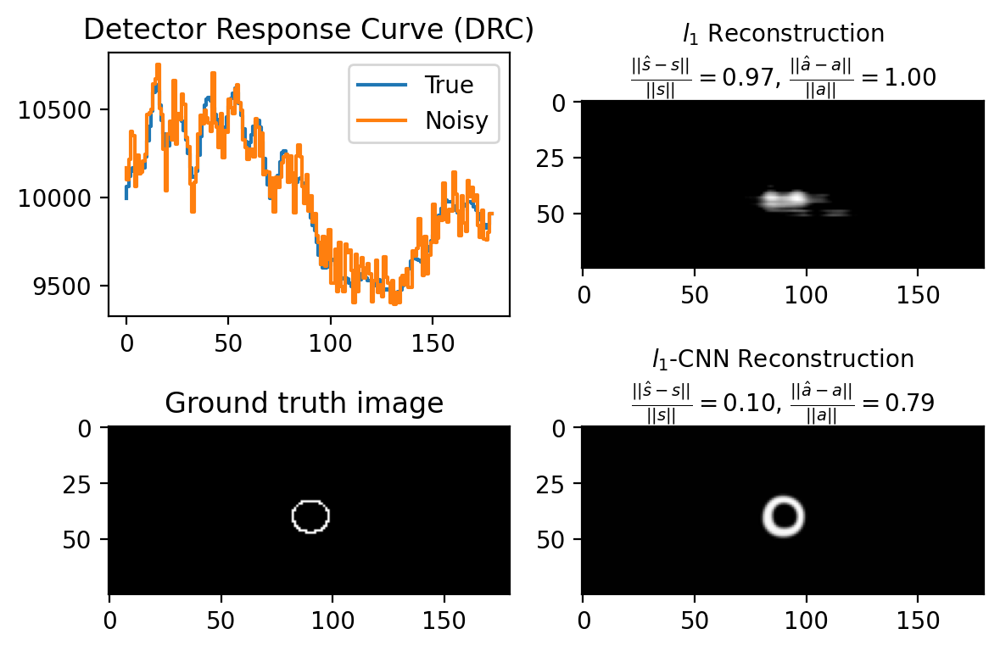

In [12]:
# plot one test case, for presentation, poster, etc

np.random.seed(0)  # try different random seeds

noise_percent = 1
# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================
lambd_val = 0.36 # 172
gamma_val = 0.28 # used here! for CNN penalty 142
num_itr = 100 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 10 # 10 or 100

lambd_lasso = 30
gamma_lasso = 0


# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []


plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in [11]: # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)


    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        # x = x0_scale
        # a = a0_scale
        # DRM = DRM_origin
        # Phi = Phi_origin

        # zero mean
        x = xi_scale 
        a = ai_scale 
        DRM = DRM_zeroMean
        Phi = Phi_zeroMean

    # add noise and de-meaning    
    noise_std = np.sqrt(meanCounts*noise_percent)
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    # x_noisy = np.random.poisson(x) # poisson noise


    # SNR
    snr = SNR(x, meanCounts)
    print("Test #", i, ", with SNR = ", snr, "dB")

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')

    # subtract mean
    x = x - np.mean(x) 
    x_noisy = x_noisy - np.mean(x_noisy)


    # Start testing    

    # lasso
    a_est_lasso, _ = ADMM_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_lasso, gamma=gamma_lasso, rho=rho_val, niter=num_itr, m=m, n=n)

    # a_est_lasso = a_est_lasso / circ_col_norm(DRM)
    a_est_lasso = np.clip(a_est_lasso, 0, np.inf)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_lasso)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_lasso)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_lasso, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)

    
    start_time = time.time()

    a_est_pnp, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est_pnp = a_est_pnp / circ_col_norm(DRM)

    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax3.imshow(np.reshape(a, (m,n)))
    # ax3.set_title(r'Ground truth image', size = 10)
    ax3.set_title(r'Ground truth image ')
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_lasso, (m,n)))
    ax2.set_title(r"$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"$l_1$-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

#### Count DRC: MLEM-MRP vs PnP-Lasso

Test # 0 , with SNR =  11.611192872241816 dB
Test # 1 , with SNR =  13.060819778171455 dB
Test # 2 , with SNR =  9.895305988825262 dB
Test # 3 , with SNR =  12.406327746649808 dB
Test # 4 , with SNR =  6.058438097157849 dB
Test # 5 , with SNR =  11.396986603900793 dB
Test # 6 , with SNR =  11.3419627525458 dB
Test # 7 , with SNR =  13.017392354543627 dB
Test # 8 , with SNR =  9.01852387174636 dB
Test # 9 , with SNR =  12.297214276656419 dB
Test # 10 , with SNR =  4.729416199127502 dB
Test # 11 , with SNR =  11.056165134223745 dB
Test # 12 , with SNR =  13.124397149559787 dB
Test # 13 , with SNR =  13.657235790809901 dB
Test # 14 , with SNR =  11.276074991079481 dB
Test # 15 , with SNR =  12.854751968557192 dB
Test # 16 , with SNR =  9.174137269351503 dB
Test # 17 , with SNR =  11.825057961066971 dB
Test # 18 , with SNR =  4.843513418748327 dB
Test # 19 , with SNR =  10.780909371332525 dB


C:\Users\22057\AppData\Local\Temp\ipykernel_16096\1918593327.py:141: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=2, ncols=2)


 ---------------------- Summary ------------------------------
average NRMSE of MLEM is 0.7941817970280991
average NRMSE of l1-CNN is 0.5539686355412784

average SSIM of MLEM is 0.8655258108842299
average SSIM of l1-CNN is 0.9823058712206587


<Figure size 432x288 with 0 Axes>

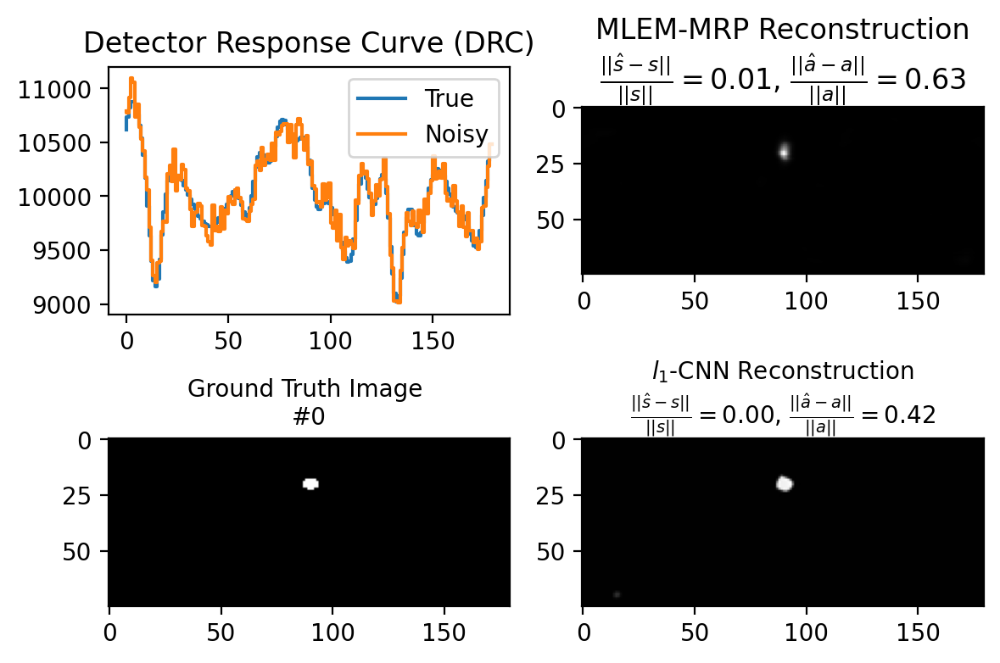

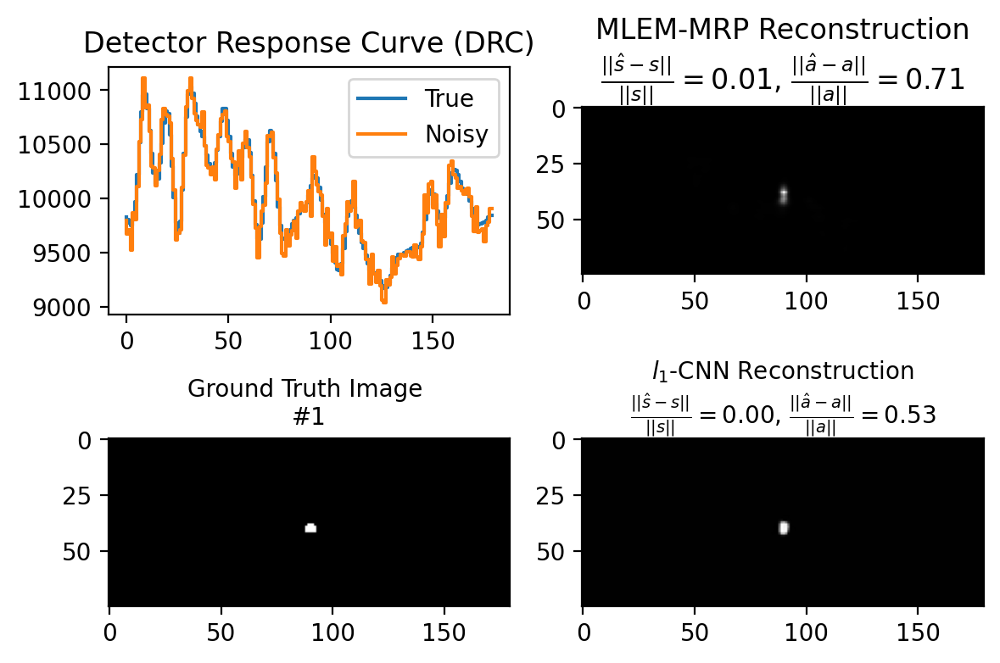

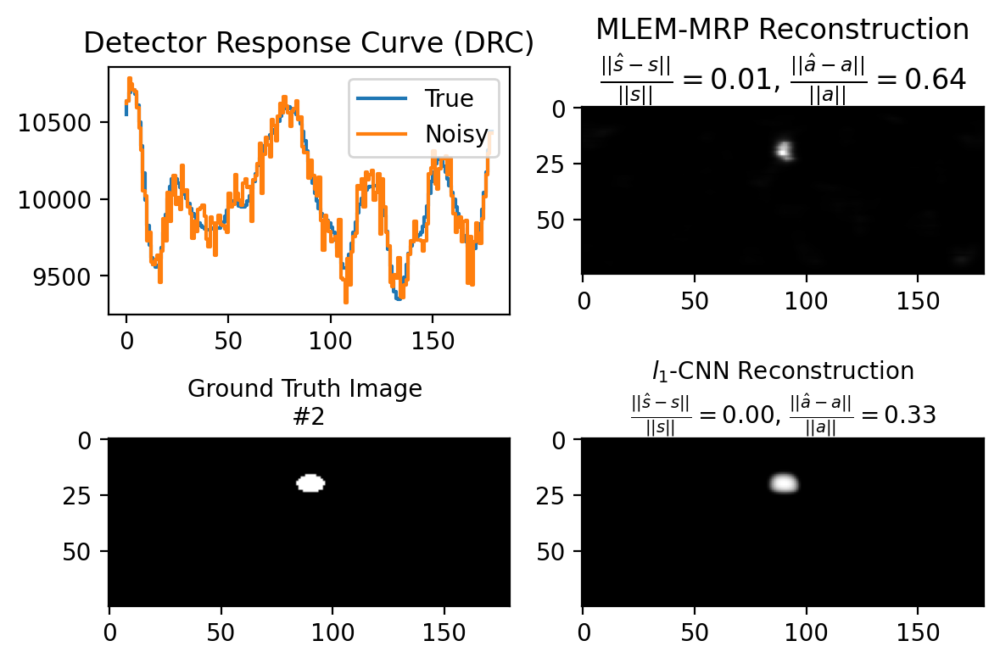

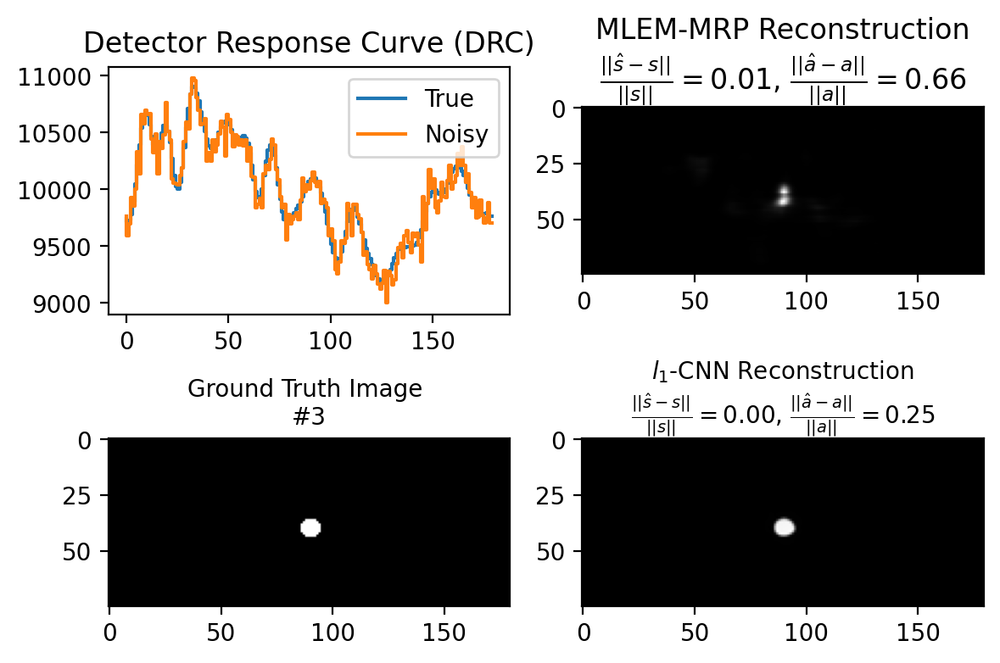

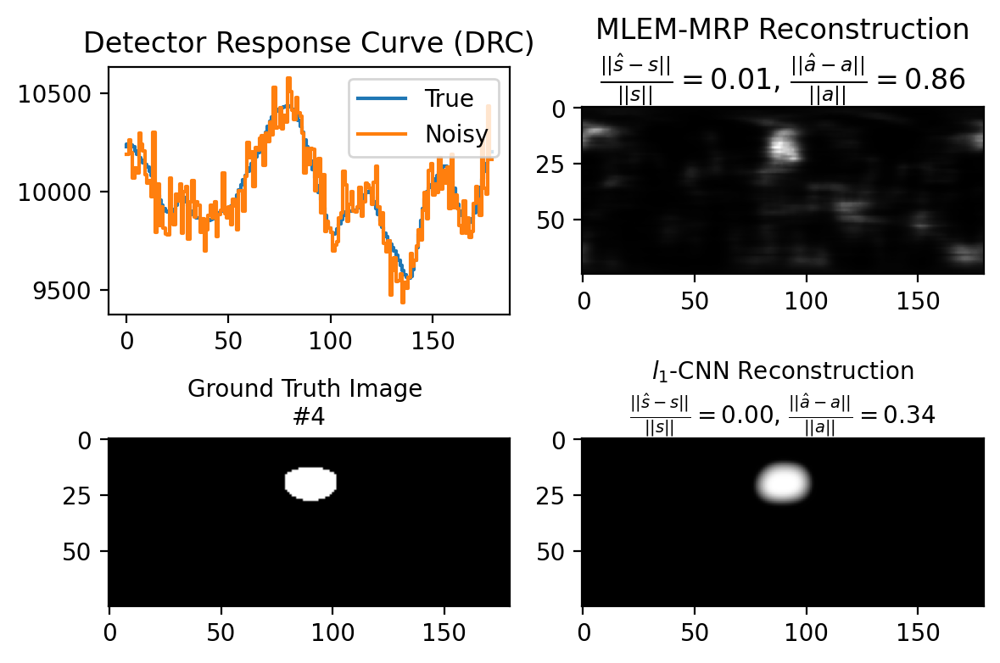

...

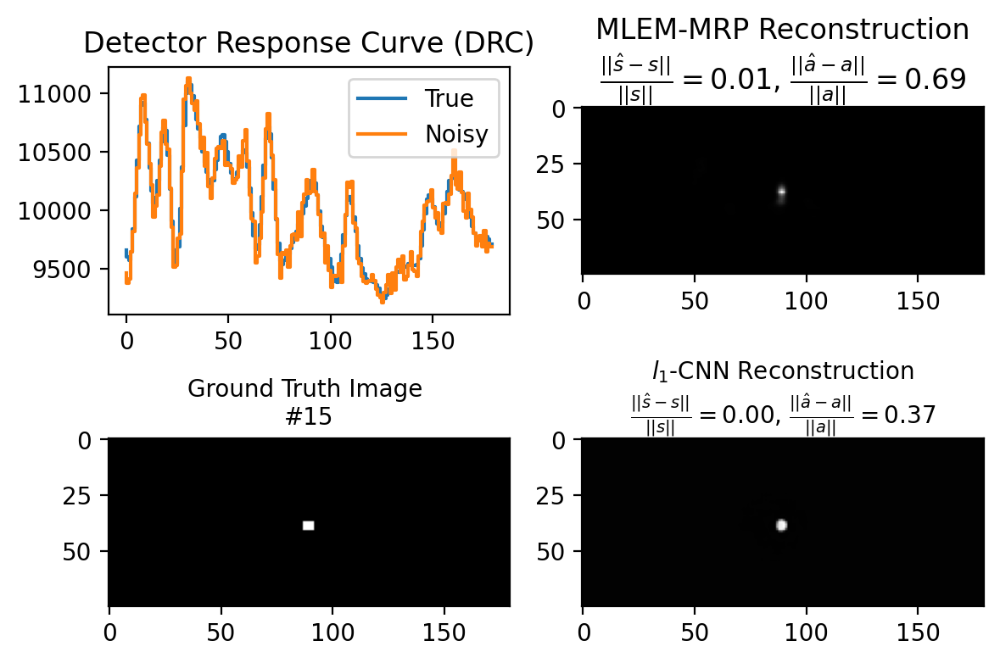

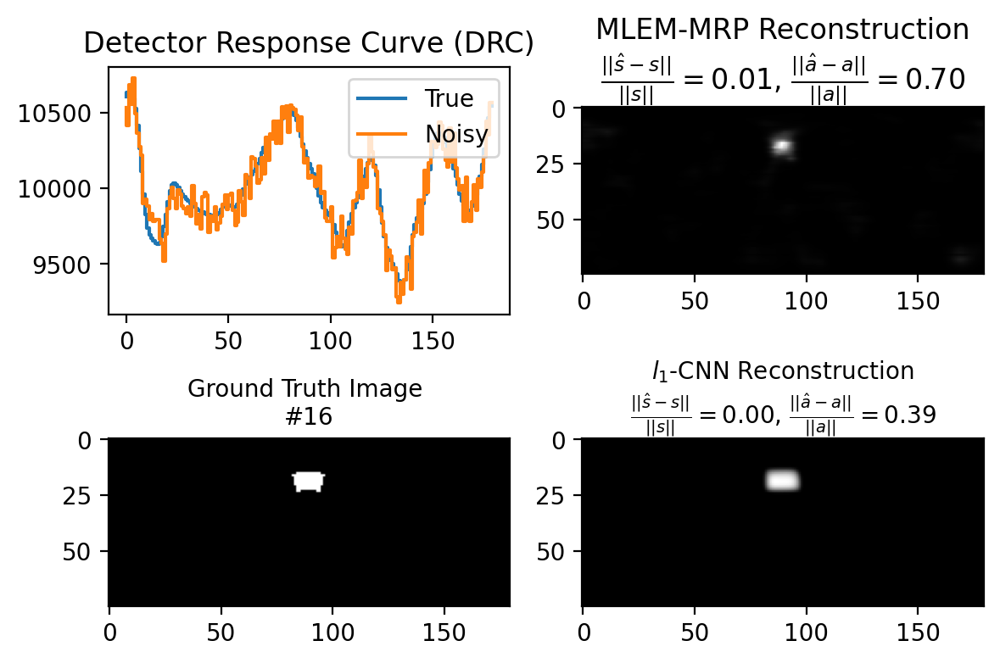

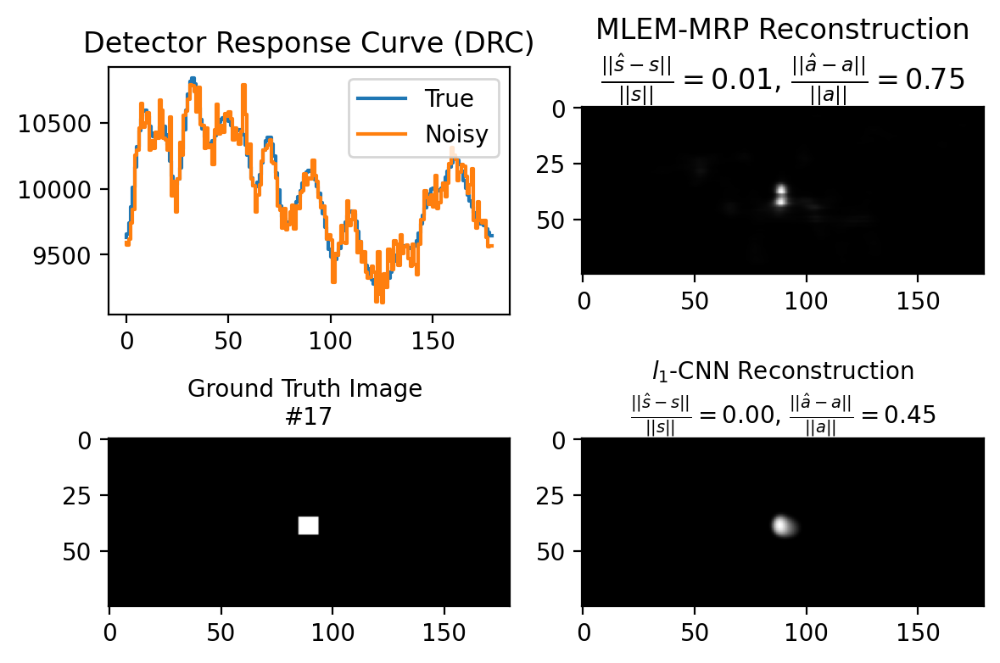

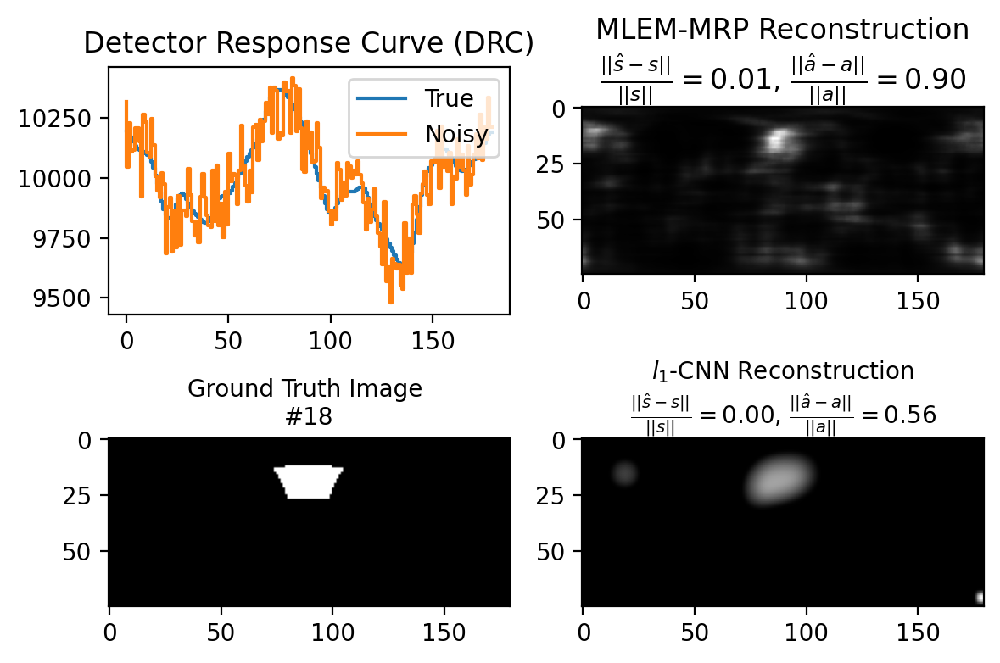

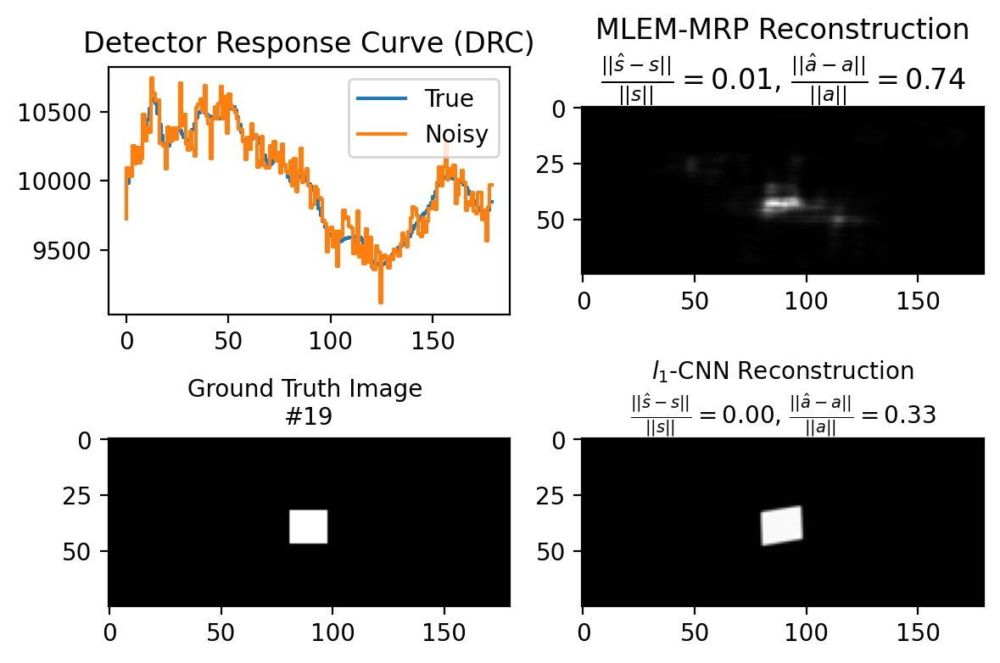

In [16]:
# change: seed, hyper-parameter, denoising cnn
np.random.seed(0)

# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================
lambd_mlem = 1e-4
num_itr_mlem = 10000
rho_val = 0 # not used

lambd_val = 0.36 # 172
gamma_val = 0.23 # used here! for CNN penalty 142
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result; 100 or 200 or 300




# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_mlem = []
recovery_errors_mlem = []
ssim_errors_mlem = []
a_est_mlem_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []


plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
# model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray_trans_1.pth"), strict=True) # model after transfer learning
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)


    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        x = xi_scale
        a = ai_scale
        DRM = DRM_origin
        Phi = Phi_origin


    # add noise 
    noise_std = np.sqrt(meanCounts)
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    # x_noisy = np.random.poisson(x) # poisson noise


    # SNR
    snr = SNR(x, meanCounts)
    print("Test #", i, ", with SNR = ", snr, "dB")

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')


    # Start testing    

    # mlem
    a_est_mlem = MLEM_mrp_fft(a=np.ones(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_mlem, niter=num_itr_mlem, m=m, n=n)

    data_fit_err_mlem = LA.norm(x - Phi @ a_est_mlem)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_mlem = LA.norm(a - a_est_mlem)/LA.norm(a)
    ssim_err_mlem = ssim(np.reshape(a, (m,n)), np.reshape(a_est_mlem, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_mlem.append(data_fit_err_mlem)
    recovery_errors_mlem.append(recovery_err_mlem)
    ssim_errors_mlem.append(ssim_err_mlem)

    
    # l1-CNN

    a_est_pnp, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas


    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax3.imshow(np.reshape(a, (m,n)))
    # ax3.set_title(r'Ground truth image', size = 10)
    ax3.set_title(r'Ground Truth Image ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_mlem, (m,n)))
    ax2.set_title(r"MLEM-MRP Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_mlem:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_mlem:.2f}}}$')

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"$l_1$-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

print(" ---------------------- Summary ------------------------------")
print("average NRMSE of MLEM is", np.mean(recovery_errors_mlem))
print("average NRMSE of l1-CNN is", np.mean(recovery_errors_pnp))
print()
print("average SSIM of MLEM is", np.mean(ssim_errors_mlem))
print("average SSIM of l1-CNN is", np.mean(ssim_errors_pnp))

#### Count DRC: TV vs. PnP-l1-TV

Test # 0 , with SNR =  11.611192872241816 dB


NameError: name 'ADMM_pnp_flas_fft' is not defined

<Figure size 432x288 with 0 Axes>

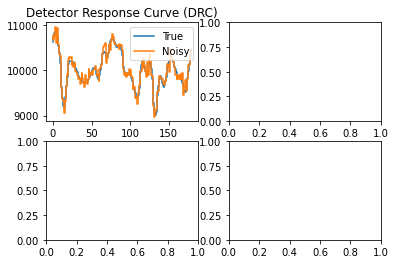

In [9]:
np.random.seed(0)

noise_percent = 1
# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================
lambd_1_val = 0.27 # 0.08
lambd_2_val = 0.21
lambd_3_val = 0.32 # used here! for CNN penalty 0.23
num_itr = 100 # whatever rho, when num_iter bigger, always converge to the same result
rho_val = 1e6 # 10 or 100

lambd_tv = 5
gamma_tv = 0


# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []


plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)


    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        # x = x0_scale
        # a = a0_scale
        # DRM = DRM_origin
        # Phi = Phi_origin

        # zero mean
        x = xi_scale 
        a = ai_scale 
        DRM = DRM_zeroMean
        Phi = Phi_zeroMean

    # add noise and de-meaning    
    noise_std = np.sqrt(meanCounts*noise_percent)
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    # x_noisy = np.random.poisson(x) # poisson noise


    # SNR
    snr = SNR(x, meanCounts)
    print("Test #", i, ", with SNR = ", snr, "dB")

    # Plotting
    fig, ax = plt.subplots(nrows=2, ncols=2)
    (ax1, ax2, ax3, ax4) = ax[0,0], ax[0,1], ax[1,0], ax[1,1]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legned = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)')

    # subtract mean
    x = x - np.mean(x) 
    x_noisy = x_noisy - np.mean(x_noisy)


    # Start testing    

    # lasso
    a_est_lasso, _ = ADMM_tv_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_tv, gamma=gamma_tv, rho=np.mean(LA.norm(DRM, axis=1)), niter=num_itr, m=m, n=n)

    # a_est_lasso = a_est_lasso / circ_col_norm(DRM)
    a_est_lasso = np.clip(a_est_lasso, 0, np.inf)

    data_fit_err_ls = LA.norm(x - Phi @ a_est_lasso)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_lasso)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_lasso, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)

    
    start_time = time.time()

    a_est_pnp, _ = ADMM_pnp_flas_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd_1=lambd_1_val, lambd_2=lambd_2_val, lambd_3=lambd_3_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas

    # a_est_pnp = a_est_pnp / circ_col_norm(DRM)

    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax3.imshow(np.reshape(a, (m,n)))
    # ax3.set_title(r'Ground truth image', size = 10)
    ax3.set_title(r'Ground truth activation ' + "\n" + f'#{i}', size = 10)
    # fig.colorbar(a_img)

    a_img = ax2.imshow(np.reshape(a_est_lasso, (m,n)))
    ax2.set_title(r"$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$', size = 10)

    a_img = ax4.imshow(np.reshape(a_est_pnp, (m,n)))
    ax4.set_title(r"$l_1$-TV-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$', size = 10)

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

#### Count DRC: MLEM-MRP, l1, l1-CNN

Test # 0 , with SNR =  11.611192872241816 dB
Test # 1 , with SNR =  13.060819778171455 dB
Test # 2 , with SNR =  9.895305988825262 dB
Test # 3 , with SNR =  12.406327746649808 dB
Test # 4 , with SNR =  6.058438097157849 dB
Test # 5 , with SNR =  11.396986603900793 dB
Test # 6 , with SNR =  11.3419627525458 dB
Test # 7 , with SNR =  13.017392354543627 dB
Test # 8 , with SNR =  9.01852387174636 dB
Test # 9 , with SNR =  12.297214276656419 dB
Test # 10 , with SNR =  4.729416199127502 dB
Test # 11 , with SNR =  11.056165134223745 dB
Test # 12 , with SNR =  13.124397149559787 dB
Test # 13 , with SNR =  13.657235790809901 dB
Test # 14 , with SNR =  11.276074991079481 dB
Test # 15 , with SNR =  12.854751968557192 dB
Test # 16 , with SNR =  9.174137269351503 dB
Test # 17 , with SNR =  11.825057961066971 dB
Test # 18 , with SNR =  4.843513418748327 dB
Test # 19 , with SNR =  10.780909371332525 dB


C:\Users\22057\AppData\Local\Temp\ipykernel_17292\2513878378.py:150: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=1, ncols=5, gridspec_kw={'width_ratios': [1, 1, 1, 1, 1]},  figsize=(16, 2.5))


 ---------------------- Summary ------------------------------
average NRMSE of MLEM is 0.7941817970280991
average NRMSE of l1 is 1.3062829094360988
average NRMSE of l1-CNN is 0.5539686355412784

average SSIM of MLEM is 0.8655258108842299
average SSIM of l1 is 0.9055865056874847
average SSIM of l1-CNN is 0.9823058712206587


<Figure size 432x288 with 0 Axes>

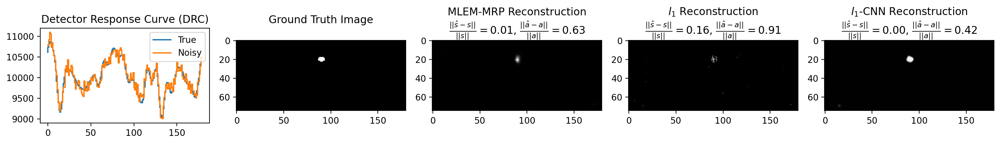

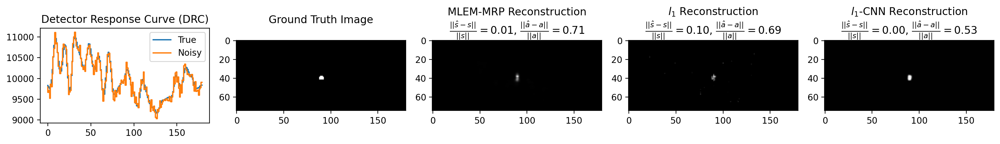

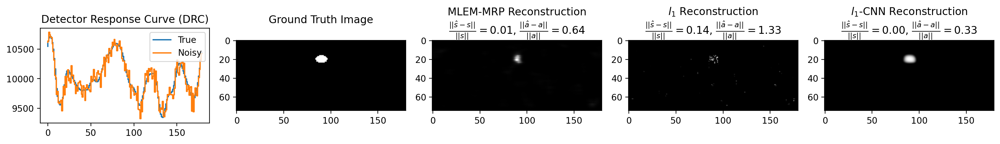

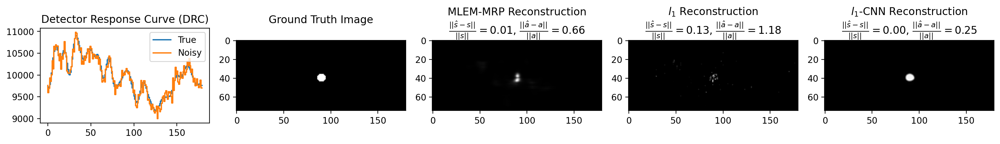

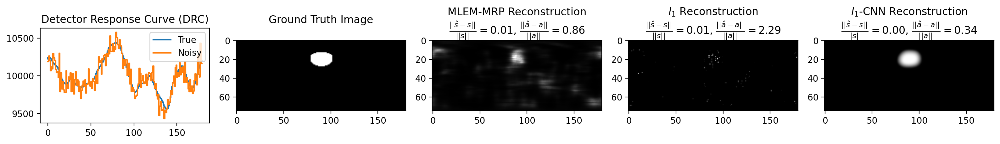

...

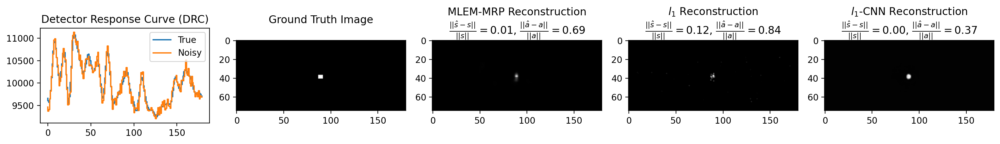

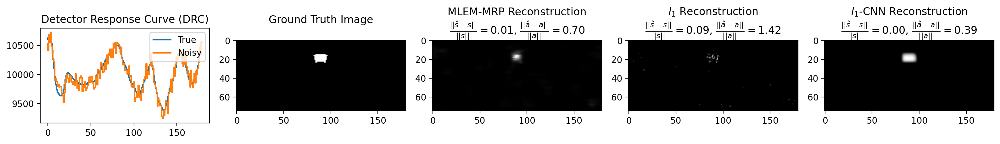

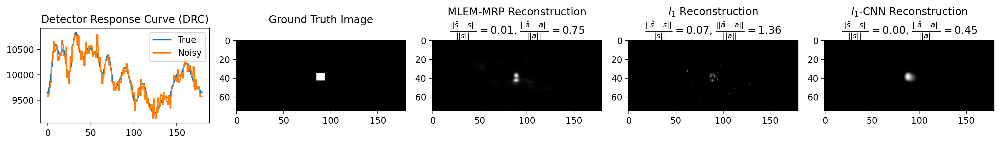

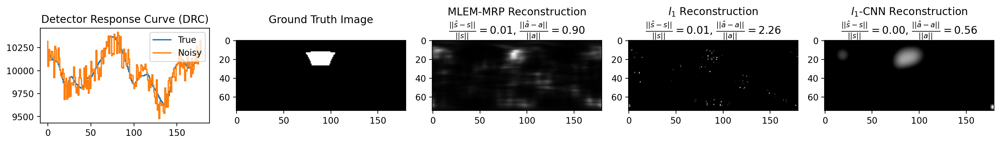

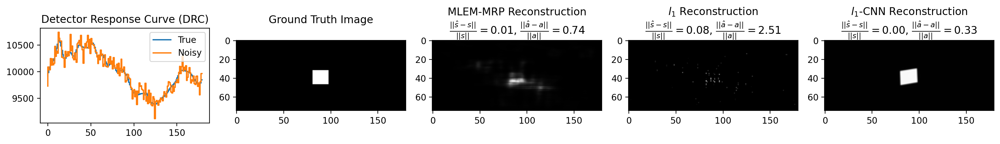

In [73]:
# change: seed, hyper-parameter, denoising cnn
np.random.seed(0)

# PnP - flas
# ===============================================
# choose different parameter combinations:
# v = 0.05, 0.1, 0.2
# rho = 1,10 (for pflas),100
# niter = 12, 20, 50
# (lambd = 0.28, gamma = 0.6, for noiseless)
# ===============================================

lambd_mlem = 1e-4
num_itr_mlem = 10000


lambd_lasso = 0.5
gamma_lasso = 0
rho_val = 1e-3 # 10 or 100
num_itr = 300 # whatever rho, when num_iter bigger, always converge to the same result; 100 or 200 or 300

lambd_val = 0.36 # 172
gamma_val = 0.23 # used here! for CNN penalty 142



# ==================================================================
# Folder 'RSM-training-set(with noise)' 
# --- 2 degree resolution: 75 * 180
# --- 4 shapes: disc, ring, point, rect
# ==================================================================

meanCounts = 10000 # 1% noise - 10,000 mean counts - average counts for each rotational angle

# testing_mode = 'origin'
# testing_mode = 'normalize'
testing_mode = 'count'
# testing_mode = 'post'
# testing_mode = 'zero mean'

data_fit_errors_mlem = []
recovery_errors_mlem = []
ssim_errors_mlem = []
a_est_mlem_all = []

data_fit_errors_ls = []
recovery_errors_ls = []
ssim_errors_ls = []
a_est_ls_all = []

data_fit_errors_pnp = []
recovery_errors_pnp = []
ssim_errors_pnp = []
a_est_pnp_all = []


plt.gray()

# %% load CNN
from PnP_model.models.network_unet import UNetRes as net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_channels = 1 # grayscale image
model = net(in_nc=n_channels+1, out_nc=n_channels, nc=[64, 128, 256, 512], nb=4, act_mode='R', downsample_mode="strideconv", upsample_mode="convtranspose")
model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray.pth"), strict=True)
# model.load_state_dict(torch.load("PnP_model//model_zoo//drunet_gray_trans_1.pth"), strict=True) # model after transfer learning
model.eval()
for _, v in model.named_parameters():
    v.requires_grad = False
model = model.to(device)


for i in range(20): # in total 0-19 testing cases
    np.set_printoptions(precision=3)  

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/S{i}n0.mat')
    Ai = matfile[f'S{i}.0']

    matfile = scipy.io.loadmat(f'RSM-training-set(with noise)/y{i}n0.mat')
    yi_n0 = matfile[f'y{i}.0']

    m, n = Ai.shape 
    ai = Ai.ravel()

    matfile = scipy.io.loadmat('RSM-training-set(with noise)/PHI2.mat') 
    Phi = matfile['PHI'] # notice the name, what's more, it is the raw matrix (before normalization)!

    # raw, normalized, zero-mean DRM
    DRM_origin = np.reshape(Phi[0,:], (m,n))
    Phi_origin = Phi

    DRM_norm = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    DRM_norm = normalize(DRM_norm, axis=1, norm='l2') # normalize the row to have unit norm

    DRM_zeroMean = DRM_origin - DRM_origin.mean(axis=1, keepdims=True) # subtract the mean
    Phi_zeroMean = generate_Phi(DRM_zeroMean)


    # Raw DRM -> raw DRC
    
    xi_origin = multiplyDRM(DRM_origin, Ai) # generate the raw DRC

    # Normalized DRM -> Normalized DRC, (needed for 2-deg and 1-deg mask) 
    
    Phi_norm = generate_Phi(DRM_norm)
    xi_norm = multiplyDRM(DRM_norm, Ai) # generate the normalized DRC

    # Scaled A and raw DRM -> Scaled DRC    
    
    scale_of_xi = meanCounts/np.mean(xi_origin)     # scale the image and DRC
    Ai_scale = Ai * scale_of_xi
    ai_scale = ai * scale_of_xi
    xi_scale = multiplyDRM(DRM_origin, Ai_scale)


    

    if testing_mode == 'origin':
        x = xi_origin 
        a = ai 
        DRM = DRM_origin
        Phi = Phi_origin
        # DRM = DRM_norm
        # Phi = Phi_norm
    elif testing_mode == 'normalize':
        x = xi_norm
        a = ai 
        DRM = DRM_norm
        Phi = Phi_norm
    elif testing_mode == 'count': # should correspond to real-life case
        # # no processing at all
        x = xi_scale
        a = ai_scale
        DRM = DRM_origin
        Phi = Phi_origin


    # add noise 
    noise_std = np.sqrt(meanCounts)
    x_noisy = np.random.normal(x, noise_std) # additive gaussian noise
    # x_noisy = np.random.normal(x, np.sqrt(x)) # gaussian approximation to poisson noise
    # x_noisy = np.random.poisson(x) # poisson noise


    # SNR
    snr = SNR(x, meanCounts)
    print("Test #", i, ", with SNR = ", snr, "dB")

    # Plotting
    fig, ax = plt.subplots(nrows=1, ncols=5, gridspec_kw={'width_ratios': [1, 1, 1, 1, 1]},  figsize=(16, 2.5))
    (ax1, ax2, ax3, ax4, ax5) = ax[0], ax[1], ax[2], ax[3], ax[4]
    ax1.step(range(n), x, label='True')
    ax1.step(range(n), x_noisy, label='Noisy')
    legend = ax1.legend(loc='upper right')
    # ax.title.set_text('Detector Response Curve (DRC), with noise var $\sigma^2$ = {:.2f}'.format(100*noise_percent) + '%')
    ax1.title.set_text('Detector Response Curve (DRC)' )
    ax1.set_box_aspect(9/16)


    # # subtract mean
    # x = x - np.mean(x) 
    # x_noisy = x_noisy - np.mean(x_noisy)


    # Start testing    

    # mlem
    a_est_mlem = MLEM_mrp_fft(a=np.ones(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_mlem, niter=num_itr_mlem, m=m, n=n)

    data_fit_err_mlem = LA.norm(x - Phi @ a_est_mlem)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_mlem = LA.norm(a - a_est_mlem)/LA.norm(a)
    ssim_err_mlem = ssim(np.reshape(a, (m,n)), np.reshape(a_est_mlem, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_mlem.append(data_fit_err_mlem)
    recovery_errors_mlem.append(recovery_err_mlem)
    ssim_errors_mlem.append(ssim_err_mlem)

    # lasso
    a_est_lasso, _ = ADMM_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_lasso, gamma=gamma_lasso, rho=rho_val, niter=num_itr, m=m, n=n)

    a_est_lasso = np.clip(a_est_lasso, 0, np.inf)
    data_fit_err_ls = LA.norm(x - Phi @ a_est_lasso)/LA.norm(x) # notice the data_fit is w.r.t. clean data
    recovery_err_ls = LA.norm(a - a_est_lasso)/LA.norm(a)
    ssim_err_ls = ssim(np.reshape(a, (m,n)), np.reshape(a_est_lasso, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_ls.append(data_fit_err_ls)
    recovery_errors_ls.append(recovery_err_ls)
    ssim_errors_ls.append(ssim_err_ls)


    # l1-CNN
    a_est_pnp, _ = ADMM_pnp_las_fft(a=np.zeros(a.shape), x=x_noisy, DRM=DRM, lambd=lambd_val, gamma=gamma_val, rho=rho_val, niter=num_itr, m=m, n=n, pnp_method=2, model=model) #a=np.zeros(a.shape) or a_pflas


    data_fit_err_pnp = LA.norm(x - Phi @ a_est_pnp)/LA.norm(x)
    recovery_err_pnp = LA.norm(a - a_est_pnp)/LA.norm(a)
    ssim_err_pnp = ssim(np.reshape(a, (m,n)), np.reshape(a_est_pnp, (m,n)), data_range = a.max() - a.min())

    data_fit_errors_pnp.append(data_fit_err_pnp)
    recovery_errors_pnp.append(recovery_err_pnp)
    ssim_errors_pnp.append(ssim_err_pnp)


    # Plotting

    a_img = ax2.imshow(np.reshape(a, (m,n)))
    ax2.set_title(r'Ground Truth Image'+ "\n")
    # fig.colorbar(a_img)

    a_img = ax3.imshow(np.reshape(a_est_mlem, (m,n)))
    ax3.set_title(r"MLEM-MRP Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_mlem:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_mlem:.2f}}}$')

    a_img = ax4.imshow(np.reshape(a_est_lasso, (m,n)))
    ax4.set_title(r"$l_1$ Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_ls:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_ls:.2f}}}$')

    a_img = ax5.imshow(np.reshape(a_est_pnp, (m,n)))
    ax5.set_title(r"$l_1$-CNN Reconstruction" + "\n" + f'$ \\frac{{||\hat{{s}} - s||}}{{||s||}} = {{{data_fit_err_pnp:.2f}}}$, ' +  f'$ \\frac{{||\hat{{a}} - a||}}{{||a||}} = {{{recovery_err_pnp:.2f}}}$')

    # fig.colorbar(a_img, ax = np.append(ax1, ax2).ravel().tolist())
    fig.set_dpi(200) # make plot to be bigger
    fig.tight_layout() 

    plt.savefig('Figure/rsm_result_all_' + str(i) + '.pdf')  

print(" ---------------------- Summary ------------------------------")
print("average NRMSE of MLEM is", np.mean(recovery_errors_mlem))
print("average NRMSE of l1 is", np.mean(recovery_errors_ls))
print("average NRMSE of l1-CNN is", np.mean(recovery_errors_pnp))
print()
print("average SSIM of MLEM is", np.mean(ssim_errors_mlem))
print("average SSIM of l1 is", np.mean(ssim_errors_ls))
print("average SSIM of l1-CNN is", np.mean(ssim_errors_pnp))

#### Summary of results:


In [63]:
print(" ---------------------- Summary ------------------------------")
print("average NRMSE of MLEM is", np.mean(recovery_errors_mlem))
print("average NRMSE of l1 is", np.mean(recovery_errors_ls))
print("average NRMSE of l1-CNN is", np.mean(recovery_errors_pnp))
print()
print("disc NRMSE of MLEM is", np.mean(recovery_errors_mlem[0:6])) # 0-5 (notice syntax)
print("disc NRMSE of l1 is", np.mean(recovery_errors_ls[0:6]))
print("disc NRMSE of l1-CNN is", np.mean(recovery_errors_pnp[0:6]))
print()
print("ring NRMSE of MLEM is", np.mean(recovery_errors_mlem[6:12])) # 6-11
print("ring NRMSE of l1 is", np.mean(recovery_errors_ls[6:12]))
print("ring NRMSE of l1-CNN is", np.mean(recovery_errors_pnp[6:12]))
print()
print("square NRMSE of MLEM is", np.mean(recovery_errors_mlem[12:20])) # 12-20
print("square NRMSE of l1 is", np.mean(recovery_errors_ls[12:20]))
print("square NRMSE of l1-CNN is", np.mean(recovery_errors_pnp[12:20]))

 ---------------------- Summary ------------------------------
average NRMSE of MLEM is 0.7941817970280991
average NRMSE of l1 is 1.3062829094360988
average NRMSE of l1-CNN is 0.5539686355412784

disc NRMSE of MLEM is 0.7035978920258978
disc NRMSE of l1 is 1.4059886321722657
disc NRMSE of l1-CNN is 0.34022944748764505

ring NRMSE of MLEM is 0.8938547617972311
ring NRMSE of l1 is 1.1463129675926644
ring NRMSE of l1-CNN is 0.7798859505620684

square NRMSE of MLEM is 0.7873650022029011
square NRMSE of l1 is 1.3514810737665497
square NRMSE of l1-CNN is 0.5448350403159109
